## Germany PV Cut Scenario with 130 €/t CO2 price

In [4]:
import pypsa 
import matplotlib.pyplot as plt
plt.style.use("bmh")
import pandas as pd
from pypsa.plot import add_legend_patches
import gurobipy
import cartopy.crs as ccrs
from pypsa.optimization import optimize
import matplotlib.cm as cm
import numpy as np

pd.set_option("display.max_rows", None)  # Display all rows
pd.set_option("display.max_columns", None)  # Display all columns


## Import Network

In [5]:
n = pypsa.Network("C:\\Users\\Jeremy\\Documents\\MasterThesis\\Models\\Model_DE\\26032024_5nodes_co2price\\elec_s_5_ec_lv1.5_Ep-3h.nc")


INFO:pypsa.io:Imported network elec_s_5_ec_lv1.5_Ep-3h.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [6]:
n.global_constraints

,type,carrier_attribute,sense,constant,mu,investment_period
GlobalConstraint,,,,,,
lv_limit,transmission_volume_expansion_limit,"AC, DC",<=,4.555356e+07,-0.000006,NaN


In [7]:
#n.global_constraints.loc['CO2Limit','constant'] = 184500000 #TCO2 184500000

In [8]:
for c in n.iterate_components(list(n.components.keys())[2:]):
    print("Component '{}' has {} entries".format(c.name,len(c.df)))

Component 'Bus' has 10 entries
Component 'Carrier' has 23 entries
Component 'GlobalConstraint' has 1 entries
Component 'Line' has 6 entries
Component 'LineType' has 34 entries
Component 'TransformerType' has 14 entries
Component 'Link' has 13 entries
Component 'Load' has 5 entries
Component 'Generator' has 71 entries
Component 'StorageUnit' has 12 entries
Component 'Store' has 5 entries


In [9]:
#remove nuclear fleet from germany
n.generators.loc[n.generators.index.str.endswith('nuclear'), 'p_nom'] = 0


In [10]:
# set marginal cost of load shedding to 3000€/MWh
for bus in n.generators.bus:
    for index in n.generators.index:
        if not bus.endswith('H2') and index.endswith('load'):
            n.generators.loc[index, 'marginal_cost'] = 3000

#edit load shedding's unit from kW to MW
for index in n.generators.index:
    if index.endswith('load') and not index.endswith('H2 load'):
        n.generators.loc[index, 'sign'] = 1

In [11]:
#solve network
n.optimize(solver_name='gurobi')
#n.lopf(solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 15/15 [00:01<00:00,  9.91it/s]
INFO:linopy.io: Writing time: 10.85s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w7n5aujl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w7n5aujl.lp


Reading time = 3.10 seconds


INFO:gurobipy:Reading time = 3.10 seconds


obj: 849796 rows, 402989 columns, 1564774 nonzeros


INFO:gurobipy:obj: 849796 rows, 402989 columns, 1564774 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 849796 rows, 402989 columns and 1564774 nonzeros


INFO:gurobipy:Optimize a model with 849796 rows, 402989 columns and 1564774 nonzeros


Model fingerprint: 0xb5cd9638


INFO:gurobipy:Model fingerprint: 0xb5cd9638


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [1e+01, 9e+09]


INFO:gurobipy:  Bounds range     [1e+01, 9e+09]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 593259 rows and 102680 columns


INFO:gurobipy:Presolve removed 593259 rows and 102680 columns


Presolve time: 2.04s


INFO:gurobipy:Presolve time: 2.04s


Presolved: 256537 rows, 300309 columns, 900956 nonzeros


INFO:gurobipy:Presolved: 256537 rows, 300309 columns, 900956 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.45s


INFO:gurobipy:Ordering time: 0.45s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 50


INFO:gurobipy: Dense cols : 50


 AA' NZ     : 8.547e+05


INFO:gurobipy: AA' NZ     : 8.547e+05


 Factor NZ  : 4.384e+06 (roughly 260 MB of memory)


INFO:gurobipy: Factor NZ  : 4.384e+06 (roughly 260 MB of memory)


 Factor Ops : 2.676e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.676e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.40430298e+17 -2.10608191e+18  4.74e+09 6.74e+04  5.90e+13     4s


INFO:gurobipy:   0   1.40430298e+17 -2.10608191e+18  4.74e+09 6.74e+04  5.90e+13     4s


   1   1.28811434e+17 -7.71653628e+17  4.16e+09 2.23e+04  3.53e+13     4s


INFO:gurobipy:   1   1.28811434e+17 -7.71653628e+17  4.16e+09 2.23e+04  3.53e+13     4s


   2   1.10815641e+17 -5.63579573e+17  3.15e+09 1.47e+04  2.59e+13     5s


INFO:gurobipy:   2   1.10815641e+17 -5.63579573e+17  3.15e+09 1.47e+04  2.59e+13     5s


   3   8.95648266e+16 -2.46894881e+17  1.67e+09 3.49e+03  1.27e+13     6s


INFO:gurobipy:   3   8.95648266e+16 -2.46894881e+17  1.67e+09 3.49e+03  1.27e+13     6s


   4   5.66617263e+16 -4.44806663e+16  3.40e+08 5.68e+02  2.65e+12     6s


INFO:gurobipy:   4   5.66617263e+16 -4.44806663e+16  3.40e+08 5.68e+02  2.65e+12     6s


   5   1.08671966e+16 -6.73515126e+15  1.41e+07 1.22e+02  1.65e+11     7s


INFO:gurobipy:   5   1.08671966e+16 -6.73515126e+15  1.41e+07 1.22e+02  1.65e+11     7s


   6   3.06484666e+15 -5.35894392e+14  2.66e+05 7.42e+00  9.29e+09     7s


INFO:gurobipy:   6   3.06484666e+15 -5.35894392e+14  2.66e+05 7.42e+00  9.29e+09     7s


   7   7.02933108e+14 -1.49793777e+14  4.23e+04 1.02e+00  1.70e+09     8s


INFO:gurobipy:   7   7.02933108e+14 -1.49793777e+14  4.23e+04 1.02e+00  1.70e+09     8s


   8   5.75476116e+14 -5.03421530e+13  3.44e+04 1.34e-01  1.16e+09     9s


INFO:gurobipy:   8   5.75476116e+14 -5.03421530e+13  3.44e+04 1.34e-01  1.16e+09     9s


   9   2.52738528e+13 -2.35961249e+13  7.30e+02 1.73e-04  7.86e+07     9s


INFO:gurobipy:   9   2.52738528e+13 -2.35961249e+13  7.30e+02 1.73e-04  7.86e+07     9s


  10   1.97709852e+12 -1.85419968e+12  5.49e+01 2.05e-05  5.95e+06    10s


INFO:gurobipy:  10   1.97709852e+12 -1.85419968e+12  5.49e+01 2.05e-05  5.95e+06    10s


  11   1.45638002e+12 -3.42393380e+11  4.00e+01 2.34e-06  2.78e+06    10s


INFO:gurobipy:  11   1.45638002e+12 -3.42393380e+11  4.00e+01 2.34e-06  2.78e+06    10s


  12   7.90244174e+11 -1.40732608e+11  2.13e+01 9.67e-07  1.44e+06    11s


INFO:gurobipy:  12   7.90244174e+11 -1.40732608e+11  2.13e+01 9.67e-07  1.44e+06    11s


  13   5.19368496e+11 -1.10575632e+11  1.37e+01 7.85e-07  9.71e+05    11s


INFO:gurobipy:  13   5.19368496e+11 -1.10575632e+11  1.37e+01 7.85e-07  9.71e+05    11s


  14   2.68500688e+11 -6.25119725e+10  6.33e+00 4.68e-07  5.10e+05    12s


INFO:gurobipy:  14   2.68500688e+11 -6.25119725e+10  6.33e+00 4.68e-07  5.10e+05    12s


  15   1.04598600e+11 -4.03747832e+10  2.02e+00 3.28e-07  2.23e+05    12s


INFO:gurobipy:  15   1.04598600e+11 -4.03747832e+10  2.02e+00 3.28e-07  2.23e+05    12s


  16   8.01214865e+10  1.79321164e+09  1.46e+00 8.14e-08  1.21e+05    13s


INFO:gurobipy:  16   8.01214865e+10  1.79321164e+09  1.46e+00 8.14e-08  1.21e+05    13s


  17   6.07588094e+10  8.40357704e+09  1.01e+00 4.78e-08  8.06e+04    13s


INFO:gurobipy:  17   6.07588094e+10  8.40357704e+09  1.01e+00 4.78e-08  8.06e+04    13s


  18   5.20446539e+10  1.01253993e+10  7.88e-01 3.91e-08  6.45e+04    14s


INFO:gurobipy:  18   5.20446539e+10  1.01253993e+10  7.88e-01 3.91e-08  6.45e+04    14s


  19   4.55508240e+10  1.32237858e+10  6.23e-01 2.69e-08  4.98e+04    14s


INFO:gurobipy:  19   4.55508240e+10  1.32237858e+10  6.23e-01 2.69e-08  4.98e+04    14s


  20   4.48695385e+10  1.42725428e+10  6.06e-01 2.35e-08  4.71e+04    15s


INFO:gurobipy:  20   4.48695385e+10  1.42725428e+10  6.06e-01 2.35e-08  4.71e+04    15s


  21   4.24993721e+10  1.54402507e+10  5.43e-01 2.00e-08  4.16e+04    15s


INFO:gurobipy:  21   4.24993721e+10  1.54402507e+10  5.43e-01 2.00e-08  4.16e+04    15s


  22   3.46691320e+10  1.67372816e+10  3.59e-01 1.48e-08  2.76e+04    16s


INFO:gurobipy:  22   3.46691320e+10  1.67372816e+10  3.59e-01 1.48e-08  2.76e+04    16s


  23   3.23867889e+10  1.80972721e+10  3.01e-01 1.12e-08  2.20e+04    17s


INFO:gurobipy:  23   3.23867889e+10  1.80972721e+10  3.01e-01 1.12e-08  2.20e+04    17s


  24   2.95944983e+10  1.90911323e+10  2.27e-01 7.58e-09  1.62e+04    17s


INFO:gurobipy:  24   2.95944983e+10  1.90911323e+10  2.27e-01 7.58e-09  1.62e+04    17s


  25   2.77835002e+10  1.96838607e+10  1.71e-01 6.82e-09  1.25e+04    18s


INFO:gurobipy:  25   2.77835002e+10  1.96838607e+10  1.71e-01 6.82e-09  1.25e+04    18s


  26   2.65398856e+10  2.01902723e+10  1.31e-01 5.24e-09  9.77e+03    19s


INFO:gurobipy:  26   2.65398856e+10  2.01902723e+10  1.31e-01 5.24e-09  9.77e+03    19s


  27   2.54574129e+10  2.06390359e+10  9.64e-02 4.62e-09  7.42e+03    19s


INFO:gurobipy:  27   2.54574129e+10  2.06390359e+10  9.64e-02 4.62e-09  7.42e+03    19s


  28   2.49306621e+10  2.08864466e+10  8.06e-02 5.81e-09  6.22e+03    20s


INFO:gurobipy:  28   2.49306621e+10  2.08864466e+10  8.06e-02 5.81e-09  6.22e+03    20s


  29   2.43326330e+10  2.11902990e+10  6.23e-02 2.85e-09  4.84e+03    21s


INFO:gurobipy:  29   2.43326330e+10  2.11902990e+10  6.23e-02 2.85e-09  4.84e+03    21s


  30   2.40723862e+10  2.13208489e+10  5.37e-02 2.41e-09  4.23e+03    22s


INFO:gurobipy:  30   2.40723862e+10  2.13208489e+10  5.37e-02 2.41e-09  4.23e+03    22s


  31   2.39526864e+10  2.13705511e+10  4.97e-02 1.93e-09  3.97e+03    22s


INFO:gurobipy:  31   2.39526864e+10  2.13705511e+10  4.97e-02 1.93e-09  3.97e+03    22s


  32   2.37526052e+10  2.14776035e+10  4.29e-02 2.65e-09  3.50e+03    23s


INFO:gurobipy:  32   2.37526052e+10  2.14776035e+10  4.29e-02 2.65e-09  3.50e+03    23s


  33   2.34784383e+10  2.15657531e+10  3.37e-02 1.82e-09  2.94e+03    24s


INFO:gurobipy:  33   2.34784383e+10  2.15657531e+10  3.37e-02 1.82e-09  2.94e+03    24s


  34   2.33168429e+10  2.16564817e+10  2.83e-02 1.89e-09  2.56e+03    24s


INFO:gurobipy:  34   2.33168429e+10  2.16564817e+10  2.83e-02 1.89e-09  2.56e+03    24s


  35   2.31946704e+10  2.17262835e+10  2.41e-02 2.30e-09  2.26e+03    25s


INFO:gurobipy:  35   2.31946704e+10  2.17262835e+10  2.41e-02 2.30e-09  2.26e+03    25s


  36   2.31179429e+10  2.17897052e+10  2.15e-02 1.93e-09  2.04e+03    26s


INFO:gurobipy:  36   2.31179429e+10  2.17897052e+10  2.15e-02 1.93e-09  2.04e+03    26s


  37   2.29920818e+10  2.18675402e+10  1.73e-02 1.12e-09  1.73e+03    26s


INFO:gurobipy:  37   2.29920818e+10  2.18675402e+10  1.73e-02 1.12e-09  1.73e+03    26s


  38   2.29449239e+10  2.19014117e+10  1.56e-02 1.43e-09  1.61e+03    27s


INFO:gurobipy:  38   2.29449239e+10  2.19014117e+10  1.56e-02 1.43e-09  1.61e+03    27s


  39   2.28905584e+10  2.19685005e+10  1.38e-02 1.38e-09  1.42e+03    27s


INFO:gurobipy:  39   2.28905584e+10  2.19685005e+10  1.38e-02 1.38e-09  1.42e+03    27s


  40   2.28505346e+10  2.19976726e+10  1.25e-02 1.40e-09  1.31e+03    28s


INFO:gurobipy:  40   2.28505346e+10  2.19976726e+10  1.25e-02 1.40e-09  1.31e+03    28s


  41   2.28253181e+10  2.20360108e+10  1.16e-02 1.66e-09  1.21e+03    28s


INFO:gurobipy:  41   2.28253181e+10  2.20360108e+10  1.16e-02 1.66e-09  1.21e+03    28s


  42   2.27750024e+10  2.20709448e+10  9.91e-03 2.07e-09  1.08e+03    29s


INFO:gurobipy:  42   2.27750024e+10  2.20709448e+10  9.91e-03 2.07e-09  1.08e+03    29s


  43   2.27426494e+10  2.21471870e+10  8.83e-03 2.29e-09  9.16e+02    30s


INFO:gurobipy:  43   2.27426494e+10  2.21471870e+10  8.83e-03 2.29e-09  9.16e+02    30s


  44   2.26954115e+10  2.21649451e+10  7.35e-03 8.44e-10  8.16e+02    30s


INFO:gurobipy:  44   2.26954115e+10  2.21649451e+10  7.35e-03 8.44e-10  8.16e+02    30s


  45   2.26762846e+10  2.21795972e+10  6.76e-03 1.28e-09  7.64e+02    31s


INFO:gurobipy:  45   2.26762846e+10  2.21795972e+10  6.76e-03 1.28e-09  7.64e+02    31s


  46   2.26428587e+10  2.22055304e+10  5.72e-03 4.45e-10  6.73e+02    32s


INFO:gurobipy:  46   2.26428587e+10  2.22055304e+10  5.72e-03 4.45e-10  6.73e+02    32s


  47   2.26235366e+10  2.22251204e+10  5.14e-03 3.25e-10  6.13e+02    32s


INFO:gurobipy:  47   2.26235366e+10  2.22251204e+10  5.14e-03 3.25e-10  6.13e+02    32s


  48   2.26051265e+10  2.22351337e+10  4.58e-03 1.61e-09  5.69e+02    33s


INFO:gurobipy:  48   2.26051265e+10  2.22351337e+10  4.58e-03 1.61e-09  5.69e+02    33s


  49   2.25937024e+10  2.22505499e+10  4.21e-03 2.90e-10  5.28e+02    34s


INFO:gurobipy:  49   2.25937024e+10  2.22505499e+10  4.21e-03 2.90e-10  5.28e+02    34s


  50   2.25824090e+10  2.22742498e+10  3.85e-03 5.82e-10  4.74e+02    34s


INFO:gurobipy:  50   2.25824090e+10  2.22742498e+10  3.85e-03 5.82e-10  4.74e+02    34s


  51   2.25610122e+10  2.22944095e+10  3.18e-03 1.78e-09  4.10e+02    35s


INFO:gurobipy:  51   2.25610122e+10  2.22944095e+10  3.18e-03 1.78e-09  4.10e+02    35s


  52   2.25497986e+10  2.23042251e+10  2.82e-03 8.73e-10  3.78e+02    36s


INFO:gurobipy:  52   2.25497986e+10  2.23042251e+10  2.82e-03 8.73e-10  3.78e+02    36s


  53   2.25458202e+10  2.23157881e+10  2.70e-03 7.28e-10  3.54e+02    36s


INFO:gurobipy:  53   2.25458202e+10  2.23157881e+10  2.70e-03 7.28e-10  3.54e+02    36s


  54   2.25430599e+10  2.23283437e+10  2.61e-03 9.17e-10  3.30e+02    37s


INFO:gurobipy:  54   2.25430599e+10  2.23283437e+10  2.61e-03 9.17e-10  3.30e+02    37s


  55   2.25291848e+10  2.23406360e+10  2.17e-03 1.47e-09  2.90e+02    37s


INFO:gurobipy:  55   2.25291848e+10  2.23406360e+10  2.17e-03 1.47e-09  2.90e+02    37s


  56   2.25198153e+10  2.23446448e+10  1.88e-03 1.82e-09  2.70e+02    38s


INFO:gurobipy:  56   2.25198153e+10  2.23446448e+10  1.88e-03 1.82e-09  2.70e+02    38s


  57   2.25187699e+10  2.23476925e+10  1.85e-03 8.95e-10  2.63e+02    39s


INFO:gurobipy:  57   2.25187699e+10  2.23476925e+10  1.85e-03 8.95e-10  2.63e+02    39s


  58   2.25130249e+10  2.23582185e+10  1.69e-03 1.38e-09  2.38e+02    39s


INFO:gurobipy:  58   2.25130249e+10  2.23582185e+10  1.69e-03 1.38e-09  2.38e+02    39s


  59   2.25083179e+10  2.23636073e+10  1.55e-03 4.84e-10  2.23e+02    40s


INFO:gurobipy:  59   2.25083179e+10  2.23636073e+10  1.55e-03 4.84e-10  2.23e+02    40s


  60   2.25067494e+10  2.23719156e+10  1.48e-03 6.04e-10  2.07e+02    41s


INFO:gurobipy:  60   2.25067494e+10  2.23719156e+10  1.48e-03 6.04e-10  2.07e+02    41s


  61   2.25037628e+10  2.23833371e+10  1.37e-03 1.40e-09  1.85e+02    41s


INFO:gurobipy:  61   2.25037628e+10  2.23833371e+10  1.37e-03 1.40e-09  1.85e+02    41s


  62   2.24959290e+10  2.23867174e+10  1.14e-03 2.98e-10  1.68e+02    42s


INFO:gurobipy:  62   2.24959290e+10  2.23867174e+10  1.14e-03 2.98e-10  1.68e+02    42s


  63   2.24928074e+10  2.23915171e+10  1.04e-03 2.14e-09  1.56e+02    42s


INFO:gurobipy:  63   2.24928074e+10  2.23915171e+10  1.04e-03 2.14e-09  1.56e+02    42s


  64   2.24896932e+10  2.23942698e+10  9.43e-04 1.43e-09  1.47e+02    43s


INFO:gurobipy:  64   2.24896932e+10  2.23942698e+10  9.43e-04 1.43e-09  1.47e+02    43s


  65   2.24885697e+10  2.24003780e+10  9.10e-04 3.05e-10  1.36e+02    44s


INFO:gurobipy:  65   2.24885697e+10  2.24003780e+10  9.10e-04 3.05e-10  1.36e+02    44s


  66   2.24849183e+10  2.24037734e+10  8.02e-04 3.23e-10  1.25e+02    44s


INFO:gurobipy:  66   2.24849183e+10  2.24037734e+10  8.02e-04 3.23e-10  1.25e+02    44s


  67   2.24824884e+10  2.24102519e+10  7.31e-04 8.66e-10  1.11e+02    45s


INFO:gurobipy:  67   2.24824884e+10  2.24102519e+10  7.31e-04 8.66e-10  1.11e+02    45s


  68   2.24810736e+10  2.24148544e+10  6.84e-04 1.03e-09  1.02e+02    45s


INFO:gurobipy:  68   2.24810736e+10  2.24148544e+10  6.84e-04 1.03e-09  1.02e+02    45s


  69   2.24785866e+10  2.24165114e+10  6.10e-04 1.09e-09  9.55e+01    46s


INFO:gurobipy:  69   2.24785866e+10  2.24165114e+10  6.10e-04 1.09e-09  9.55e+01    46s


  70   2.24779727e+10  2.24186633e+10  5.87e-04 8.59e-10  9.13e+01    47s


INFO:gurobipy:  70   2.24779727e+10  2.24186633e+10  5.87e-04 8.59e-10  9.13e+01    47s


  71   2.24756101e+10  2.24229253e+10  5.11e-04 1.26e-09  8.11e+01    47s


INFO:gurobipy:  71   2.24756101e+10  2.24229253e+10  5.11e-04 1.26e-09  8.11e+01    47s


  72   2.24731525e+10  2.24256663e+10  4.28e-04 4.95e-10  7.31e+01    48s


INFO:gurobipy:  72   2.24731525e+10  2.24256663e+10  4.28e-04 4.95e-10  7.31e+01    48s


  73   2.24708799e+10  2.24272800e+10  3.55e-04 1.22e-09  6.71e+01    48s


INFO:gurobipy:  73   2.24708799e+10  2.24272800e+10  3.55e-04 1.22e-09  6.71e+01    48s


  74   2.24692671e+10  2.24304029e+10  3.02e-04 6.77e-10  5.98e+01    49s


INFO:gurobipy:  74   2.24692671e+10  2.24304029e+10  3.02e-04 6.77e-10  5.98e+01    49s


  75   2.24685068e+10  2.24315466e+10  2.78e-04 7.79e-10  5.69e+01    50s


INFO:gurobipy:  75   2.24685068e+10  2.24315466e+10  2.78e-04 7.79e-10  5.69e+01    50s


  76   2.24674722e+10  2.24328516e+10  2.43e-04 8.73e-10  5.33e+01    50s


INFO:gurobipy:  76   2.24674722e+10  2.24328516e+10  2.43e-04 8.73e-10  5.33e+01    50s


  77   2.24665010e+10  2.24359225e+10  2.12e-04 1.48e-09  4.71e+01    51s


INFO:gurobipy:  77   2.24665010e+10  2.24359225e+10  2.12e-04 1.48e-09  4.71e+01    51s


  78   2.24660349e+10  2.24383984e+10  1.98e-04 2.55e-10  4.25e+01    52s


INFO:gurobipy:  78   2.24660349e+10  2.24383984e+10  1.98e-04 2.55e-10  4.25e+01    52s


  79   2.24654678e+10  2.24398839e+10  1.80e-04 5.38e-10  3.94e+01    52s


INFO:gurobipy:  79   2.24654678e+10  2.24398839e+10  1.80e-04 5.38e-10  3.94e+01    52s


  80   2.24648727e+10  2.24408631e+10  1.64e-04 1.53e-09  3.69e+01    53s


INFO:gurobipy:  80   2.24648727e+10  2.24408631e+10  1.64e-04 1.53e-09  3.69e+01    53s


  81   2.24643705e+10  2.24422003e+10  1.49e-04 1.32e-09  3.41e+01    53s


INFO:gurobipy:  81   2.24643705e+10  2.24422003e+10  1.49e-04 1.32e-09  3.41e+01    53s


  82   2.24637382e+10  2.24438147e+10  1.28e-04 8.88e-10  3.07e+01    54s


INFO:gurobipy:  82   2.24637382e+10  2.24438147e+10  1.28e-04 8.88e-10  3.07e+01    54s


  83   2.24634912e+10  2.24454579e+10  1.20e-04 7.93e-10  2.78e+01    55s


INFO:gurobipy:  83   2.24634912e+10  2.24454579e+10  1.20e-04 7.93e-10  2.78e+01    55s


  84   2.24630799e+10  2.24459170e+10  1.10e-04 7.93e-10  2.64e+01    55s


INFO:gurobipy:  84   2.24630799e+10  2.24459170e+10  1.10e-04 7.93e-10  2.64e+01    55s


  85   2.24629328e+10  2.24462142e+10  1.06e-04 5.82e-10  2.57e+01    56s


INFO:gurobipy:  85   2.24629328e+10  2.24462142e+10  1.06e-04 5.82e-10  2.57e+01    56s


  86   2.24626858e+10  2.24475480e+10  9.90e-05 3.86e-10  2.33e+01    56s


INFO:gurobipy:  86   2.24626858e+10  2.24475480e+10  9.90e-05 3.86e-10  2.33e+01    56s


  87   2.24623577e+10  2.24486663e+10  8.99e-05 1.03e-09  2.11e+01    57s


INFO:gurobipy:  87   2.24623577e+10  2.24486663e+10  8.99e-05 1.03e-09  2.11e+01    57s


  88   2.24622583e+10  2.24491866e+10  8.73e-05 7.09e-10  2.01e+01    57s


INFO:gurobipy:  88   2.24622583e+10  2.24491866e+10  8.73e-05 7.09e-10  2.01e+01    57s


  89   2.24621675e+10  2.24493875e+10  8.53e-05 4.66e-10  1.97e+01    58s


INFO:gurobipy:  89   2.24621675e+10  2.24493875e+10  8.53e-05 4.66e-10  1.97e+01    58s


  90   2.24619740e+10  2.24506989e+10  7.92e-05 4.51e-10  1.74e+01    58s


INFO:gurobipy:  90   2.24619740e+10  2.24506989e+10  7.92e-05 4.51e-10  1.74e+01    58s


  91   2.24615903e+10  2.24531255e+10  6.58e-05 3.32e-10  1.30e+01    59s


INFO:gurobipy:  91   2.24615903e+10  2.24531255e+10  6.58e-05 3.32e-10  1.30e+01    59s


  92   2.24606228e+10  2.24543714e+10  3.72e-05 1.00e-09  9.62e+00    60s


INFO:gurobipy:  92   2.24606228e+10  2.24543714e+10  3.72e-05 1.00e-09  9.62e+00    60s


  93   2.24601350e+10  2.24550369e+10  2.37e-05 8.44e-10  7.85e+00    60s


INFO:gurobipy:  93   2.24601350e+10  2.24550369e+10  2.37e-05 8.44e-10  7.85e+00    60s


  94   2.24600667e+10  2.24551737e+10  2.20e-05 3.93e-10  7.53e+00    61s


INFO:gurobipy:  94   2.24600667e+10  2.24551737e+10  2.20e-05 3.93e-10  7.53e+00    61s


  95   2.24600221e+10  2.24555144e+10  2.06e-05 4.66e-10  6.94e+00    61s


INFO:gurobipy:  95   2.24600221e+10  2.24555144e+10  2.06e-05 4.66e-10  6.94e+00    61s


  96   2.24599736e+10  2.24556658e+10  2.10e-05 6.11e-10  6.63e+00    62s


INFO:gurobipy:  96   2.24599736e+10  2.24556658e+10  2.10e-05 6.11e-10  6.63e+00    62s


  97   2.24598719e+10  2.24560189e+10  1.88e-05 4.29e-10  5.93e+00    63s


INFO:gurobipy:  97   2.24598719e+10  2.24560189e+10  1.88e-05 4.29e-10  5.93e+00    63s


  98   2.24595115e+10  2.24564982e+10  1.55e-05 1.16e-09  4.64e+00    63s


INFO:gurobipy:  98   2.24595115e+10  2.24564982e+10  1.55e-05 1.16e-09  4.64e+00    63s


  99   2.24594420e+10  2.24577299e+10  1.35e-05 5.97e-10  2.63e+00    64s


INFO:gurobipy:  99   2.24594420e+10  2.24577299e+10  1.35e-05 5.97e-10  2.63e+00    64s


 100   2.24594247e+10  2.24578273e+10  1.31e-05 6.04e-10  2.46e+00    65s


INFO:gurobipy: 100   2.24594247e+10  2.24578273e+10  1.31e-05 6.04e-10  2.46e+00    65s


 101   2.24594134e+10  2.24578638e+10  1.27e-05 7.57e-10  2.38e+00    65s


INFO:gurobipy: 101   2.24594134e+10  2.24578638e+10  1.27e-05 7.57e-10  2.38e+00    65s


 102   2.24594011e+10  2.24581325e+10  1.25e-05 1.54e-09  1.95e+00    66s


INFO:gurobipy: 102   2.24594011e+10  2.24581325e+10  1.25e-05 1.54e-09  1.95e+00    66s


 103   2.24593954e+10  2.24581477e+10  1.23e-05 1.03e-09  1.92e+00    67s


INFO:gurobipy: 103   2.24593954e+10  2.24581477e+10  1.23e-05 1.03e-09  1.92e+00    67s


 104   2.24592879e+10  2.24583493e+10  9.23e-06 1.57e-09  1.44e+00    67s


INFO:gurobipy: 104   2.24592879e+10  2.24583493e+10  9.23e-06 1.57e-09  1.44e+00    67s


 105   2.24592279e+10  2.24585150e+10  7.12e-06 1.67e-09  1.10e+00    68s


INFO:gurobipy: 105   2.24592279e+10  2.24585150e+10  7.12e-06 1.67e-09  1.10e+00    68s


 106   2.24591185e+10  2.24586496e+10  3.96e-06 6.78e-10  7.22e-01    69s


INFO:gurobipy: 106   2.24591185e+10  2.24586496e+10  3.96e-06 6.78e-10  7.22e-01    69s


 107   2.24590681e+10  2.24587737e+10  3.03e-06 8.59e-10  4.53e-01    70s


INFO:gurobipy: 107   2.24590681e+10  2.24587737e+10  3.03e-06 8.59e-10  4.53e-01    70s


 108   2.24590672e+10  2.24587807e+10  3.00e-06 1.47e-09  4.41e-01    70s


INFO:gurobipy: 108   2.24590672e+10  2.24587807e+10  3.00e-06 1.47e-09  4.41e-01    70s


 109   2.24590644e+10  2.24587846e+10  2.92e-06 1.24e-09  4.31e-01    71s


INFO:gurobipy: 109   2.24590644e+10  2.24587846e+10  2.92e-06 1.24e-09  4.31e-01    71s


 110   2.24590421e+10  2.24587938e+10  2.25e-06 1.16e-09  3.82e-01    71s


INFO:gurobipy: 110   2.24590421e+10  2.24587938e+10  2.25e-06 1.16e-09  3.82e-01    71s


 111   2.24590247e+10  2.24588744e+10  1.72e-06 5.24e-10  2.31e-01    72s


INFO:gurobipy: 111   2.24590247e+10  2.24588744e+10  1.72e-06 5.24e-10  2.31e-01    72s


 112   2.24590136e+10  2.24589112e+10  1.38e-06 6.26e-10  1.58e-01    72s


INFO:gurobipy: 112   2.24590136e+10  2.24589112e+10  1.38e-06 6.26e-10  1.58e-01    72s


 113   2.24590083e+10  2.24589124e+10  1.23e-06 9.17e-10  1.48e-01    73s


INFO:gurobipy: 113   2.24590083e+10  2.24589124e+10  1.23e-06 9.17e-10  1.48e-01    73s


 114   2.24590061e+10  2.24589342e+10  1.16e-06 1.22e-09  1.11e-01    73s


INFO:gurobipy: 114   2.24590061e+10  2.24589342e+10  1.16e-06 1.22e-09  1.11e-01    73s


 115   2.24590048e+10  2.24589348e+10  1.11e-06 8.44e-10  1.08e-01    74s


INFO:gurobipy: 115   2.24590048e+10  2.24589348e+10  1.11e-06 8.44e-10  1.08e-01    74s


 116   2.24590041e+10  2.24589360e+10  1.09e-06 1.44e-09  1.05e-01    75s


INFO:gurobipy: 116   2.24590041e+10  2.24589360e+10  1.09e-06 1.44e-09  1.05e-01    75s


 117   2.24590009e+10  2.24589369e+10  9.99e-07 7.42e-10  9.85e-02    75s


INFO:gurobipy: 117   2.24590009e+10  2.24589369e+10  9.99e-07 7.42e-10  9.85e-02    75s


 118   2.24589953e+10  2.24589387e+10  8.47e-07 1.30e-09  8.71e-02    76s


INFO:gurobipy: 118   2.24589953e+10  2.24589387e+10  8.47e-07 1.30e-09  8.71e-02    76s


 119   2.24589851e+10  2.24589471e+10  5.72e-07 7.79e-10  5.86e-02    76s


INFO:gurobipy: 119   2.24589851e+10  2.24589471e+10  5.72e-07 7.79e-10  5.86e-02    76s


 120   2.24589762e+10  2.24589529e+10  3.48e-07 1.09e-09  3.59e-02    77s


INFO:gurobipy: 120   2.24589762e+10  2.24589529e+10  3.48e-07 1.09e-09  3.59e-02    77s


 121   2.24589723e+10  2.24589561e+10  2.42e-07 8.73e-10  2.50e-02    77s


INFO:gurobipy: 121   2.24589723e+10  2.24589561e+10  2.42e-07 8.73e-10  2.50e-02    77s


 122   2.24589688e+10  2.24589583e+10  2.59e-07 1.27e-09  1.61e-02    78s


INFO:gurobipy: 122   2.24589688e+10  2.24589583e+10  2.59e-07 1.27e-09  1.61e-02    78s


 123   2.24589678e+10  2.24589599e+10  2.17e-07 1.15e-09  1.21e-02    79s


INFO:gurobipy: 123   2.24589678e+10  2.24589599e+10  2.17e-07 1.15e-09  1.21e-02    79s


 124   2.24589663e+10  2.24589610e+10  1.68e-07 6.18e-10  8.21e-03    79s


INFO:gurobipy: 124   2.24589663e+10  2.24589610e+10  1.68e-07 6.18e-10  8.21e-03    79s


 125   2.24589650e+10  2.24589618e+10  1.56e-07 3.71e-10  5.04e-03    80s


INFO:gurobipy: 125   2.24589650e+10  2.24589618e+10  1.56e-07 3.71e-10  5.04e-03    80s


 126   2.24589640e+10  2.24589623e+10  1.28e-06 1.06e-09  2.61e-03    81s


INFO:gurobipy: 126   2.24589640e+10  2.24589623e+10  1.28e-06 1.06e-09  2.61e-03    81s


 127   2.24589635e+10  2.24589626e+10  4.92e-06 1.23e-09  1.51e-03    82s


INFO:gurobipy: 127   2.24589635e+10  2.24589626e+10  4.92e-06 1.23e-09  1.51e-03    82s


 128   2.24589634e+10  2.24589627e+10  4.34e-06 2.16e-09  1.08e-03    82s


INFO:gurobipy: 128   2.24589634e+10  2.24589627e+10  4.34e-06 2.16e-09  1.08e-03    82s


 129   2.24589632e+10  2.24589628e+10  2.90e-06 1.90e-09  6.67e-04    83s


INFO:gurobipy: 129   2.24589632e+10  2.24589628e+10  2.90e-06 1.90e-09  6.67e-04    83s


 130   2.24589630e+10  2.24589628e+10  1.18e-06 1.55e-09  3.23e-04    83s


INFO:gurobipy: 130   2.24589630e+10  2.24589628e+10  1.18e-06 1.55e-09  3.23e-04    83s


 131   2.24589630e+10  2.24589628e+10  4.87e-06 8.15e-10  2.13e-04    84s


INFO:gurobipy: 131   2.24589630e+10  2.24589628e+10  4.87e-06 8.15e-10  2.13e-04    84s


INFO:gurobipy:


Barrier solved model in 131 iterations and 83.78 seconds (22.75 work units)


INFO:gurobipy:Barrier solved model in 131 iterations and 83.78 seconds (22.75 work units)


Optimal objective 2.24589630e+10


INFO:gurobipy:Optimal objective 2.24589630e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  118067 DPushes remaining with DInf 0.0000000e+00                84s


INFO:gurobipy:  118067 DPushes remaining with DInf 0.0000000e+00                84s


   10312 DPushes remaining with DInf 0.0000000e+00                85s


INFO:gurobipy:   10312 DPushes remaining with DInf 0.0000000e+00                85s


     727 DPushes remaining with DInf 0.0000000e+00                90s


INFO:gurobipy:     727 DPushes remaining with DInf 0.0000000e+00                90s


       0 DPushes remaining with DInf 0.0000000e+00                91s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                91s


INFO:gurobipy:


  162428 PPushes remaining with PInf 7.4049139e-04                91s


INFO:gurobipy:  162428 PPushes remaining with PInf 7.4049139e-04                91s


   14025 PPushes remaining with PInf 3.2138171e+00                95s


INFO:gurobipy:   14025 PPushes remaining with PInf 3.2138171e+00                95s


       0 PPushes remaining with PInf 0.0000000e+00                98s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                98s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.3507514e+05     98s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.3507514e+05     98s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  234011    2.2458963e+10   0.000000e+00   2.350751e+05     98s


INFO:gurobipy:  234011    2.2458963e+10   0.000000e+00   2.350751e+05     98s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  235700    2.2458963e+10   0.000000e+00   0.000000e+00    100s


INFO:gurobipy:  235700    2.2458963e+10   0.000000e+00   0.000000e+00    100s


INFO:gurobipy:


Solved in 235700 iterations and 99.76 seconds (29.00 work units)


INFO:gurobipy:Solved in 235700 iterations and 99.76 seconds (29.00 work units)


Optimal objective  2.245896284e+10


INFO:gurobipy:Optimal objective  2.245896284e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 402989 primals, 849796 duals
Objective: 2.25e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [12]:
def system_cost(n): #n.statistics.capex()
    stat = n.statistics()
    tsc = stat['Capital Expenditure'] + stat['Operational Expenditure']
    return tsc.droplevel(0).div(1e6) # million €/a

In [13]:
tot_cos_base=n.objective/1e9
system_cost_base = system_cost(n)
marg_price_region_base = n.buses_t.marginal_price.mean()
stat_base = n.statistics()

## Plot Network

<function matplotlib.pyplot.show(close=None, block=None)>

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


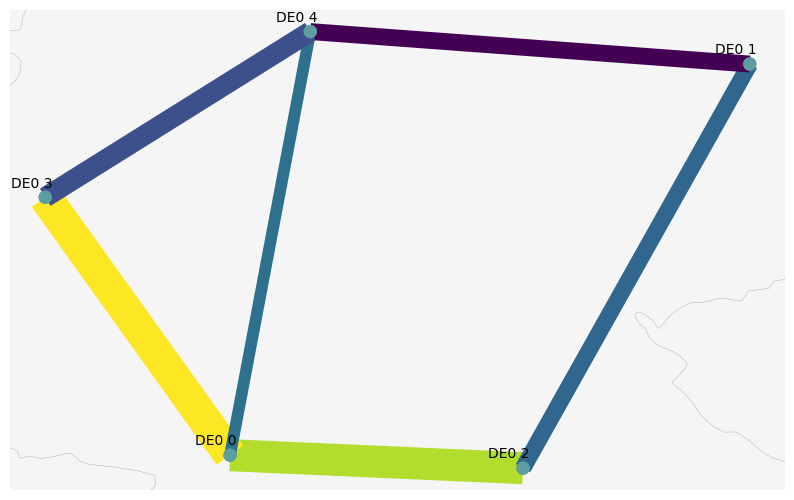

In [14]:
loading = (n.lines_t.p0.abs().mean().sort_index()/(n.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

n.plot(
    ax=ax,
    branch_components=["Line"],
    line_widths=n.lines.s_nom_opt/1e3, #GW
    line_colors=loading,
    line_cmap=plt.cm.viridis,
    color_geomap=True,
    bus_sizes=0.003
)

bus = n.buses
region = []
for index, row in bus.iterrows():
    x = row['x']
    y = row['y']
    if "H2" in index:
        pass
    else:
        region.append(index)
        ax.annotate(
        index,
        xy=(x, y),
        xytext=(5, 5),  # Adjust the position of the annotation
        textcoords="offset points",
        ha='right', va='bottom'
    )

plt.show


## Installed Capacity Map Plot

In [15]:
#color list for installed cap
tech_list = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
tech_list.remove('load')
color_cap = []

for i in range(len(tech_list)):
    for j in range(len(n.carriers.index)):
        if tech_list[i] == n.carriers.index[j]:
            color_cap.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  

cap = n.generators[n.generators['carrier']!='load'].groupby(['bus', 'carrier']).p_nom_opt.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\3847545614.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_cap.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


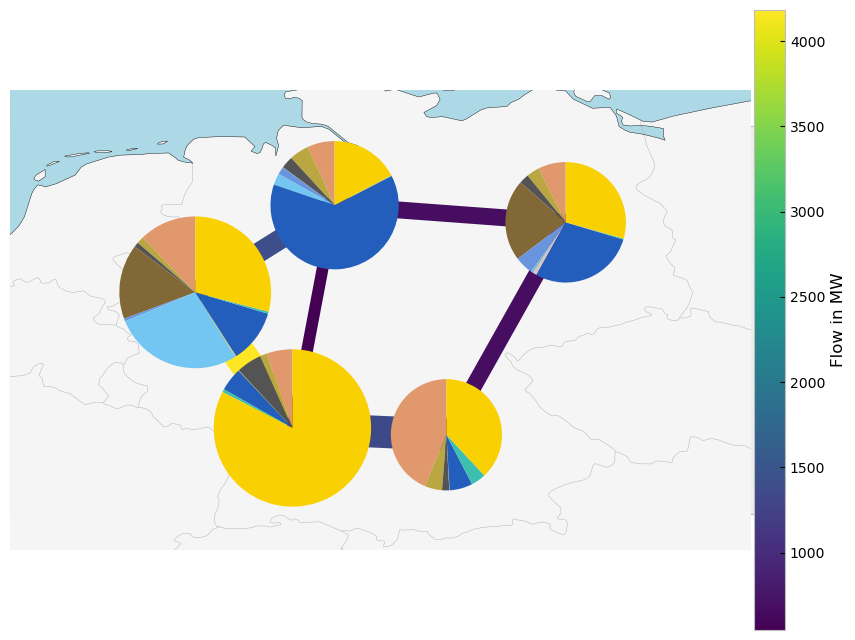

In [16]:
fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

collection = n.plot(
    bus_sizes=cap / 5e4,
    bus_colors = color_cap,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
        
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Generation Map Plot

In [17]:
#color list for energy generated 
tech_list_gen_table = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
colors_gen_table = []

for i in range(len(tech_list_gen_table)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen_table[i] == n.carriers.index[j]:
            colors_gen_table.append(n.carriers.color[j])
            break  # break the inner loop once a match is found 

#Adjust Load shedding's unit to MW from kW
#for column in n.generators_t.p.columns:
#    if column.endswith('load') and not column.endswith('H2 load'):
#        n.generators_t.p[column]/=1e3
        

gen = n.generators.assign(g=n.generators_t.p.mean()).groupby(["bus", "carrier"]).g.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\971004373.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen_table.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


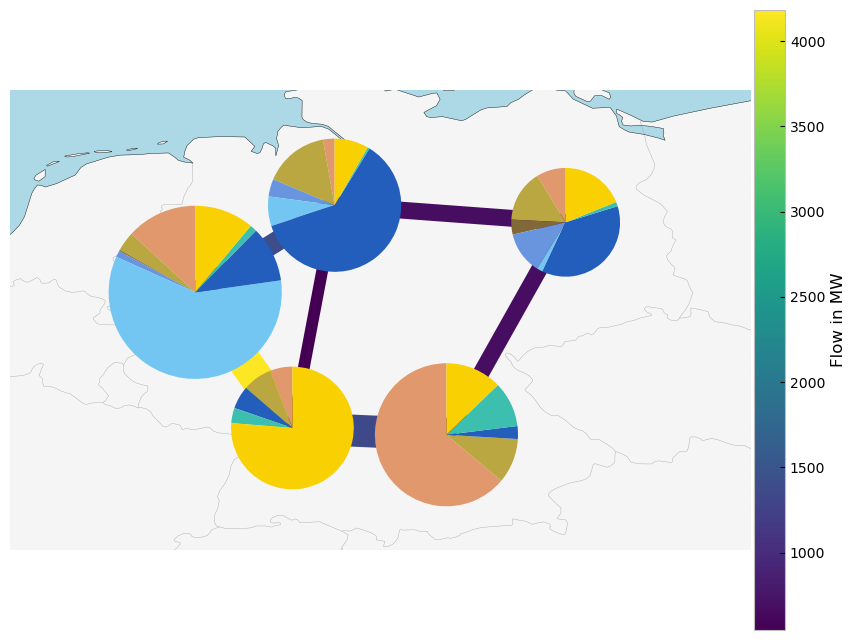

In [18]:
carriers = n.generators.carrier.unique()

plt.figure(figsize =(10,10))

collection = n.plot(
    bus_sizes=gen / 1e4,
    bus_colors = colors_gen_table,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

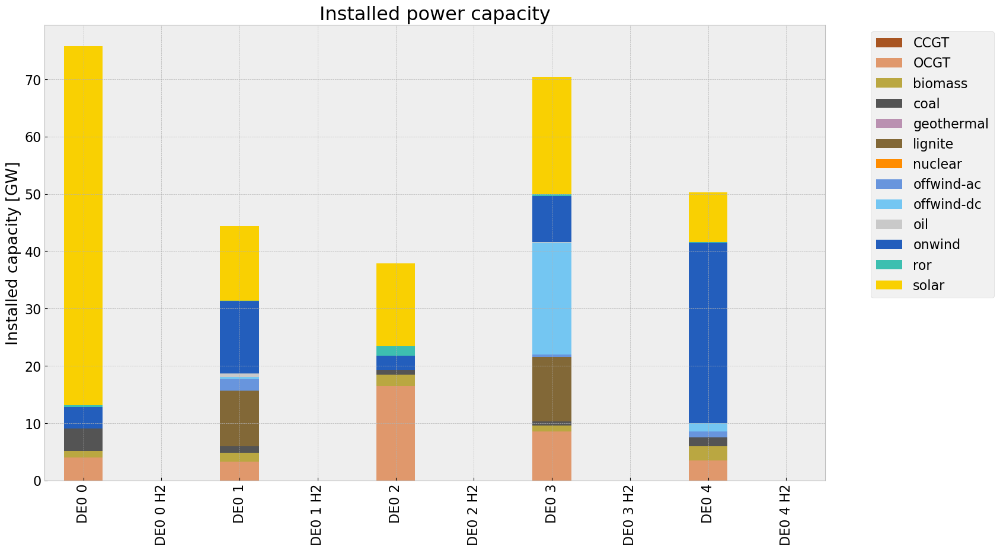

In [19]:
def inst_cap_table(n,colors):

    capacities = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)
    gen = (capacities.unstack()/1000).drop(columns=['load'],inplace=False)
    gen.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    gen.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return capacities

# consolidated istalled cap without load_shedding

#capacities_base = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_base.fillna(0, inplace=True)
#gen = (capacities_base.unstack()/1000).drop(columns=['load'],inplace=False)

capacities_base = inst_cap_table(n, color_cap)

## Generation

<Figure size 640x480 with 0 Axes>

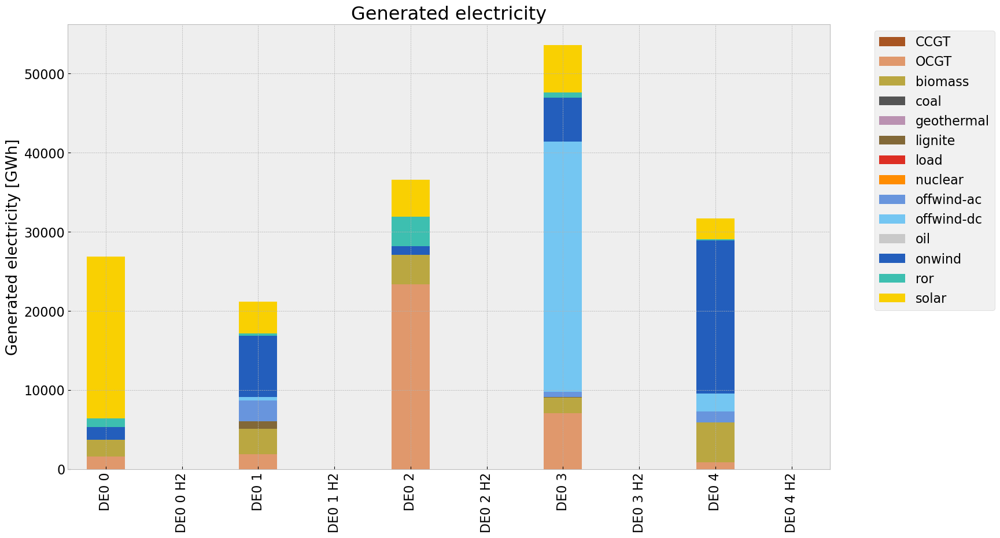

In [20]:
def gen_power_table(n, color):

    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack()/1000)#GWh
    #generations['load']/=1e3


    plt.figure()
    plt.rcParams.update({'font.size': 16})

    generations.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=color,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                title=f"Generated electricity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return generations

gen_base = gen_power_table(n,colors_gen_table)

## Snapshot

In [21]:
sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()
links = n.links_t.p0.groupby(n.links.carrier, axis =1).sum().drop(['DC','H2 electrolysis'], axis=1, inplace =False).head()
tech_list_gen = pd.concat([tech_list_gen, sto], axis=1).columns.tolist()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\3551839577.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\3551839577.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\3551839577.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p0.groupby(n.links.carrier, axis =1).sum().drop(['DC','H2 electrolysis'], axis=1, inplace =False).head()


In [22]:
colors_gen = []

for i in range(len(tech_list_gen)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen[i] == n.carriers.index[j]:
            colors_gen.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\3660868222.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen.append(n.carriers.color[j])


In [23]:
def gen_curve(n, start, end, colors):

    plt.rcParams.update({'font.size': 16})


    p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
    #p_by_carrier['load'] /= 1e3

    #links fuel cell
    links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
    links = links.drop(columns='DC', inplace=False)
    links['H2 fuel cell']*=-1
       
    # join generator, links, and storage unit
    if not n.storage_units.empty:
        sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)     
        p_by_carrier = pd.concat([p_by_carrier, sto, links], axis=1)
        
    p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    start_date = start
    end_date = end
    
    # Create a date range for the specified time range
    time = pd.date_range(start=start_date, end=end_date, freq='3H')
    
    fig, ax = plt.subplots(figsize=(20, 10))
    
    p_no_H = p_by_carrier.drop(columns = 'H2 electrolysis', inplace = False)
    p_no_H.where(p_no_H>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta", "purple", "grey"],
            grid=True,
        )
    
    loads = n.loads_t.p_set.sum(axis=1).div(1e3)
    loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
    
    loads.loc[time].plot(ax=ax, c='k',grid=True)


    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production")


    ax.set_ylim(-50,150)

In [24]:
#e_balance = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC",:].droplevel(2)
#e_balance.to_excel('energybalance.xlsx', index=True) 


In [25]:
#tes = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC", :].droplevel(2)
#tes.to_csv('energybalance.csv', index=True)

In [26]:
#n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)


In [27]:
#p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].sum(axis=1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='203

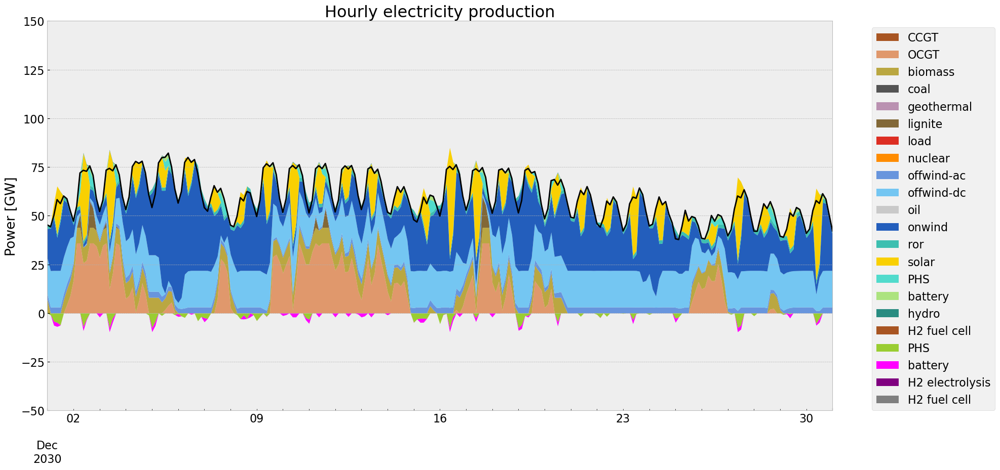

In [28]:
# winter
gen_curve(n, '2030-12-01', '2030-12-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='203

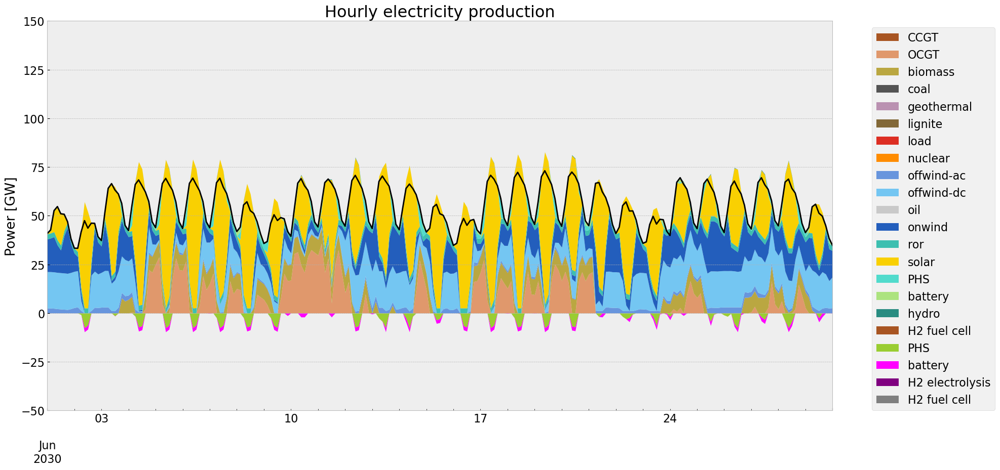

In [29]:
#summer
gen_curve(n, '2030-06-01', '2030-06-30', colors_gen)

## Storage

In [30]:
def inst_store_table(n):
    
    plt.rcParams.update({'font.size': 16})

    (n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["yellowgreen","magenta","red","blue"],
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                #title=f"Installed power capacities of storage systems in Italy in {year}",
                                ylim=[0,20]
    )

    return n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000

carrier,PHS,battery,hydro
bus,,,
DE0 0,2.10300,0.000000,0.1200
DE0 1,0.99980,0.000000,NaN
DE0 2,1.85500,0.000000,0.1695
DE0 3,1.74142,2.054674,NaN
DE0 4,0.90000,0.000000,NaN


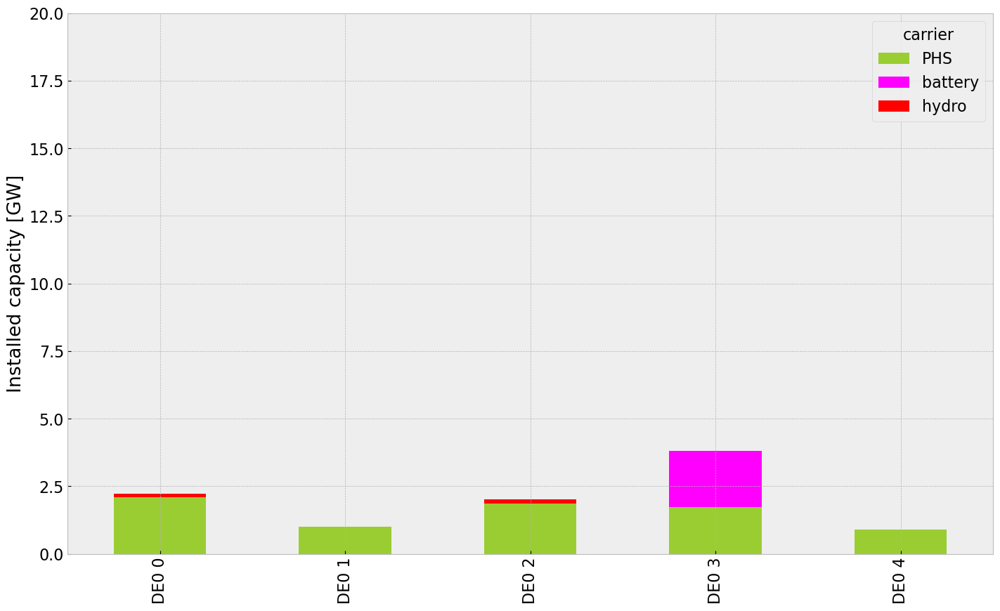

In [31]:
inst_store_table(n)

In [32]:
n.stores.groupby(['bus','carrier']).e_nom_opt.sum().unstack()/1000

carrier,H2
bus,
DE0 0 H2,0.0
DE0 1 H2,0.0
DE0 2 H2,0.0
DE0 3 H2,0.0
DE0 4 H2,0.0


carrier,H2
bus,
DE0 0 H2,0.0
DE0 1 H2,0.0
DE0 2 H2,0.0
DE0 3 H2,0.0
DE0 4 H2,0.0


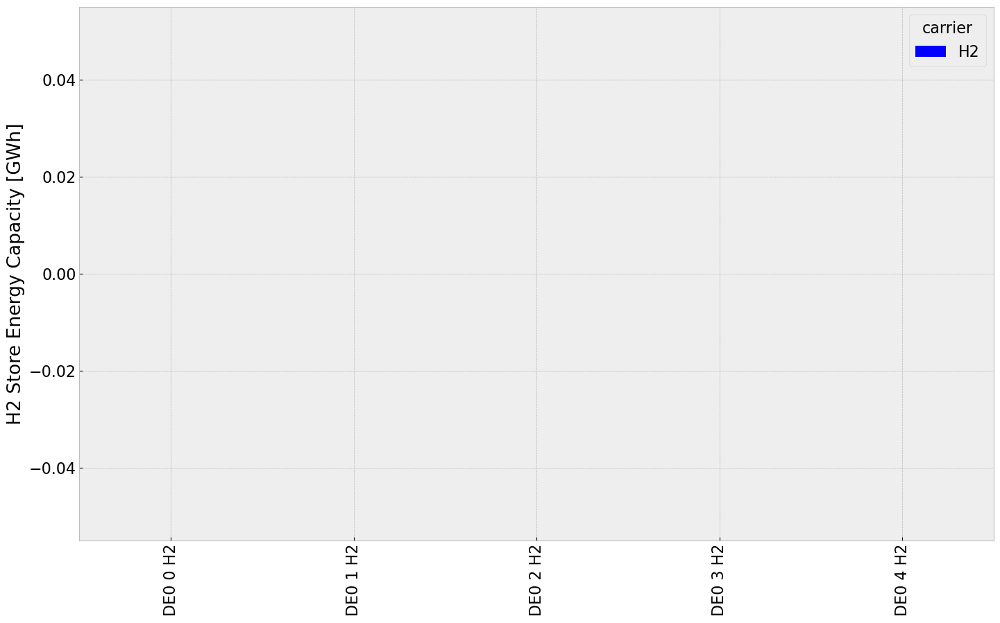

In [33]:
def inst_storeh2_table(n):
    
    plt.rcParams.update({'font.size': 16})

    (n.stores.groupby(['bus','carrier']).e_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["blue"],
                                grid=True,
                                xlabel="",
                                ylabel="H2 Store Energy Capacity [GWh]",
                                #title=f"Installed power capacities of storage systems in Italy in {year}",
                                #ylim=[0,7500]
    )

    return n.stores.groupby(['bus','carrier']).e_nom_opt.sum().unstack()/1000

inst_storeh2_table(n)

In [34]:
n.stores

,bus,carrier,e_nom_extendable,e_cyclic,capital_cost,marginal_cost,build_year,e_nom_opt,type,e_nom,e_nom_mod,e_nom_min,e_nom_max,e_min_pu,e_max_pu,e_initial,e_initial_per_period,e_cyclic_per_period,p_set,q_set,sign,marginal_cost_quadratic,standing_loss,lifetime
Store,,,,,,,,,,,,,,,,,,,,,,,,
DE0 0 H2,DE0 0 H2,H2,True,True,148.31893,0.009302,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
DE0 1 H2,DE0 1 H2,H2,True,True,148.31893,0.009798,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
DE0 2 H2,DE0 2 H2,H2,True,True,148.31893,0.009482,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
DE0 3 H2,DE0 3 H2,H2,True,True,148.31893,0.009687,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
DE0 4 H2,DE0 4 H2,H2,True,True,148.31893,0.010026,0,0.0,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf


In [35]:
def state_of_charge_plot(n):
    
    soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)

    soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    soc.plot(ax=ax,
        grid=True,
        ylabel="State of charge [GWh]",
        xlabel="Time",
        #title=f"State of charge of aggregated storage systems in Italy in {year}",
        linewidth=1.5,
)

plt.show(n)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


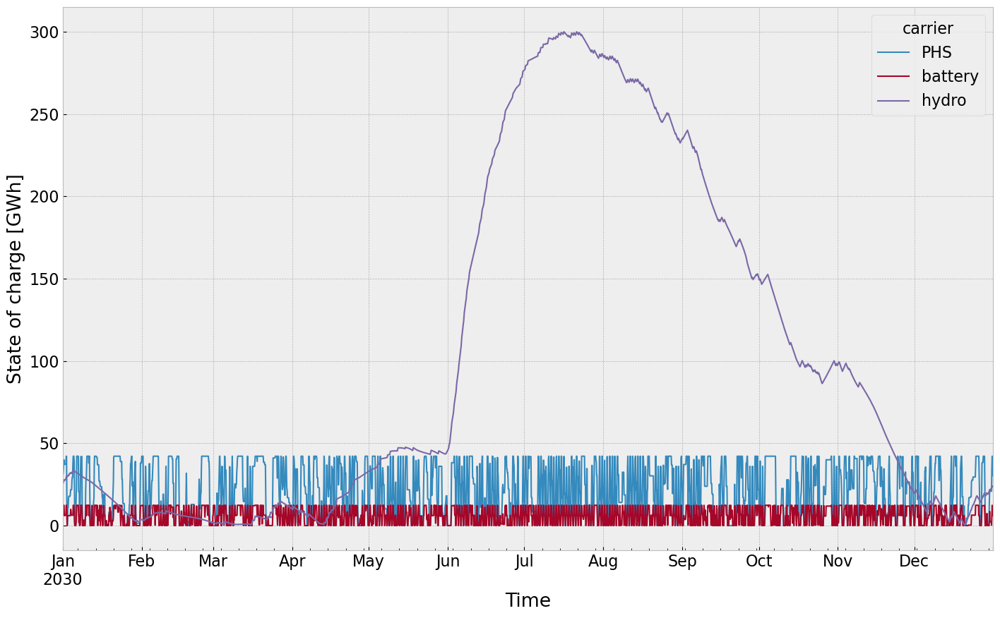

In [36]:
state_of_charge_plot(n)

## Electricity Price

In [37]:
def price_dur_curve_plot(n):

    #buses without store
    columns_to_keep =[]

    for i in n.buses_t.marginal_price.columns.tolist():
        if not i.endswith('H2'):
            columns_to_keep.append(i)
    
    price_dur_curve = pd.DataFrame()
    for region in columns_to_keep:
        price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    price_dur_curve.plot(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Time steps",
                    #title=f"Duration curves of the marginal price in the Italian regions in {year}",
                    linewidth=3,
)

plt.show()

In [38]:
columns_to_keep =[]

for i in n.buses_t.marginal_price.columns.tolist():
    if not i.endswith('H2'):
        columns_to_keep.append(i)
    


#buses without store
columns_to_keep =[]

price_dur_curve = pd.DataFrame()
for region in columns_to_keep:
    price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)


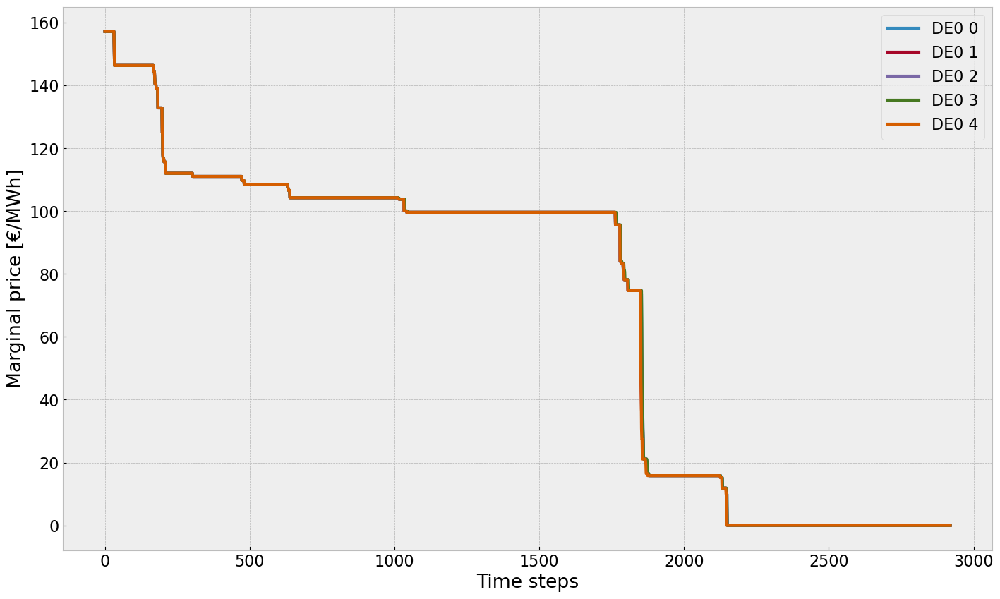

In [39]:
price_dur_curve_plot(n)

In [40]:
def price_regions_table(n):

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    
    region = n.buses_t.marginal_price.mean()
    #for index, value in region.items():
    #    if index.endswith('H2'):
     #       region = region.drop(index)
    
    region.plot.bar(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Region",
                    title=f"Average marginal price",
                    linewidth=3,
    
    )

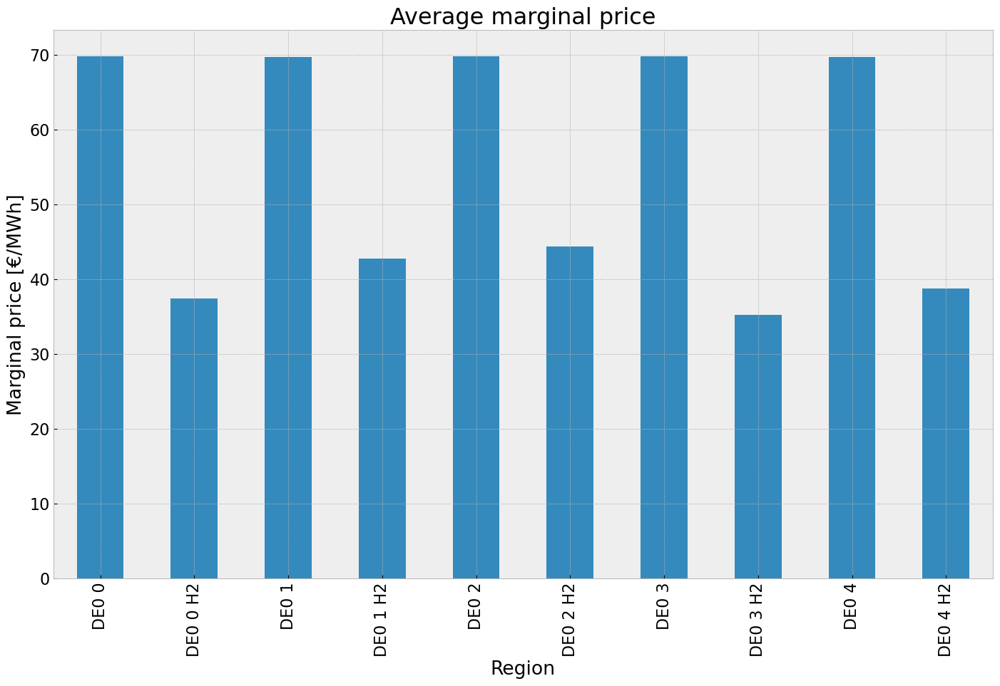

In [41]:
price_regions_table(n)

In [42]:
def price_regions(n):
    # Assuming 'n.buses_t.marginal_price' returns a DataFrame or similar structure with 'mean()' method
    mean_p = n.buses_t.marginal_price.mean()

    hprice = mean_p.filter(like='H2')
    eprice = mean_p.drop(hprice.index)

    # Setup figure and subplots with 1 row and 2 columns
    fig, axs = plt.subplots(1, 2, subplot_kw={"projection": ccrs.PlateCarree()}, figsize=(16, 8))
    
    # Plot for hprice
    hprice_plot = axs[0].hexbin(
        n.buses.x.filter(like='H2'),  # Assuming n.buses.x and n.buses.y hold the coordinates
        n.buses.y.filter(like='H2'),
        gridsize=20,
        C=hprice,
        cmap=plt.cm.jet,
        zorder=3,
    )
    n.plot(ax=axs[0], line_widths=pd.Series(0.5, n.lines.index), bus_sizes=0)  # Plot network on the first subplot
    cb = fig.colorbar(hprice_plot, ax=axs[0], location="bottom")
    cb.set_label("Mean H2 Marginal Price (EUR/MWh) for H2")

    # Plot for eprice
    eprice_plot = axs[1].hexbin(
        n.buses.x[~n.buses.x.index.str.contains('H2')],
        n.buses.y[~n.buses.x.index.str.contains('H2')],
        gridsize=20,
        C=eprice,
        cmap=plt.cm.jet,
        zorder=3,
    )
    n.plot(ax=axs[1], line_widths=pd.Series(0.5, n.lines.index), bus_sizes=0)  # Plot network on the second subplot
    cb = fig.colorbar(eprice_plot, ax=axs[1], location="bottom")
    cb.set_label("Mean Electricity Marginal Price (EUR/MWh)")

    fig.tight_layout()

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


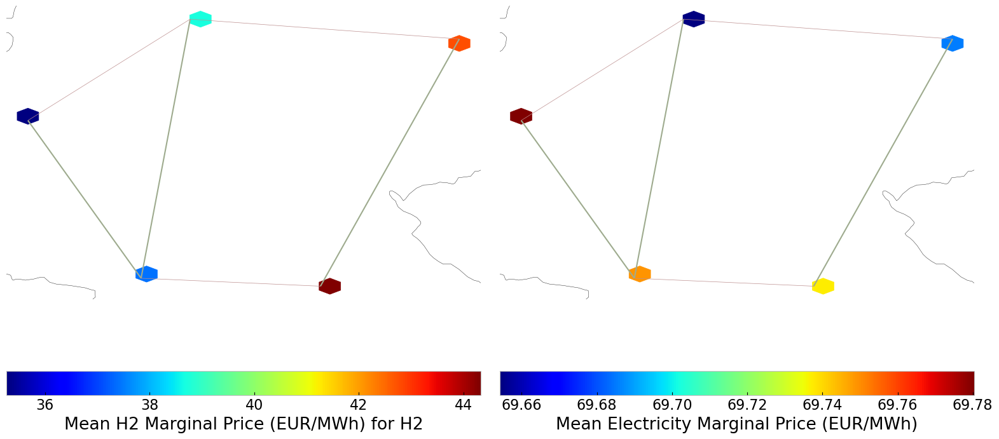

In [43]:
price_regions(n)

## Emission

In [44]:
def em_table(n):
    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack())#MWh

    #mean efficiency of each carrier
    eff = n.generators.groupby('carrier').efficiency.mean()

    e = generations.sum()
    emission = []

    for index in e.index:
        for index_c in n.carriers.index:
            for index_eff in eff.index:
                if index == index_c == index_eff:
                    em = n.carriers.loc[index_c,"co2_emissions"]
                    emission.append(em)

    df = e.to_frame()
    df.rename(columns={0: 'Generation in MWh'}, inplace=True)
    df['efficiency'] = eff
    df['emissions in Tonnes CO2/MWh'] = emission
    df['emissions in Tonnes CO2']= df['Generation in MWh']/df['efficiency']*df['emissions in Tonnes CO2/MWh']
    df['emissions in Tonnes CO2'].sum() 
    return df

em_base =em_table(n)
em_base

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,3.475453e+07,0.499437,0.1980,1.377831e+07
biomass,1.604494e+07,0.468000,0.0000,0.000000e+00
coal,0.000000e+00,0.329632,0.3361,0.000000e+00
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,1.067147e+06,0.358368,0.4069,1.211667e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,4.633218e+06,1.000000,0.0000,0.000000e+00


# Solar Cut Scenario
Cut start: 01.01.2013 
Cut end: 30.11.2013
reduction on capacity: 100%


In [45]:
#copy network
n1=n.copy()

#p_max_pu of pv generators across all regions are subtracted by 10% from 01.06.2013 to 31.12.13
cut_start=pd.to_datetime('2013-01-01 00:00:00')
cut_end = pd.to_datetime('2013-10-31 21:00:00')

for column in n1.generators_t.p_max_pu.columns:
        if column.endswith('solar'):
                for index,row in n1.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index <= cut_end:
                                new_p_max_pu = n1.generators_t.p_max_pu.at[index, column] * 0.0 #0.9
                                n1.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                #if new_p_max_pu<0:
                                #    n1.generators_t.p_max_pu.at[index, column] = 0


#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n1.generators.p_nom_extendable.items():
    if value:  
        n1.generators.at[index, 'p_nom_min'] = n.generators.at[index, 'p_nom_opt']


#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n1.storage_units.p_nom_extendable.items():
    if value:  
        n1.storage_units.at[index, 'p_nom_min'] = n.storage_units.at[index, 'p_nom_opt']

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n1.lines.s_nom_extendable.items():
    if value:  
        n1.lines.at[index, 's_nom_min'] = n.lines.at[index, 's_nom_opt']

                        

## 1. Scenario: allow additional investment of extendable generators and storage

In [46]:
n1.optimize.create_model()


Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')


Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * Store-e_nom (Store-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * Store-e (snapshot, Store)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * Store-p (snapshot, Store)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Store-ext-e_nom-lower (Store-ext)
 * Store-ext-e_nom-upper (Store-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-

In [47]:
#solve network
n1.optimize(solver_name='gurobi')

Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')


Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 15/15 [00:01<00:00,  9.89it/s]
INFO:linopy.io: Writing time: 10.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hh_7pvk2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hh_7pvk2.lp


Reading time = 3.05 seconds


INFO:gurobipy:Reading time = 3.05 seconds


obj: 849796 rows, 402989 columns, 1558419 nonzeros


INFO:gurobipy:obj: 849796 rows, 402989 columns, 1558419 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 849796 rows, 402989 columns and 1558419 nonzeros


INFO:gurobipy:Optimize a model with 849796 rows, 402989 columns and 1558419 nonzeros


Model fingerprint: 0x0f59ed6b


INFO:gurobipy:Model fingerprint: 0x0f59ed6b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [1e+01, 9e+09]


INFO:gurobipy:  Bounds range     [1e+01, 9e+09]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 613745 rows and 109040 columns


INFO:gurobipy:Presolve removed 613745 rows and 109040 columns


Presolve time: 1.57s


INFO:gurobipy:Presolve time: 1.57s


Presolved: 236051 rows, 293949 columns, 853629 nonzeros


INFO:gurobipy:Presolved: 236051 rows, 293949 columns, 853629 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.40s


INFO:gurobipy:Ordering time: 0.40s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 45


INFO:gurobipy: Dense cols : 45


 AA' NZ     : 8.138e+05


INFO:gurobipy: AA' NZ     : 8.138e+05


 Factor NZ  : 4.465e+06 (roughly 250 MB of memory)


INFO:gurobipy: Factor NZ  : 4.465e+06 (roughly 250 MB of memory)


 Factor Ops : 3.152e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.152e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.35228133e+17 -1.63013382e+18  4.52e+09 5.33e+04  4.64e+13     3s


INFO:gurobipy:   0   1.35228133e+17 -1.63013382e+18  4.52e+09 5.33e+04  4.64e+13     3s


   1   1.24907010e+17 -5.71183871e+17  3.97e+09 1.63e+04  2.79e+13     3s


INFO:gurobipy:   1   1.24907010e+17 -5.71183871e+17  3.97e+09 1.63e+04  2.79e+13     3s


   2   1.08188927e+17 -3.83787259e+17  3.06e+09 9.30e+03  2.03e+13     4s


INFO:gurobipy:   2   1.08188927e+17 -3.83787259e+17  3.06e+09 9.30e+03  2.03e+13     4s


   3   8.11708087e+16 -1.42413686e+17  1.20e+09 1.67e+03  7.83e+12     4s


INFO:gurobipy:   3   8.11708087e+16 -1.42413686e+17  1.20e+09 1.67e+03  7.83e+12     4s


   4   4.20588359e+16 -2.31403827e+16  2.14e+08 2.82e+02  1.44e+12     5s


INFO:gurobipy:   4   4.20588359e+16 -2.31403827e+16  2.14e+08 2.82e+02  1.44e+12     5s


   5   8.35168322e+15 -2.30018916e+15  8.15e+06 2.87e+01  7.38e+10     5s


INFO:gurobipy:   5   8.35168322e+15 -2.30018916e+15  8.15e+06 2.87e+01  7.38e+10     5s


   6   1.43719792e+15 -3.55333601e+14  3.92e+05 3.37e+00  5.78e+09     6s


INFO:gurobipy:   6   1.43719792e+15 -3.55333601e+14  3.92e+05 3.37e+00  5.78e+09     6s


   7   2.70167101e+14 -1.39218420e+14  5.65e+04 9.73e-01  1.06e+09     6s


INFO:gurobipy:   7   2.70167101e+14 -1.39218420e+14  5.65e+04 9.73e-01  1.06e+09     6s


   8   1.74851063e+14 -3.24333263e+13  3.55e+04 5.43e-02  4.97e+08     7s


INFO:gurobipy:   8   1.74851063e+14 -3.24333263e+13  3.55e+04 5.43e-02  4.97e+08     7s


   9   6.53656440e+13 -1.62437411e+13  1.26e+04 2.66e-03  1.80e+08     7s


INFO:gurobipy:   9   6.53656440e+13 -1.62437411e+13  1.26e+04 2.66e-03  1.80e+08     7s


  10   1.00893469e+13 -8.45502908e+12  1.77e+03 5.14e-04  3.51e+07     8s


INFO:gurobipy:  10   1.00893469e+13 -8.45502908e+12  1.77e+03 5.14e-04  3.51e+07     8s


  11   2.01864687e+12 -2.36686363e+12  2.81e+02 8.71e-05  7.52e+06     8s


INFO:gurobipy:  11   2.01864687e+12 -2.36686363e+12  2.81e+02 8.71e-05  7.52e+06     8s


  12   1.00996902e+12 -1.14006732e+12  1.33e+02 3.89e-05  3.61e+06     8s


INFO:gurobipy:  12   1.00996902e+12 -1.14006732e+12  1.33e+02 3.89e-05  3.61e+06     8s


  13   7.46626027e+11 -4.35004362e+11  9.55e+01 1.42e-05  1.96e+06     9s


INFO:gurobipy:  13   7.46626027e+11 -4.35004362e+11  9.55e+01 1.42e-05  1.96e+06     9s


  14   3.58168890e+11 -3.55825537e+11  4.17e+01 1.15e-05  1.17e+06     9s


INFO:gurobipy:  14   3.58168890e+11 -3.55825537e+11  4.17e+01 1.15e-05  1.17e+06     9s


  15   2.28668023e+11 -1.75056927e+11  2.34e+01 6.22e-06  6.60e+05     9s


INFO:gurobipy:  15   2.28668023e+11 -1.75056927e+11  2.34e+01 6.22e-06  6.60e+05     9s


  16   1.32244938e+11 -1.51361653e+11  1.11e+01 5.47e-06  4.62e+05    10s


INFO:gurobipy:  16   1.32244938e+11 -1.51361653e+11  1.11e+01 5.47e-06  4.62e+05    10s


  17   8.92293468e+10 -8.71450903e+10  5.94e+00 3.53e-06  2.87e+05    10s


INFO:gurobipy:  17   8.92293468e+10 -8.71450903e+10  5.94e+00 3.53e-06  2.87e+05    10s


  18   6.75219171e+10 -4.97897157e+10  3.57e+00 2.42e-06  1.91e+05    11s


INFO:gurobipy:  18   6.75219171e+10 -4.97897157e+10  3.57e+00 2.42e-06  1.91e+05    11s


  19   5.82706814e+10 -2.49789828e+10  2.57e+00 1.69e-06  1.35e+05    11s


INFO:gurobipy:  19   5.82706814e+10 -2.49789828e+10  2.57e+00 1.69e-06  1.35e+05    11s


  20   5.40949624e+10 -1.28788207e+10  2.12e+00 1.33e-06  1.09e+05    12s


INFO:gurobipy:  20   5.40949624e+10 -1.28788207e+10  2.12e+00 1.33e-06  1.09e+05    12s


  21   5.15901729e+10  4.75007074e+09  1.86e+00 8.01e-07  7.60e+04    12s


INFO:gurobipy:  21   5.15901729e+10  4.75007074e+09  1.86e+00 8.01e-07  7.60e+04    12s


  22   4.77278687e+10  1.54549025e+10  1.50e+00 4.74e-07  5.24e+04    13s


INFO:gurobipy:  22   4.77278687e+10  1.54549025e+10  1.50e+00 4.74e-07  5.24e+04    13s


  23   4.17328723e+10  1.87421437e+10  9.54e-01 3.67e-07  3.73e+04    13s


INFO:gurobipy:  23   4.17328723e+10  1.87421437e+10  9.54e-01 3.67e-07  3.73e+04    13s


  24   3.87253298e+10  2.29258711e+10  6.92e-01 2.28e-07  2.56e+04    14s


INFO:gurobipy:  24   3.87253298e+10  2.29258711e+10  6.92e-01 2.28e-07  2.56e+04    14s


  25   3.53191314e+10  2.43512255e+10  4.11e-01 1.79e-07  1.78e+04    14s


INFO:gurobipy:  25   3.53191314e+10  2.43512255e+10  4.11e-01 1.79e-07  1.78e+04    14s


  26   3.42387597e+10  2.63103660e+10  3.25e-01 1.15e-07  1.29e+04    15s


INFO:gurobipy:  26   3.42387597e+10  2.63103660e+10  3.25e-01 1.15e-07  1.29e+04    15s


  27   3.28949404e+10  2.69309454e+10  2.19e-01 9.57e-08  9.67e+03    16s


INFO:gurobipy:  27   3.28949404e+10  2.69309454e+10  2.19e-01 9.57e-08  9.67e+03    16s


  28   3.21076497e+10  2.77070621e+10  1.58e-01 7.05e-08  7.14e+03    16s


INFO:gurobipy:  28   3.21076497e+10  2.77070621e+10  1.58e-01 7.05e-08  7.14e+03    16s


  29   3.14684157e+10  2.82578280e+10  1.08e-01 5.41e-08  5.21e+03    17s


INFO:gurobipy:  29   3.14684157e+10  2.82578280e+10  1.08e-01 5.41e-08  5.21e+03    17s


  30   3.11163040e+10  2.84764574e+10  8.21e-02 4.71e-08  4.28e+03    17s


INFO:gurobipy:  30   3.11163040e+10  2.84764574e+10  8.21e-02 4.71e-08  4.28e+03    17s


  31   3.09717719e+10  2.85561052e+10  7.14e-02 4.46e-08  3.92e+03    18s


INFO:gurobipy:  31   3.09717719e+10  2.85561052e+10  7.14e-02 4.46e-08  3.92e+03    18s


  32   3.07355028e+10  2.88140825e+10  5.37e-02 3.64e-08  3.12e+03    18s


INFO:gurobipy:  32   3.07355028e+10  2.88140825e+10  5.37e-02 3.64e-08  3.12e+03    18s


  33   3.05720981e+10  2.88968635e+10  4.21e-02 3.37e-08  2.72e+03    19s


INFO:gurobipy:  33   3.05720981e+10  2.88968635e+10  4.21e-02 3.37e-08  2.72e+03    19s


  34   3.03969959e+10  2.92991240e+10  2.97e-02 2.05e-08  1.78e+03    20s


INFO:gurobipy:  34   3.03969959e+10  2.92991240e+10  2.97e-02 2.05e-08  1.78e+03    20s


  35   3.02467688e+10  2.93841137e+10  1.97e-02 1.76e-08  1.40e+03    20s


INFO:gurobipy:  35   3.02467688e+10  2.93841137e+10  1.97e-02 1.76e-08  1.40e+03    20s


  36   3.02030070e+10  2.94725996e+10  1.67e-02 1.49e-08  1.18e+03    21s


INFO:gurobipy:  36   3.02030070e+10  2.94725996e+10  1.67e-02 1.49e-08  1.18e+03    21s


  37   3.01463158e+10  2.95732951e+10  1.31e-02 1.16e-08  9.29e+02    21s


INFO:gurobipy:  37   3.01463158e+10  2.95732951e+10  1.31e-02 1.16e-08  9.29e+02    21s


  38   3.01172122e+10  2.95989931e+10  1.13e-02 1.07e-08  8.40e+02    22s


INFO:gurobipy:  38   3.01172122e+10  2.95989931e+10  1.13e-02 1.07e-08  8.40e+02    22s


  39   3.00662526e+10  2.96785698e+10  8.09e-03 8.20e-09  6.29e+02    22s


INFO:gurobipy:  39   3.00662526e+10  2.96785698e+10  8.09e-03 8.20e-09  6.29e+02    22s


  40   3.00265507e+10  2.97314317e+10  5.65e-03 6.43e-09  4.79e+02    22s


INFO:gurobipy:  40   3.00265507e+10  2.97314317e+10  5.65e-03 6.43e-09  4.79e+02    22s


  41   3.00046185e+10  2.97761764e+10  4.34e-03 4.95e-09  3.70e+02    23s


INFO:gurobipy:  41   3.00046185e+10  2.97761764e+10  4.34e-03 4.95e-09  3.70e+02    23s


  42   2.99799317e+10  2.98370347e+10  2.91e-03 2.91e-09  2.32e+02    23s


INFO:gurobipy:  42   2.99799317e+10  2.98370347e+10  2.91e-03 2.91e-09  2.32e+02    23s


  43   2.99661538e+10  2.98519583e+10  2.14e-03 2.41e-09  1.85e+02    24s


INFO:gurobipy:  43   2.99661538e+10  2.98519583e+10  2.14e-03 2.41e-09  1.85e+02    24s


  44   2.99541726e+10  2.98716964e+10  1.47e-03 1.75e-09  1.34e+02    24s


INFO:gurobipy:  44   2.99541726e+10  2.98716964e+10  1.47e-03 1.75e-09  1.34e+02    24s


  45   2.99450323e+10  2.98836636e+10  9.74e-04 1.36e-09  9.95e+01    25s


INFO:gurobipy:  45   2.99450323e+10  2.98836636e+10  9.74e-04 1.36e-09  9.95e+01    25s


  46   2.99382328e+10  2.99070735e+10  6.15e-04 5.90e-10  5.05e+01    25s


INFO:gurobipy:  46   2.99382328e+10  2.99070735e+10  6.15e-04 5.90e-10  5.05e+01    25s


  47   2.99316341e+10  2.99156725e+10  2.79e-04 3.43e-10  2.59e+01    26s


INFO:gurobipy:  47   2.99316341e+10  2.99156725e+10  2.79e-04 3.43e-10  2.59e+01    26s


  48   2.99285796e+10  2.99206976e+10  1.28e-04 8.98e-10  1.28e+01    26s


INFO:gurobipy:  48   2.99285796e+10  2.99206976e+10  1.28e-04 8.98e-10  1.28e+01    26s


  49   2.99273838e+10  2.99227854e+10  7.32e-05 5.87e-10  7.46e+00    27s


INFO:gurobipy:  49   2.99273838e+10  2.99227854e+10  7.32e-05 5.87e-10  7.46e+00    27s


  50   2.99270953e+10  2.99240732e+10  6.09e-05 2.60e-10  4.90e+00    27s


INFO:gurobipy:  50   2.99270953e+10  2.99240732e+10  6.09e-05 2.60e-10  4.90e+00    27s


  51   2.99270633e+10  2.99241192e+10  5.96e-05 2.12e-10  4.77e+00    27s


INFO:gurobipy:  51   2.99270633e+10  2.99241192e+10  5.96e-05 2.12e-10  4.77e+00    27s


  52   2.99269296e+10  2.99241438e+10  5.40e-05 1.74e-10  4.52e+00    28s


INFO:gurobipy:  52   2.99269296e+10  2.99241438e+10  5.40e-05 1.74e-10  4.52e+00    28s


  53   2.99260651e+10  2.99244926e+10  2.18e-05 2.74e-10  2.55e+00    28s


INFO:gurobipy:  53   2.99260651e+10  2.99244926e+10  2.18e-05 2.74e-10  2.55e+00    28s


  54   2.99257552e+10  2.99252521e+10  1.73e-05 8.06e-10  8.16e-01    28s


INFO:gurobipy:  54   2.99257552e+10  2.99252521e+10  1.73e-05 8.06e-10  8.16e-01    28s


  55   2.99257184e+10  2.99253283e+10  1.23e-05 5.06e-10  6.33e-01    29s


INFO:gurobipy:  55   2.99257184e+10  2.99253283e+10  1.23e-05 5.06e-10  6.33e-01    29s


  56   2.99256733e+10  2.99254701e+10  6.06e-06 3.38e-10  3.29e-01    30s


INFO:gurobipy:  56   2.99256733e+10  2.99254701e+10  6.06e-06 3.38e-10  3.29e-01    30s


  57   2.99256630e+10  2.99255228e+10  4.91e-06 1.13e-10  2.27e-01    30s


INFO:gurobipy:  57   2.99256630e+10  2.99255228e+10  4.91e-06 1.13e-10  2.27e-01    30s


  58   2.99256520e+10  2.99255517e+10  3.62e-06 4.96e-10  1.63e-01    31s


INFO:gurobipy:  58   2.99256520e+10  2.99255517e+10  3.62e-06 4.96e-10  1.63e-01    31s


  59   2.99256444e+10  2.99255826e+10  2.81e-06 4.67e-10  1.00e-01    31s


INFO:gurobipy:  59   2.99256444e+10  2.99255826e+10  2.81e-06 4.67e-10  1.00e-01    31s


  60   2.99256352e+10  2.99255914e+10  1.82e-06 2.69e-10  7.12e-02    31s


INFO:gurobipy:  60   2.99256352e+10  2.99255914e+10  1.82e-06 2.69e-10  7.12e-02    31s


  61   2.99256317e+10  2.99255966e+10  1.52e-06 5.89e-10  5.69e-02    32s


INFO:gurobipy:  61   2.99256317e+10  2.99255966e+10  1.52e-06 5.89e-10  5.69e-02    32s


  62   2.99256224e+10  2.99256103e+10  3.34e-07 3.58e-10  1.96e-02    32s


INFO:gurobipy:  62   2.99256224e+10  2.99256103e+10  3.34e-07 3.58e-10  1.96e-02    32s


  63   2.99256189e+10  2.99256145e+10  1.28e-07 2.60e-10  7.09e-03    33s


INFO:gurobipy:  63   2.99256189e+10  2.99256145e+10  1.28e-07 2.60e-10  7.09e-03    33s


  64   2.99256181e+10  2.99256161e+10  6.87e-08 1.92e-10  3.20e-03    34s


INFO:gurobipy:  64   2.99256181e+10  2.99256161e+10  6.87e-08 1.92e-10  3.20e-03    34s


  65   2.99256177e+10  2.99256167e+10  1.49e-07 2.29e-10  1.75e-03    34s


INFO:gurobipy:  65   2.99256177e+10  2.99256167e+10  1.49e-07 2.29e-10  1.75e-03    34s


  66   2.99256175e+10  2.99256170e+10  1.29e-05 6.04e-10  7.79e-04    35s


INFO:gurobipy:  66   2.99256175e+10  2.99256170e+10  1.29e-05 6.04e-10  7.79e-04    35s


  67   2.99256172e+10  2.99256171e+10  2.70e-05 3.18e-09  2.10e-04    35s


INFO:gurobipy:  67   2.99256172e+10  2.99256171e+10  2.70e-05 3.18e-09  2.10e-04    35s


  68   2.99256172e+10  2.99256171e+10  3.96e-05 1.56e-09  5.60e-05    35s


INFO:gurobipy:  68   2.99256172e+10  2.99256171e+10  3.96e-05 1.56e-09  5.60e-05    35s


  69   2.99256171e+10  2.99256171e+10  9.70e-06 2.60e-09  3.87e-06    36s


INFO:gurobipy:  69   2.99256171e+10  2.99256171e+10  9.70e-06 2.60e-09  3.87e-06    36s


  70   2.99256171e+10  2.99256171e+10  1.19e-08 2.63e-09  1.20e-09    36s


INFO:gurobipy:  70   2.99256171e+10  2.99256171e+10  1.19e-08 2.63e-09  1.20e-09    36s


INFO:gurobipy:


Barrier solved model in 70 iterations and 36.04 seconds (11.38 work units)


INFO:gurobipy:Barrier solved model in 70 iterations and 36.04 seconds (11.38 work units)


Optimal objective 2.99256171e+10


INFO:gurobipy:Optimal objective 2.99256171e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  120331 DPushes remaining with DInf 0.0000000e+00                36s


INFO:gurobipy:  120331 DPushes remaining with DInf 0.0000000e+00                36s


       0 DPushes remaining with DInf 0.0000000e+00                37s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                37s


INFO:gurobipy:


   11908 PPushes remaining with PInf 0.0000000e+00                37s


INFO:gurobipy:   11908 PPushes remaining with PInf 0.0000000e+00                37s


       0 PPushes remaining with PInf 0.0000000e+00                38s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                38s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.1000970e-09     38s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.1000970e-09     38s


INFO:gurobipy:


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   81949    2.9925617e+10   0.000000e+00   0.000000e+00     39s


INFO:gurobipy:   81949    2.9925617e+10   0.000000e+00   0.000000e+00     39s


INFO:gurobipy:


Solved in 81949 iterations and 38.77 seconds (12.62 work units)


INFO:gurobipy:Solved in 81949 iterations and 38.77 seconds (12.62 work units)


Optimal objective  2.992561713e+10


INFO:gurobipy:Optimal objective  2.992561713e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 402989 primals, 849796 duals
Objective: 2.99e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [48]:
tot_cos_inv=n1.objective/1e9 # billion €
system_cost_inv = system_cost(n1) #million€/a
marg_price_region_inv = n1.buses_t.marginal_price.mean()
stat_inv = n1.statistics()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

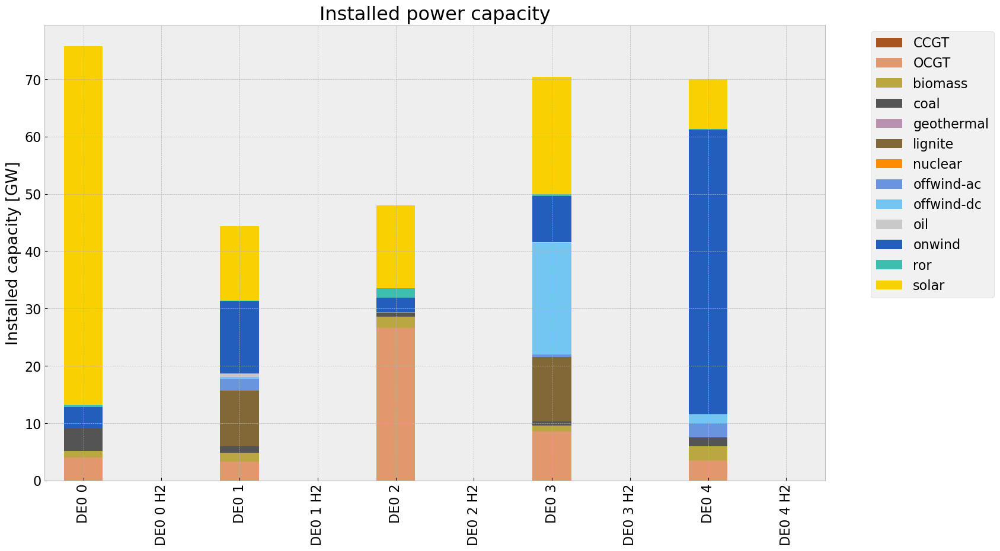

In [49]:
# consolidated istalled cap without load_shedding

capacities_inv = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_inv.fillna(0, inplace=True)
gen_1 = (capacities_inv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_inv = inst_cap_table(n1, color_cap)


## Generation

<Figure size 640x480 with 0 Axes>

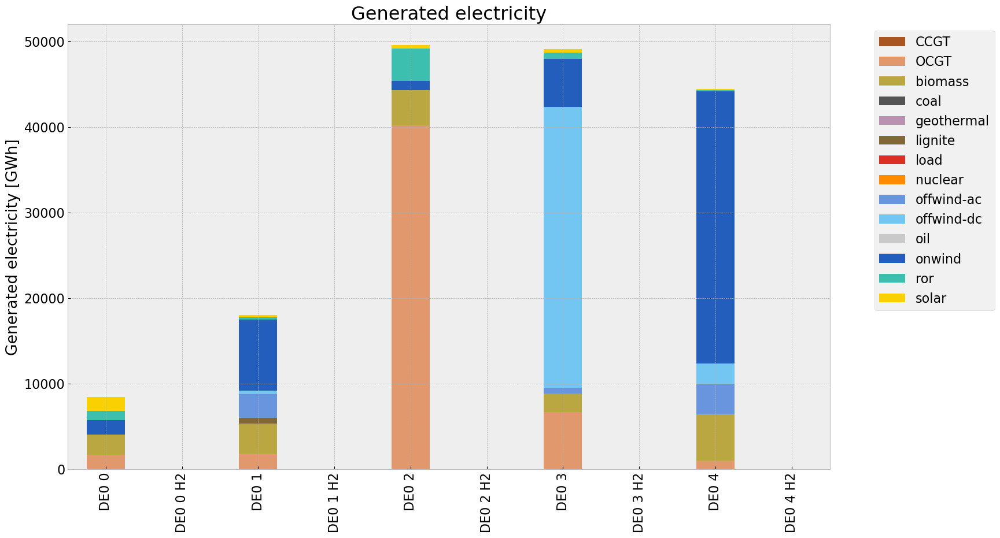

In [50]:
# consolidated generation table
carrier = n1.generators.carrier.unique()
df_tot_generation = n1.generators_t.p.sum()

generations = pd.Series(index = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
                
generations.fillna(0, inplace=True)
gen_inv = generations.unstack()/1000#Gwh


gen_inv = gen_power_table(n1,colors_gen_table)



## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='203

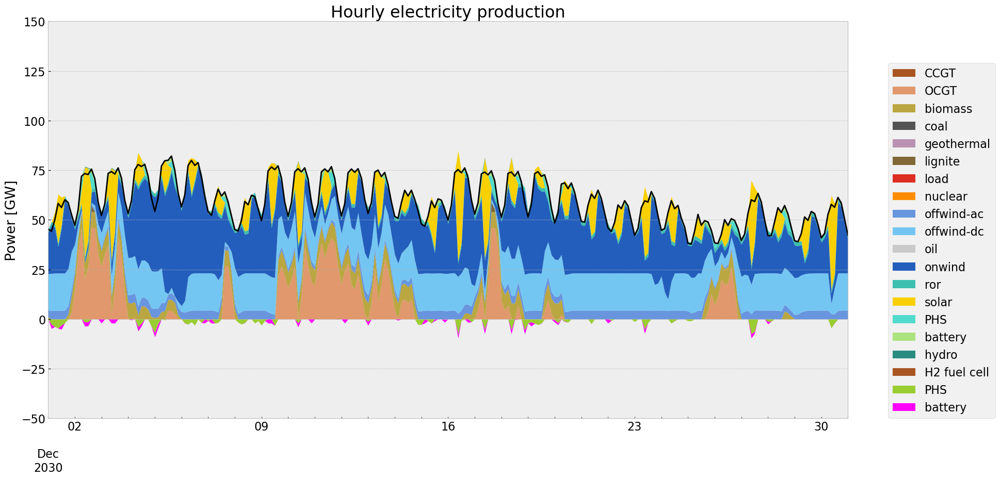

In [51]:
gen_curve(n1, '2030-12-01', '2030-12-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='203

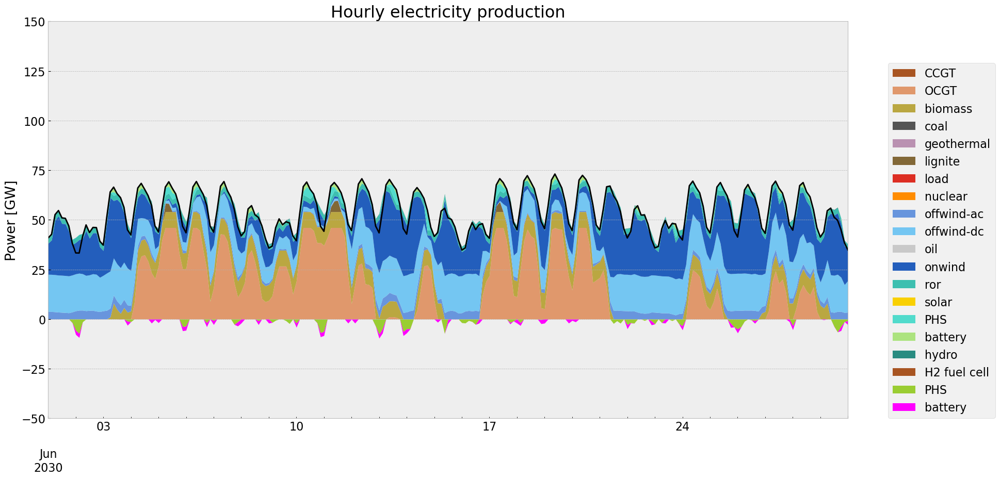

In [52]:
gen_curve(n1, '2030-06-1', '2030-06-30', colors_gen)

## Storage

carrier,PHS,battery,hydro
bus,,,
DE0 0,2.10300,0.000000,0.1200
DE0 1,0.99980,0.000000,NaN
DE0 2,1.85500,0.000000,0.1695
DE0 3,1.74142,2.054674,NaN
DE0 4,0.90000,0.000000,NaN


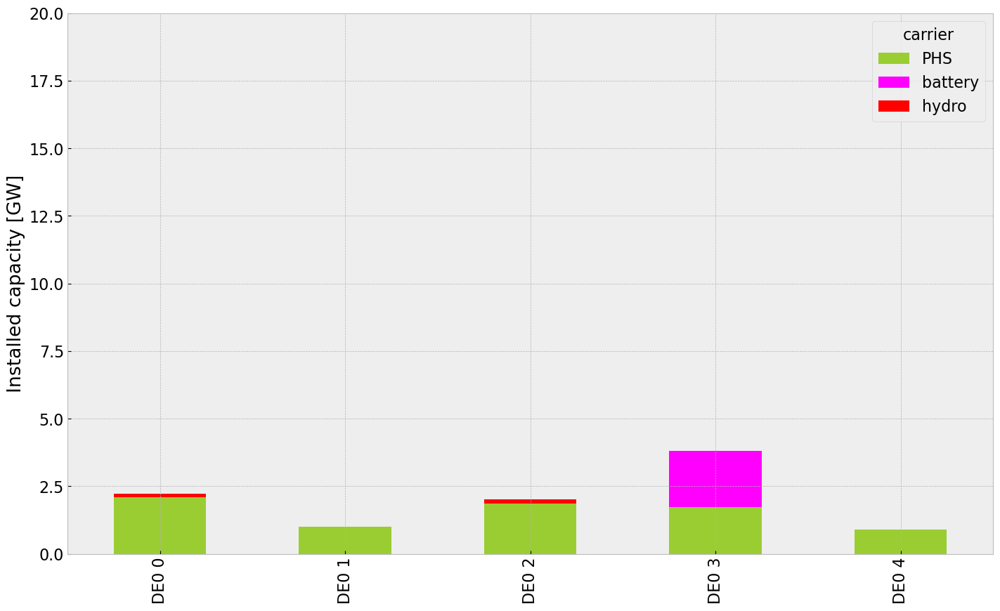

In [53]:
inst_store_table(n1)

carrier,H2
bus,
DE0 0 H2,0.0
DE0 1 H2,0.0
DE0 2 H2,0.0
DE0 3 H2,0.0
DE0 4 H2,0.0


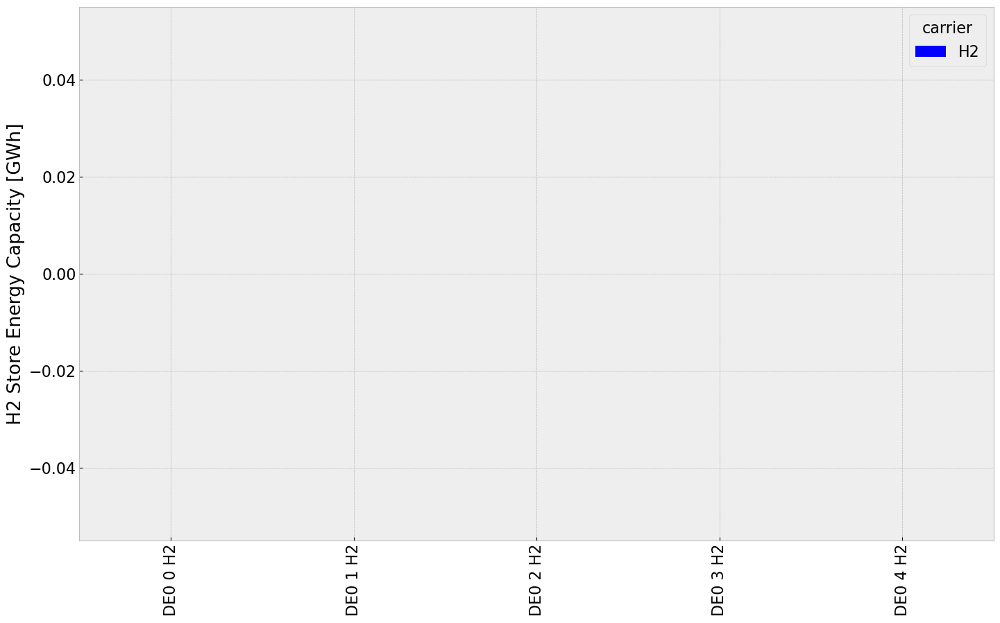

In [54]:
inst_storeh2_table(n1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


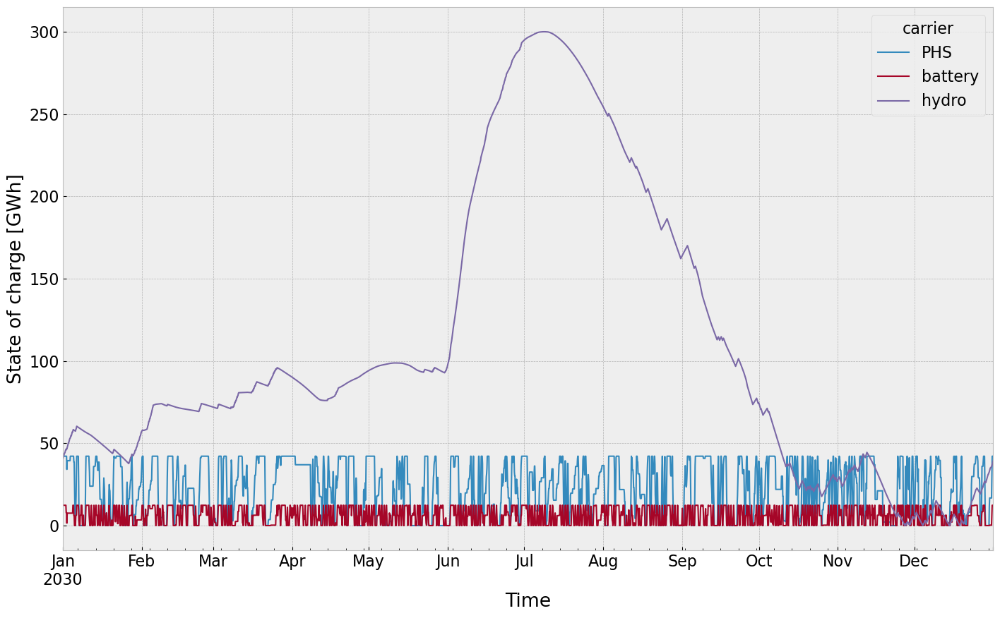

In [55]:
state_of_charge_plot(n1)


## Electricity Price


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


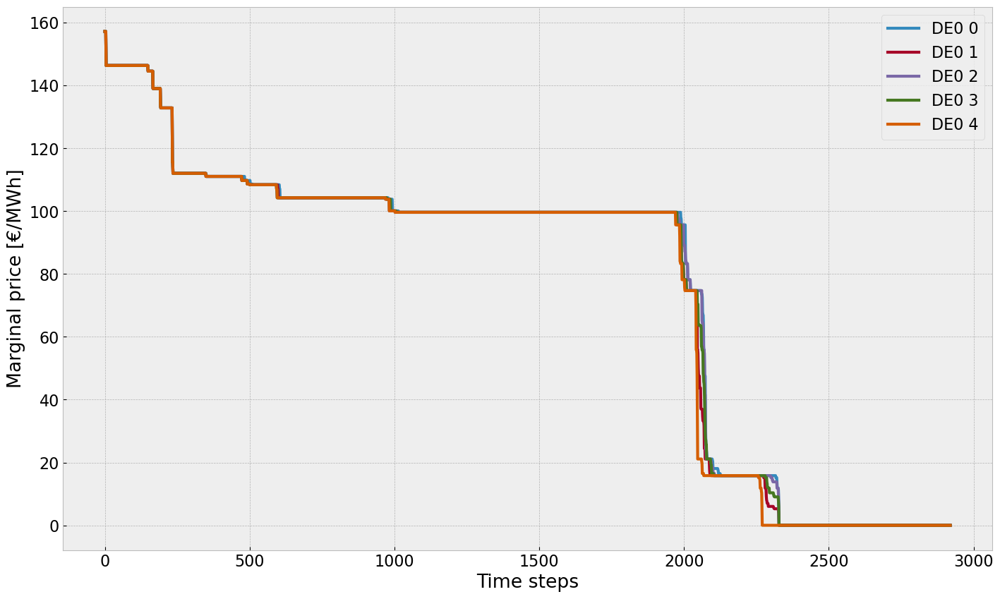

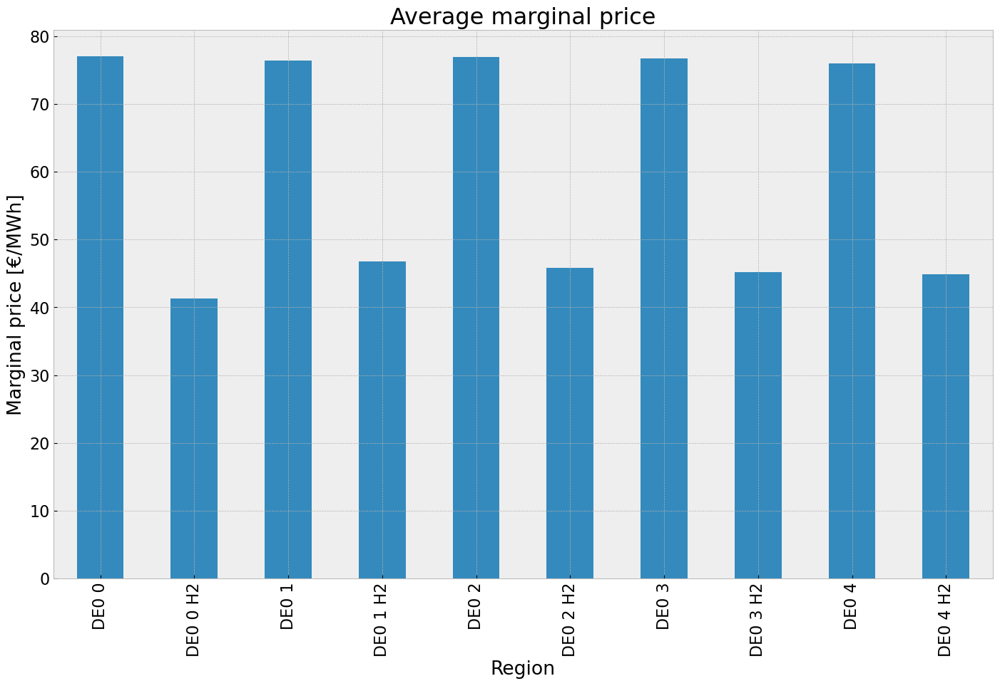

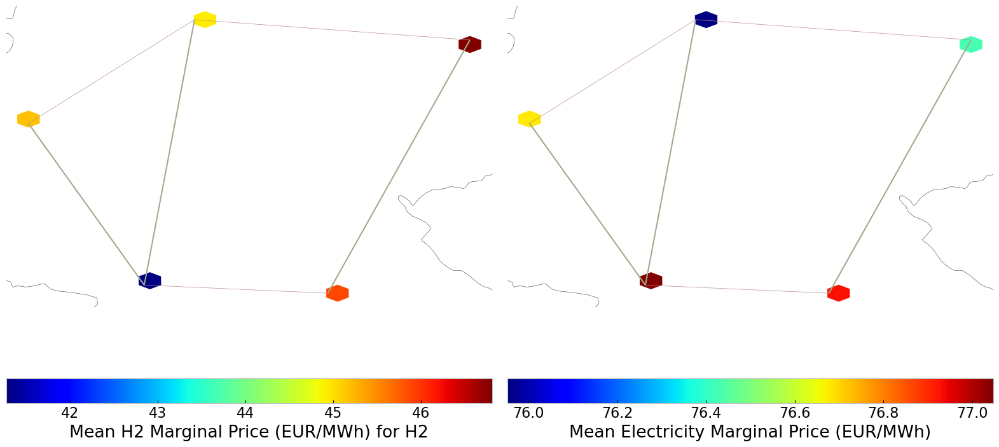

In [56]:
price_dur_curve_plot(n1)
price_regions_table(n1)
price_regions(n1)


## Emission

In [57]:
em_inv =em_table(n1)
em_inv

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,5.128102e+07,0.499437,0.1980,2.033018e+07
biomass,1.761582e+07,0.468000,0.0000,0.000000e+00
coal,0.000000e+00,0.329632,0.3361,0.000000e+00
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,6.451481e+05,0.358368,0.4069,7.325183e+05
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,6.965397e+06,1.000000,0.0000,0.000000e+00


## 2. Scenario: perfect foresight with no additional investment

In [67]:
#copy network
n2=n.copy()

#pv cut
for column in n2.generators_t.p_max_pu.columns:
        if column.endswith('solar'):
                for index,row in n2.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index <= cut_end:
                                new_p_max_pu = n2.generators_t.p_max_pu.at[index, column] * 0.0 #0.9
                                n2.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                #if new_p_max_pu<0:
                                #    n1.generators_t.p_max_pu.at[index, column] = 0

#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n2.generators.p_nom_extendable.items():
    if value:  
        n2.generators.at[index, 'p_nom'] = n.generators.at[index, 'p_nom_opt']
        #n2.generators.at[index, 'p_nom_max'] = n.generators.at[index, 'p_nom_opt']
        n2.generators.at[index,'p_nom_extendable'] = False

#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n2.storage_units.p_nom_extendable.items():
    if value:  
        n2.storage_units.at[index, 'p_nom'] = n.storage_units.at[index, 'p_nom_opt']
        #n2.storage_units.at[index, 'p_nom_max'] = n.storage_units.at[index, 'p_nom_opt']
        n2.storage_units.at[index,'p_nom_extendable'] = False

#set the optimal capacity of stores from the base scenario as the new minimum capacity 
for index, value in n2.stores.e_nom_extendable.items():
    if value:  
        n2.stores.at[index, 'e_nom'] = n.stores.at[index, 'e_nom_opt']
        #n2.stores.at[index, 'e_nom_max'] = n.stores.at[index, 'e_nom_opt']
        n2.stores.at[index, 'e_nom_extendable'] =False

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n2.lines.s_nom_extendable.items():
    if value:  
        n2.lines.at[index, 's_nom'] = n.lines.at[index, 's_nom_opt']
        #n2.lines.at[index, 's_nom_max'] = n.lines.at[index, 's_nom_opt']
        n2.lines.at[index, 's_nom_extendable'] =False

In [68]:
n2.optimize.create_model()

Linopy LP model

Variables:
----------
 * Link-p_nom (Link-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * Store-e (snapshot, Store)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * Store-p (snapshot, Store)

Constraints:
------------
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Generator-fix-p-lower (snapshot, Generator-fix)
 * Generator-fix-p-upper (snapshot, Generator-fix)
 * Line-fix-s-lower (snapshot, Line-fix)
 * Line-fix-s-upper (snapshot, Line-fix)
 * Link-ext-p-lower (snapshot, Link-ext)
 * Link-ext-p-upper (snapshot, Link-ext)
 * Store-fix-e-lower (snapshot, Store-fix)
 * Store-fix-e-upper (snapshot, Store-fix)
 * StorageUnit-fix-p_dispatch-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_dispatch-upper (snapshot, StorageUnit-fix)
 * StorageUni

In [69]:
n2.optimize(solver_name ='gurobi')
#optimize.optimize_with_rolling_horizon(n2, horizon=24, overlap=0, solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 10/10 [00:01<00:00,  6.42it/s]
INFO:linopy.io: Writing time: 10.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ii2qgi4g.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ii2qgi4g.lp


Reading time = 3.09 seconds


INFO:gurobipy:Reading time = 3.09 seconds


obj: 849737 rows, 402951 columns, 1419117 nonzeros


INFO:gurobipy:obj: 849737 rows, 402951 columns, 1419117 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 849737 rows, 402951 columns and 1419117 nonzeros


INFO:gurobipy:Optimize a model with 849737 rows, 402951 columns and 1419117 nonzeros


Model fingerprint: 0xa9614ed1


INFO:gurobipy:Model fingerprint: 0xa9614ed1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+02]


INFO:gurobipy:  Bounds range     [1e+01, 5e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 759233 rows and 152834 columns


INFO:gurobipy:Presolve removed 759233 rows and 152834 columns


Presolve time: 1.18s


INFO:gurobipy:Presolve time: 1.18s


Presolved: 90504 rows, 250117 columns, 469088 nonzeros


INFO:gurobipy:Presolved: 90504 rows, 250117 columns, 469088 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.17s


INFO:gurobipy:Ordering time: 0.17s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 13


INFO:gurobipy: Dense cols : 13


 AA' NZ     : 2.219e+05


INFO:gurobipy: AA' NZ     : 2.219e+05


 Factor NZ  : 1.498e+06 (roughly 150 MB of memory)


INFO:gurobipy: Factor NZ  : 1.498e+06 (roughly 150 MB of memory)


 Factor Ops : 3.510e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.510e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   2.00661034e+18 -9.47643577e+18  3.17e+08 5.18e+06  1.65e+14     2s


INFO:gurobipy:   0   2.00661034e+18 -9.47643577e+18  3.17e+08 5.18e+06  1.65e+14     2s


   1   1.06058437e+18 -1.20514262e+18  1.63e+08 8.20e+05  7.15e+13     2s


INFO:gurobipy:   1   1.06058437e+18 -1.20514262e+18  1.63e+08 8.20e+05  7.15e+13     2s


   2   1.02445123e+18 -5.69386106e+17  1.57e+08 3.53e+05  6.66e+13     2s


INFO:gurobipy:   2   1.02445123e+18 -5.69386106e+17  1.57e+08 3.53e+05  6.66e+13     2s


   3   1.75689695e+17 -3.41094674e+17  2.08e+07 1.43e+05  1.01e+13     3s


INFO:gurobipy:   3   1.75689695e+17 -3.41094674e+17  2.08e+07 1.43e+05  1.01e+13     3s


   4   4.12781605e+16 -2.67676299e+16  5.71e+05 2.34e+03  3.71e+11     3s


INFO:gurobipy:   4   4.12781605e+16 -2.67676299e+16  5.71e+05 2.34e+03  3.71e+11     3s


   5   2.74863751e+15 -3.38165786e+15  1.95e+03 2.22e+02  1.32e+10     3s


INFO:gurobipy:   5   2.74863751e+15 -3.38165786e+15  1.95e+03 2.22e+02  1.32e+10     3s


   6   1.72209567e+14 -6.12126994e+14  1.03e+02 3.61e+01  1.59e+09     3s


INFO:gurobipy:   6   1.72209567e+14 -6.12126994e+14  1.03e+02 3.61e+01  1.59e+09     3s


   7   1.28262347e+13 -4.48983259e+13  4.05e+00 2.52e+00  1.13e+08     3s


INFO:gurobipy:   7   1.28262347e+13 -4.48983259e+13  4.05e+00 2.52e+00  1.13e+08     3s


   8   1.16776913e+13 -3.29430454e+13  3.70e+00 1.83e+00  8.76e+07     3s


INFO:gurobipy:   8   1.16776913e+13 -3.29430454e+13  3.70e+00 1.83e+00  8.76e+07     3s


   9   9.26433105e+12 -1.41007395e+13  2.95e+00 7.25e-01  4.57e+07     4s


INFO:gurobipy:   9   9.26433105e+12 -1.41007395e+13  2.95e+00 7.25e-01  4.57e+07     4s


  10   2.91412960e+12 -3.33763392e+12  8.98e-01 1.33e-01  1.22e+07     4s


INFO:gurobipy:  10   2.91412960e+12 -3.33763392e+12  8.98e-01 1.33e-01  1.22e+07     4s


  11   5.70970645e+11 -8.10303165e+11  1.58e-01 2.77e-02  2.68e+06     4s


INFO:gurobipy:  11   5.70970645e+11 -8.10303165e+11  1.58e-01 2.77e-02  2.68e+06     4s


  12   2.26427369e+11 -4.34425053e+11  5.22e-02 1.51e-02  1.28e+06     4s


INFO:gurobipy:  12   2.26427369e+11 -4.34425053e+11  5.22e-02 1.51e-02  1.28e+06     4s


  13   1.38459381e+11 -2.33981943e+11  2.49e-02 8.18e-03  7.23e+05     4s


INFO:gurobipy:  13   1.38459381e+11 -2.33981943e+11  2.49e-02 8.18e-03  7.23e+05     4s


  14   9.26350031e+10 -1.31808862e+11  1.24e-02 4.62e-03  4.36e+05     5s


INFO:gurobipy:  14   9.26350031e+10 -1.31808862e+11  1.24e-02 4.62e-03  4.36e+05     5s


  15   5.82205092e+10 -7.66105888e+10  4.60e-03 2.79e-03  2.62e+05     5s


INFO:gurobipy:  15   5.82205092e+10 -7.66105888e+10  4.60e-03 2.79e-03  2.62e+05     5s


  16   4.05068720e+10 -2.70961833e+10  2.30e-03 1.39e-03  1.31e+05     5s


INFO:gurobipy:  16   4.05068720e+10 -2.70961833e+10  2.30e-03 1.39e-03  1.31e+05     5s


  17   3.09407309e+10 -7.30470352e+09  1.08e-03 7.82e-04  7.43e+04     5s


INFO:gurobipy:  17   3.09407309e+10 -7.30470352e+09  1.08e-03 7.82e-04  7.43e+04     5s


  18   2.56177772e+10  4.20047455e+09  4.72e-04 4.41e-04  4.16e+04     5s


INFO:gurobipy:  18   2.56177772e+10  4.20047455e+09  4.72e-04 4.41e-04  4.16e+04     5s


  19   2.37146700e+10  1.19721018e+10  2.83e-04 2.30e-04  2.28e+04     6s


INFO:gurobipy:  19   2.37146700e+10  1.19721018e+10  2.83e-04 2.30e-04  2.28e+04     6s


  20   2.23073646e+10  1.49528015e+10  1.61e-04 1.45e-04  1.43e+04     6s


INFO:gurobipy:  20   2.23073646e+10  1.49528015e+10  1.61e-04 1.45e-04  1.43e+04     6s


  21   2.15507003e+10  1.74281715e+10  9.74e-05 7.56e-05  8.01e+03     6s


INFO:gurobipy:  21   2.15507003e+10  1.74281715e+10  9.74e-05 7.56e-05  8.01e+03     6s


  22   2.11242202e+10  1.79418706e+10  6.40e-05 6.18e-05  6.18e+03     6s


INFO:gurobipy:  22   2.11242202e+10  1.79418706e+10  6.40e-05 6.18e-05  6.18e+03     6s


  23   2.07391676e+10  1.90064075e+10  3.55e-05 3.21e-05  3.37e+03     6s


INFO:gurobipy:  23   2.07391676e+10  1.90064075e+10  3.55e-05 3.21e-05  3.37e+03     6s


  24   2.04788970e+10  1.95570956e+10  1.77e-05 1.68e-05  1.79e+03     6s


INFO:gurobipy:  24   2.04788970e+10  1.95570956e+10  1.77e-05 1.68e-05  1.79e+03     6s


  25   2.03210762e+10  1.99173691e+10  7.42e-06 6.73e-06  7.84e+02     7s


INFO:gurobipy:  25   2.03210762e+10  1.99173691e+10  7.42e-06 6.73e-06  7.84e+02     7s


  26   2.02812254e+10  2.00309448e+10  5.07e-06 3.81e-06  4.86e+02     7s


INFO:gurobipy:  26   2.02812254e+10  2.00309448e+10  5.07e-06 3.81e-06  4.86e+02     7s


  27   2.02463508e+10  2.00816878e+10  3.09e-06 2.54e-06  3.20e+02     7s


INFO:gurobipy:  27   2.02463508e+10  2.00816878e+10  3.09e-06 2.54e-06  3.20e+02     7s


  28   2.02233006e+10  2.01355785e+10  1.84e-06 1.20e-06  1.70e+02     7s


INFO:gurobipy:  28   2.02233006e+10  2.01355785e+10  1.84e-06 1.20e-06  1.70e+02     7s


  29   2.02103016e+10  2.01461715e+10  1.17e-06 9.49e-07  1.25e+02     7s


INFO:gurobipy:  29   2.02103016e+10  2.01461715e+10  1.17e-06 9.49e-07  1.25e+02     7s


  30   2.02081294e+10  2.01519238e+10  1.06e-06 8.13e-07  1.09e+02     8s


INFO:gurobipy:  30   2.02081294e+10  2.01519238e+10  1.06e-06 8.13e-07  1.09e+02     8s


  31   2.02053602e+10  2.01634128e+10  9.12e-07 5.42e-07  8.15e+01     8s


INFO:gurobipy:  31   2.02053602e+10  2.01634128e+10  9.12e-07 5.42e-07  8.15e+01     8s


  32   2.02013389e+10  2.01674563e+10  6.95e-07 4.45e-07  6.58e+01     8s


INFO:gurobipy:  32   2.02013389e+10  2.01674563e+10  6.95e-07 4.45e-07  6.58e+01     8s


  33   2.02007174e+10  2.01689434e+10  6.63e-07 4.13e-07  6.17e+01     8s


INFO:gurobipy:  33   2.02007174e+10  2.01689434e+10  6.63e-07 4.13e-07  6.17e+01     8s


INFO:gurobipy:


Barrier performed 33 iterations in 8.03 seconds (3.00 work units)


INFO:gurobipy:Barrier performed 33 iterations in 8.03 seconds (3.00 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   55930    2.0187838e+10   0.000000e+00   0.000000e+00      9s


INFO:gurobipy:   55930    2.0187838e+10   0.000000e+00   0.000000e+00      9s


INFO:gurobipy:


Solved in 55930 iterations and 8.52 seconds (3.11 work units)


INFO:gurobipy:Solved in 55930 iterations and 8.52 seconds (3.11 work units)


Optimal objective  2.018783834e+10


INFO:gurobipy:Optimal objective  2.018783834e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 402951 primals, 849737 duals
Objective: 2.02e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [70]:
tot_cos_noinv=n2.objective/1e9 #billion €
system_cost_noinv = system_cost(n2) #million €/a
marg_price_region_noinv = n2.buses_t.marginal_price.mean()
stat_noinv = n2.statistics()

## Installed Capacity

Since expansion is not allowed in this scenario, the installed capacity will equal to that of the base scenario.

<Figure size 640x480 with 0 Axes>

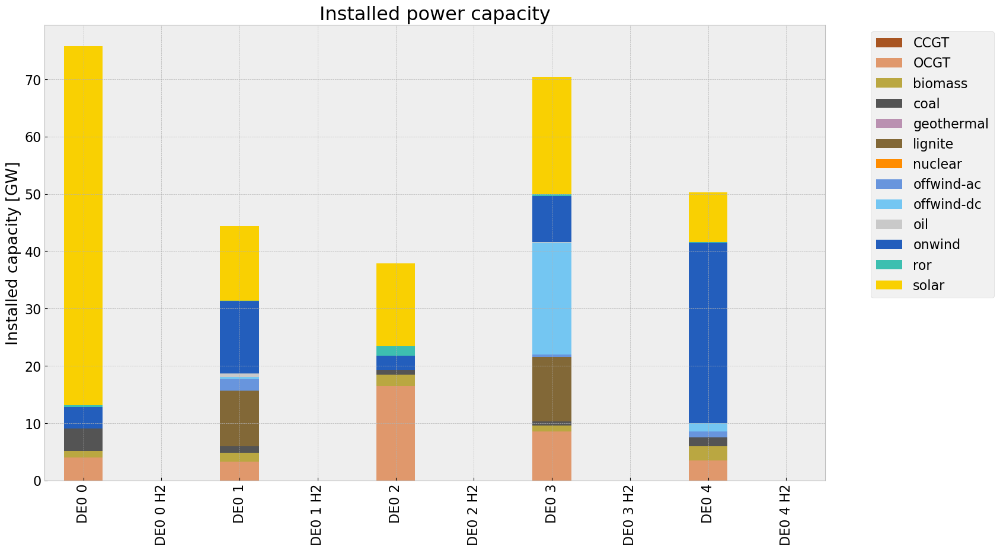

In [71]:
# consolidated istalled cap without load_shedding

capacities_noinv = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv.fillna(0, inplace=True)
gen = (capacities_noinv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv = inst_cap_table(n2, color_cap)



## Generation

<Figure size 640x480 with 0 Axes>

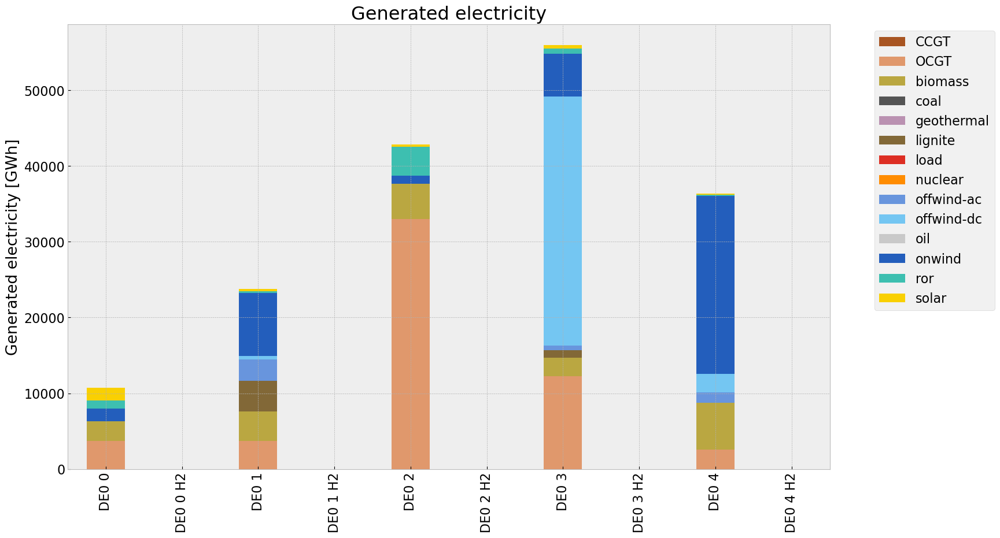

In [72]:
# consolidated generation table
carrier = n2.generators.carrier.unique()
df_tot_generation = n2.generators_t.p.sum()

generations = pd.Series(index = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')

generations.fillna(0, inplace=True)
gen_noinv = generations.unstack()/1000#GWh

gen_noinv= gen_power_table(n2,colors_gen_table)




## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2615338355.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2615338355.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, ax

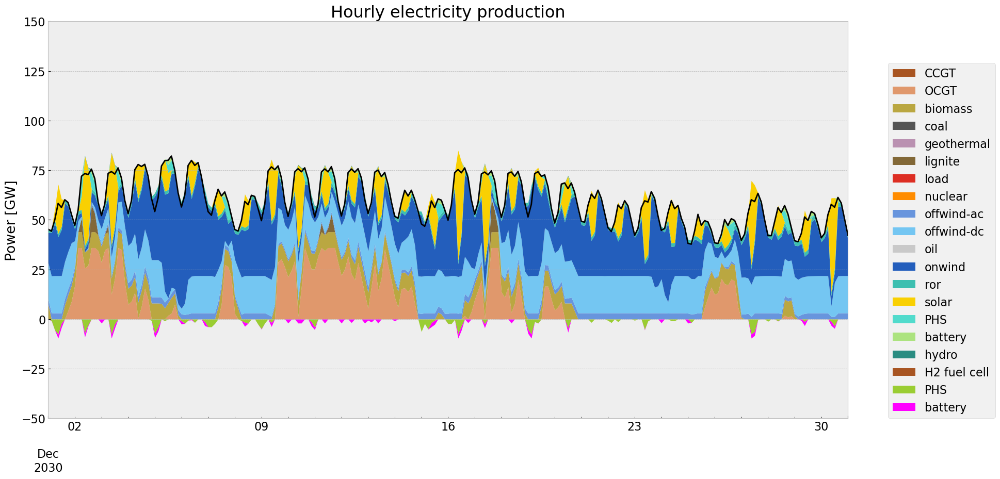

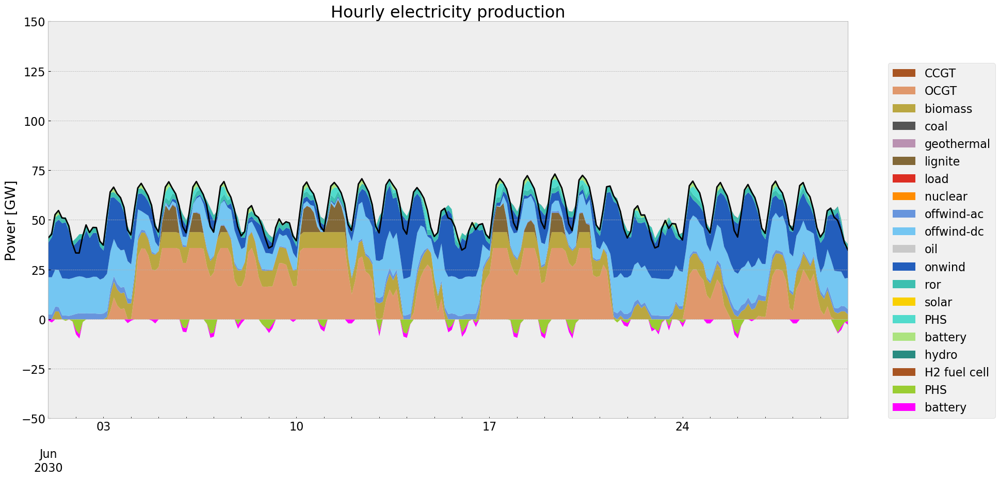

In [73]:
p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n2, '2030-12-01', '2030-12-31', colors_gen)
gen_curve(n2, '2030-06-01', '2030-06-30', colors_gen)


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2144961626.py:5: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2144961626.py:5: FutureWarning: 'H' is deprecated and will be removed in a future ver

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,5.532214e+07,0.499437,0.1980,2.193227e+07
biomass,1.970616e+07,0.468000,0.0000,0.000000e+00
coal,3.749390e+02,0.329632,0.3361,3.822958e+02
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,4.988935e+06,0.358368,0.4069,5.664569e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,4.833799e+06,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


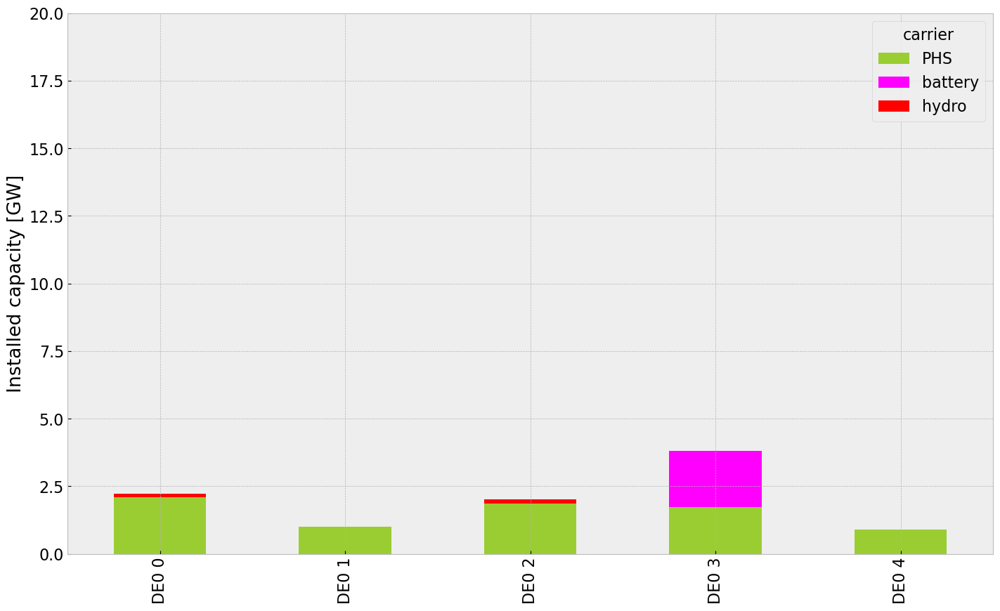

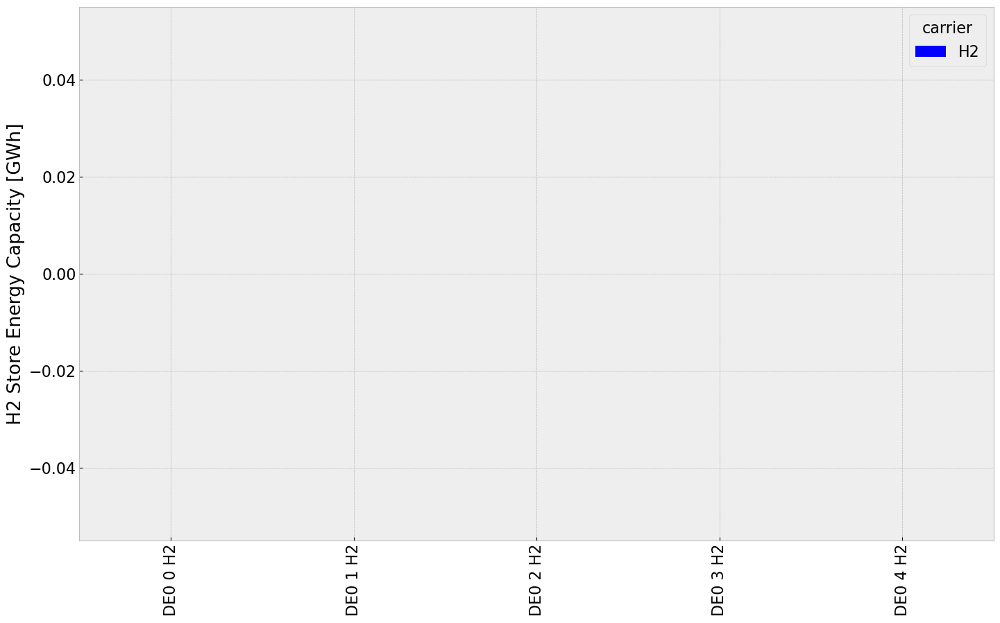

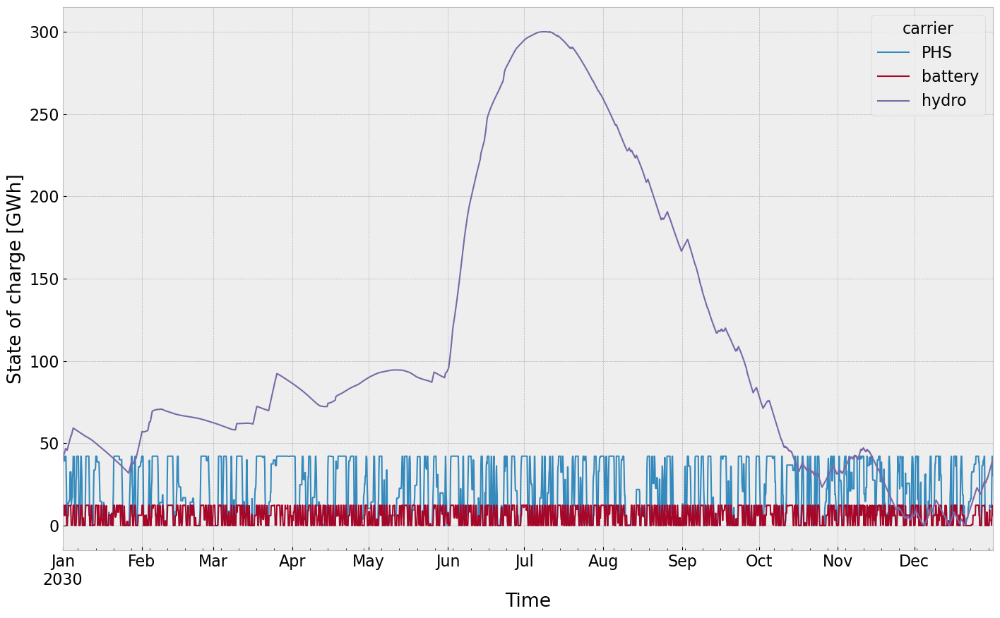

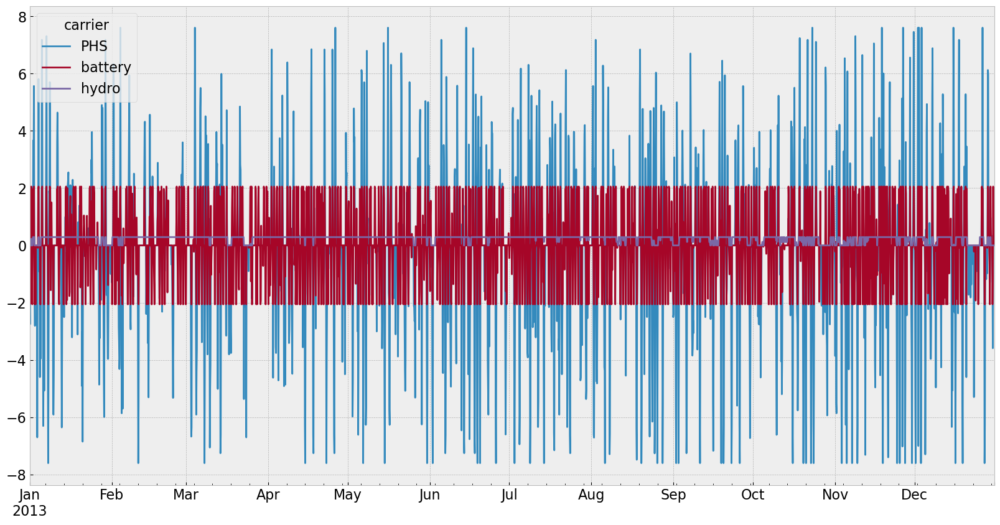

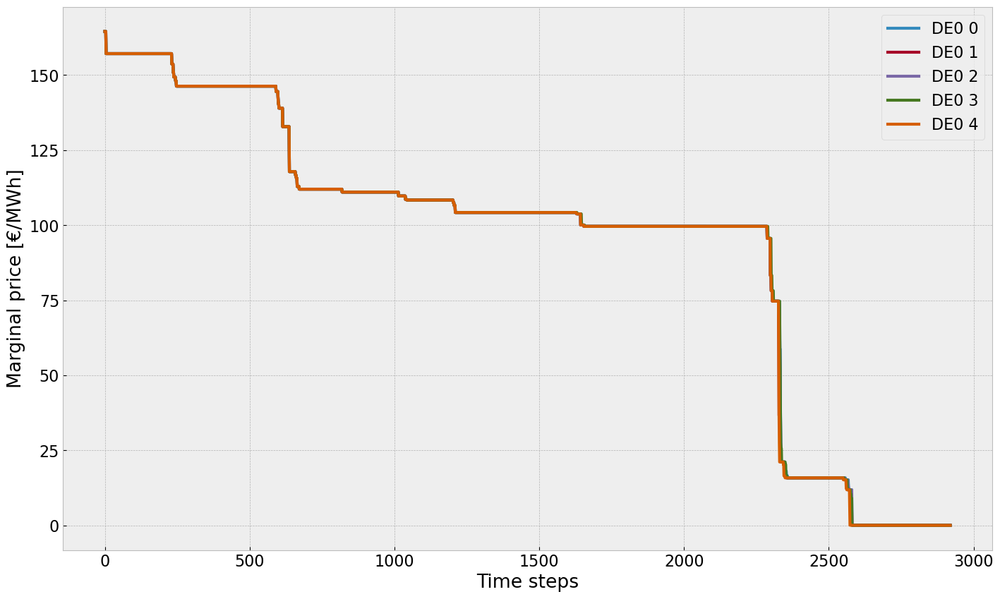

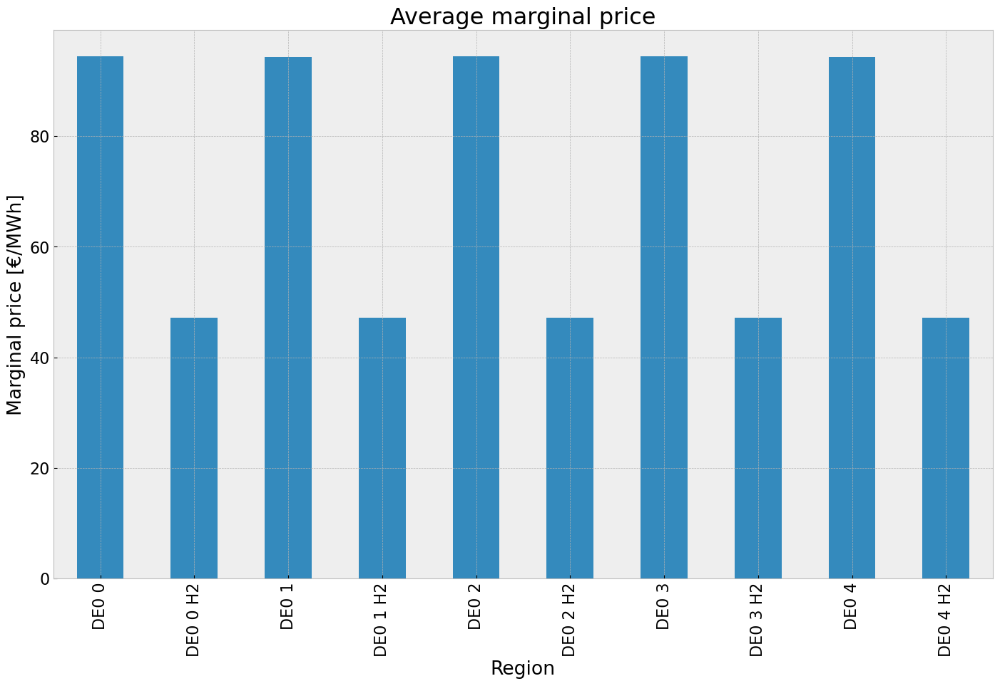

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


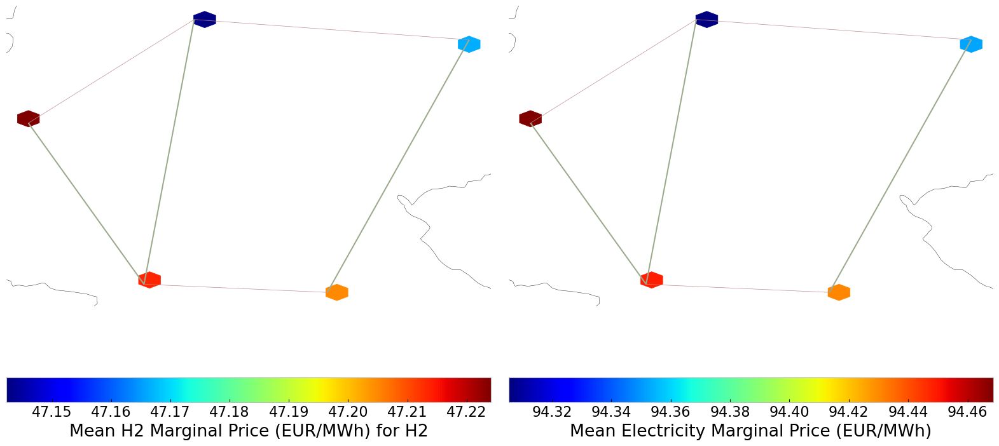

In [74]:
#storage unit & stores
inst_store_table(n2)
inst_storeh2_table(n2)
state_of_charge_plot(n2)
n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
#price
price_dur_curve_plot(n2)
price_regions_table(n2)
price_regions(n2)
#emission
em_noinv =em_table(n2)
em_noinv

## 3. Scenario: rolling horizon foresight with no additional investment

In [75]:
n3= n2.copy()
horizon = 24
#n3.global_constraints.loc['CO2Limit','constant']= n.global_constraints.loc['CO2Limit','constant']/(len(n3.snapshots)/horizon)
n3.optimize.create_model()
optimize.optimize_with_rolling_horizon(n3, horizon=horizon, overlap=0, solver_name='gurobi')

INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-01 00:00:00:2013-01-03 21:00:00] (1/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iupd4b2x.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iupd4b2x.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x36157878


INFO:gurobipy:Model fingerprint: 0x36157878


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     435    1.4228365e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     435    1.4228365e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 435 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 435 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.422836475e+06


INFO:gurobipy:Optimal objective  1.422836475e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.42e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-suqwhi53.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-suqwhi53.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xd21acb93


INFO:gurobipy:Model fingerprint: 0xd21acb93


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1249 columns


INFO:gurobipy:Presolve removed 6257 rows and 1249 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     427    4.7793253e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     427    4.7793253e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 427 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 427 iterations and 0.05 seconds (0.01 work units)


Optimal objective  4.779325273e+07


INFO:gurobipy:Optimal objective  4.779325273e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 4.78e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p923qs9u.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p923qs9u.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x83d4179a


INFO:gurobipy:Model fingerprint: 0x83d4179a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1257 columns


INFO:gurobipy:Presolve removed 6257 rows and 1257 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 2068 columns, 3855 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2068 columns, 3855 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     479    2.5041267e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     479    2.5041267e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 479 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 479 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.504126746e+08


INFO:gurobipy:Optimal objective  2.504126746e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.50e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9khs6769.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9khs6769.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x624db438


INFO:gurobipy:Model fingerprint: 0x624db438


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1266 columns


INFO:gurobipy:Presolve removed 6257 rows and 1266 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     487    2.4509394e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     487    2.4509394e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 487 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 487 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.450939362e+08


INFO:gurobipy:Optimal objective  2.450939362e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.45e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i6ka66rl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i6ka66rl.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe3c308bb


INFO:gurobipy:Model fingerprint: 0xe3c308bb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1263 columns


INFO:gurobipy:Presolve removed 6257 rows and 1263 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2062 columns, 3849 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2062 columns, 3849 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     460    3.4654929e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     460    3.4654929e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 460 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 460 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.465492944e+08


INFO:gurobipy:Optimal objective  3.465492944e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.47e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8izr6a23.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8izr6a23.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x04bfe296


INFO:gurobipy:Model fingerprint: 0x04bfe296


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1257 columns


INFO:gurobipy:Presolve removed 6257 rows and 1257 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2068 columns, 3855 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2068 columns, 3855 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     449    3.2783114e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     449    3.2783114e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 449 iterations and 0.10 seconds (0.01 work units)


INFO:gurobipy:Solved in 449 iterations and 0.10 seconds (0.01 work units)


Optimal objective  3.278311396e+08


INFO:gurobipy:Optimal objective  3.278311396e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zirbrt6x.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zirbrt6x.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x1ad571c8


INFO:gurobipy:Model fingerprint: 0x1ad571c8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1255 columns


INFO:gurobipy:Presolve removed 6257 rows and 1255 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     496    4.9552256e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     496    4.9552256e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 496 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 496 iterations and 0.05 seconds (0.01 work units)


Optimal objective  4.955225576e+07


INFO:gurobipy:Optimal objective  4.955225576e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 4.96e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lw61qd5r.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lw61qd5r.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x1670396e


INFO:gurobipy:Model fingerprint: 0x1670396e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6257 rows and 1282 columns


INFO:gurobipy:Presolve removed 6257 rows and 1282 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2043 columns, 3830 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2043 columns, 3830 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     433    3.5175748e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     433    3.5175748e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 433 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 433 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.517574783e+08


INFO:gurobipy:Optimal objective  3.517574783e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.52e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8edkfem4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8edkfem4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x10181a35


INFO:gurobipy:Model fingerprint: 0x10181a35


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1264 columns


INFO:gurobipy:Presolve removed 6257 rows and 1264 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2061 columns, 3848 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2061 columns, 3848 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     455    1.1743034e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     455    1.1743034e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 455 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 455 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.174303417e+08


INFO:gurobipy:Optimal objective  1.174303417e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.17e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i9febd9g.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i9febd9g.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x8eea592f


INFO:gurobipy:Model fingerprint: 0x8eea592f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     462    1.4069222e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     462    1.4069222e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 462 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 462 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.406922205e+07


INFO:gurobipy:Optimal objective  1.406922205e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.41e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z_exwvkc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z_exwvkc.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0b161c4d


INFO:gurobipy:Model fingerprint: 0x0b161c4d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     440    5.2814472e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     440    5.2814472e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 440 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 440 iterations and 0.05 seconds (0.01 work units)


Optimal objective  5.281447206e+07


INFO:gurobipy:Optimal objective  5.281447206e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.28e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3hzl7ui0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3hzl7ui0.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc50bacfa


INFO:gurobipy:Model fingerprint: 0xc50bacfa


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     452    8.0826012e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     452    8.0826012e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 452 iterations and 0.13 seconds (0.01 work units)


INFO:gurobipy:Solved in 452 iterations and 0.13 seconds (0.01 work units)


Optimal objective  8.082601222e+06


INFO:gurobipy:Optimal objective  8.082601222e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 8.08e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kj14ex8j.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kj14ex8j.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x86fe4f67


INFO:gurobipy:Model fingerprint: 0x86fe4f67


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1251 columns


INFO:gurobipy:Presolve removed 6257 rows and 1251 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2074 columns, 3861 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2074 columns, 3861 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     433    2.8330273e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     433    2.8330273e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 433 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 433 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.833027340e+08


INFO:gurobipy:Optimal objective  2.833027340e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.83e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nmb_m0c2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nmb_m0c2.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xcf8f837f


INFO:gurobipy:Model fingerprint: 0xcf8f837f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1278 columns


INFO:gurobipy:Presolve removed 6257 rows and 1278 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2047 columns, 3834 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2047 columns, 3834 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     446    1.6038828e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     446    1.6038828e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 446 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 446 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.603882790e+08


INFO:gurobipy:Optimal objective  1.603882790e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.60e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h5y0ws8p.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h5y0ws8p.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x59225189


INFO:gurobipy:Model fingerprint: 0x59225189


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6257 rows and 1274 columns


INFO:gurobipy:Presolve removed 6257 rows and 1274 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 2051 columns, 3838 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2051 columns, 3838 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     463    2.7928547e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     463    2.7928547e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 463 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 463 iterations and 0.07 seconds (0.01 work units)


Optimal objective  2.792854708e+08


INFO:gurobipy:Optimal objective  2.792854708e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.79e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jkd310kb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jkd310kb.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x340c810b


INFO:gurobipy:Model fingerprint: 0x340c810b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1348 columns


INFO:gurobipy:Presolve removed 6257 rows and 1348 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 1977 columns, 3764 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1977 columns, 3764 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     471    3.6066710e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     471    3.6066710e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 471 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 471 iterations and 0.07 seconds (0.01 work units)


Optimal objective  3.606670964e+08


INFO:gurobipy:Optimal objective  3.606670964e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.61e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jamtnbxa.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jamtnbxa.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0ced2c49


INFO:gurobipy:Model fingerprint: 0x0ced2c49


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1280 columns


INFO:gurobipy:Presolve removed 6257 rows and 1280 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2045 columns, 3832 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2045 columns, 3832 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     470    2.2812178e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     470    2.2812178e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 470 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 470 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.281217817e+08


INFO:gurobipy:Optimal objective  2.281217817e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-437wt1s4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-437wt1s4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe438d61f


INFO:gurobipy:Model fingerprint: 0xe438d61f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     590    1.4958727e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     590    1.4958727e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 590 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 590 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.495872652e+08


INFO:gurobipy:Optimal objective  1.495872652e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.50e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v2qtpzk7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v2qtpzk7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x2e4ad7e1


INFO:gurobipy:Model fingerprint: 0x2e4ad7e1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1254 columns


INFO:gurobipy:Presolve removed 6257 rows and 1254 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2071 columns, 3858 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2071 columns, 3858 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     472    1.4738535e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     472    1.4738535e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 472 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 472 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.473853478e+08


INFO:gurobipy:Optimal objective  1.473853478e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.47e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mqmkii_f.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mqmkii_f.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x2643e294


INFO:gurobipy:Model fingerprint: 0x2643e294


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1276 columns


INFO:gurobipy:Presolve removed 6257 rows and 1276 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 2049 columns, 3836 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2049 columns, 3836 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     489    3.1574749e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     489    3.1574749e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 489 iterations and 0.12 seconds (0.01 work units)


INFO:gurobipy:Solved in 489 iterations and 0.12 seconds (0.01 work units)


Optimal objective  3.157474861e+08


INFO:gurobipy:Optimal objective  3.157474861e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.16e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k50d4z6v.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k50d4z6v.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x9a0e3ac5


INFO:gurobipy:Model fingerprint: 0x9a0e3ac5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6257 rows and 1271 columns


INFO:gurobipy:Presolve removed 6257 rows and 1271 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2054 columns, 3841 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2054 columns, 3841 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     458    1.8394795e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     458    1.8394795e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 458 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 458 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.839479541e+08


INFO:gurobipy:Optimal objective  1.839479541e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.84e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7iseule4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7iseule4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xd5298edb


INFO:gurobipy:Model fingerprint: 0xd5298edb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1266 columns


INFO:gurobipy:Presolve removed 6257 rows and 1266 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     497    1.9233948e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     497    1.9233948e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 497 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 497 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.923394818e+08


INFO:gurobipy:Optimal objective  1.923394818e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.92e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vo5zmyor.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vo5zmyor.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe9a80adb


INFO:gurobipy:Model fingerprint: 0xe9a80adb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1249 columns


INFO:gurobipy:Presolve removed 6257 rows and 1249 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     517    5.3479119e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     517    5.3479119e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 517 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 517 iterations and 0.05 seconds (0.01 work units)


Optimal objective  5.347911872e+06


INFO:gurobipy:Optimal objective  5.347911872e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.35e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ghgk7vvw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ghgk7vvw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa7230618


INFO:gurobipy:Model fingerprint: 0xa7230618


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1257 columns


INFO:gurobipy:Presolve removed 6257 rows and 1257 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2068 columns, 3855 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2068 columns, 3855 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     478    2.5953340e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     478    2.5953340e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 478 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 478 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.595333963e+08


INFO:gurobipy:Optimal objective  2.595333963e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.60e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tpg_s1x5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tpg_s1x5.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x09e57497


INFO:gurobipy:Model fingerprint: 0x09e57497


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1268 columns


INFO:gurobipy:Presolve removed 6257 rows and 1268 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2057 columns, 3844 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2057 columns, 3844 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     478    1.9570138e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     478    1.9570138e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 478 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 478 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.957013844e+08


INFO:gurobipy:Optimal objective  1.957013844e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_26d9fqh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_26d9fqh.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xfaad3840


INFO:gurobipy:Model fingerprint: 0xfaad3840


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1252 columns


INFO:gurobipy:Presolve removed 6257 rows and 1252 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2073 columns, 3860 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2073 columns, 3860 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     408    7.1949456e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     408    7.1949456e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 408 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 408 iterations and 0.06 seconds (0.01 work units)


Optimal objective  7.194945603e+07


INFO:gurobipy:Optimal objective  7.194945603e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 7.19e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sspffov5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sspffov5.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf285a21e


INFO:gurobipy:Model fingerprint: 0xf285a21e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1252 columns


INFO:gurobipy:Presolve removed 6257 rows and 1252 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2073 columns, 3860 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2073 columns, 3860 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     469    2.0280900e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     469    2.0280900e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 469 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 469 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.028089993e+08


INFO:gurobipy:Optimal objective  2.028089993e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.03e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ezddvhas.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ezddvhas.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa5923270


INFO:gurobipy:Model fingerprint: 0xa5923270


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     431    9.8029805e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     431    9.8029805e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 431 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 431 iterations and 0.06 seconds (0.01 work units)


Optimal objective  9.802980495e+04


INFO:gurobipy:Optimal objective  9.802980495e+04
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.80e+04
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ta6tyb5w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ta6tyb5w.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa9eca3c6


INFO:gurobipy:Model fingerprint: 0xa9eca3c6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1250 columns


INFO:gurobipy:Presolve removed 6257 rows and 1250 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 2075 columns, 3862 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2075 columns, 3862 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     426    9.6286080e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     426    9.6286080e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 426 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 426 iterations and 0.06 seconds (0.01 work units)


Optimal objective  9.628608013e+07


INFO:gurobipy:Optimal objective  9.628608013e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.63e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t2qopomu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t2qopomu.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf29b05f2


INFO:gurobipy:Model fingerprint: 0xf29b05f2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1259 columns


INFO:gurobipy:Presolve removed 6257 rows and 1259 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     461    2.0274175e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     461    2.0274175e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 461 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 461 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.027417518e+08


INFO:gurobipy:Optimal objective  2.027417518e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.03e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jkvdyv4s.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jkvdyv4s.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc920e48e


INFO:gurobipy:Model fingerprint: 0xc920e48e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1256 columns


INFO:gurobipy:Presolve removed 6257 rows and 1256 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2069 columns, 3856 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2069 columns, 3856 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     487    1.9632661e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     487    1.9632661e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 487 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 487 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.963266127e+08


INFO:gurobipy:Optimal objective  1.963266127e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bni923ki.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bni923ki.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x2bbb0109


INFO:gurobipy:Model fingerprint: 0x2bbb0109


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1249 columns


INFO:gurobipy:Presolve removed 6257 rows and 1249 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     505    2.1565531e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     505    2.1565531e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 505 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 505 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.156553056e+08


INFO:gurobipy:Optimal objective  2.156553056e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.16e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c__qv4ko.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c__qv4ko.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x47644481


INFO:gurobipy:Model fingerprint: 0x47644481


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1261 columns


INFO:gurobipy:Presolve removed 6257 rows and 1261 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2064 columns, 3851 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2064 columns, 3851 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     448    1.7868752e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     448    1.7868752e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 448 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 448 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.786875175e+08


INFO:gurobipy:Optimal objective  1.786875175e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.79e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mw4hiy92.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mw4hiy92.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x746fb14d


INFO:gurobipy:Model fingerprint: 0x746fb14d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1249 columns


INFO:gurobipy:Presolve removed 6257 rows and 1249 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     514    2.3594349e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     514    2.3594349e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 514 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 514 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.359434906e+08


INFO:gurobipy:Optimal objective  2.359434906e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.36e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-enws8hde.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-enws8hde.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x9d8b3e90


INFO:gurobipy:Model fingerprint: 0x9d8b3e90


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1252 columns


INFO:gurobipy:Presolve removed 6257 rows and 1252 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2073 columns, 3860 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2073 columns, 3860 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     450    9.1843314e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     450    9.1843314e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 450 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 450 iterations and 0.06 seconds (0.01 work units)


Optimal objective  9.184331350e+07


INFO:gurobipy:Optimal objective  9.184331350e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.18e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-boj3ji4s.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-boj3ji4s.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x466ee276


INFO:gurobipy:Model fingerprint: 0x466ee276


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1259 columns


INFO:gurobipy:Presolve removed 6257 rows and 1259 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     427    1.1359557e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     427    1.1359557e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 427 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 427 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.135955712e+08


INFO:gurobipy:Optimal objective  1.135955712e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.14e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tkcb6eu1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tkcb6eu1.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0f0c746a


INFO:gurobipy:Model fingerprint: 0x0f0c746a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1260 columns


INFO:gurobipy:Presolve removed 6257 rows and 1260 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2065 columns, 3852 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2065 columns, 3852 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     414    1.4616942e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     414    1.4616942e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 414 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 414 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.461694167e+08


INFO:gurobipy:Optimal objective  1.461694167e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.46e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_mlzdi4s.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_mlzdi4s.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x9ed2800f


INFO:gurobipy:Model fingerprint: 0x9ed2800f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1267 columns


INFO:gurobipy:Presolve removed 6257 rows and 1267 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 2058 columns, 3845 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2058 columns, 3845 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     409    1.5271067e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     409    1.5271067e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 409 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 409 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.527106693e+08


INFO:gurobipy:Optimal objective  1.527106693e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.53e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dhfd6kru.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dhfd6kru.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x20fe2ab4


INFO:gurobipy:Model fingerprint: 0x20fe2ab4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1270 columns


INFO:gurobipy:Presolve removed 6257 rows and 1270 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2055 columns, 3842 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2055 columns, 3842 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     396    2.5984289e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     396    2.5984289e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 396 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 396 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.598428863e+08


INFO:gurobipy:Optimal objective  2.598428863e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.60e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o2rg8bxp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o2rg8bxp.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc72a088c


INFO:gurobipy:Model fingerprint: 0xc72a088c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1265 columns


INFO:gurobipy:Presolve removed 6257 rows and 1265 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2060 columns, 3847 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2060 columns, 3847 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     455    1.5277656e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     455    1.5277656e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 455 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 455 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.527765612e+08


INFO:gurobipy:Optimal objective  1.527765612e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.53e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nj_1l48d.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nj_1l48d.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x310b097a


INFO:gurobipy:Model fingerprint: 0x310b097a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1272 columns


INFO:gurobipy:Presolve removed 6257 rows and 1272 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2053 columns, 3840 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2053 columns, 3840 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     391    2.4061612e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     391    2.4061612e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 391 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 391 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.406161172e+08


INFO:gurobipy:Optimal objective  2.406161172e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.41e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tnv16mq3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tnv16mq3.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x828ffbc6


INFO:gurobipy:Model fingerprint: 0x828ffbc6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6257 rows and 1270 columns


INFO:gurobipy:Presolve removed 6257 rows and 1270 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2055 columns, 3842 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2055 columns, 3842 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     374    2.0456295e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     374    2.0456295e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 374 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 374 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.045629509e+08


INFO:gurobipy:Optimal objective  2.045629509e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.05e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jr5gcq_a.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jr5gcq_a.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf2a8c38c


INFO:gurobipy:Model fingerprint: 0xf2a8c38c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1266 columns


INFO:gurobipy:Presolve removed 6257 rows and 1266 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     400    1.9558784e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     400    1.9558784e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 400 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 400 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.955878398e+08


INFO:gurobipy:Optimal objective  1.955878398e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bqbz4ib_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bqbz4ib_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x7a108607


INFO:gurobipy:Model fingerprint: 0x7a108607


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1255 columns


INFO:gurobipy:Presolve removed 6257 rows and 1255 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     379    8.0483292e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     379    8.0483292e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 379 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 379 iterations and 0.04 seconds (0.01 work units)


Optimal objective  8.048329241e+07


INFO:gurobipy:Optimal objective  8.048329241e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 8.05e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w9o9b7yf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w9o9b7yf.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x82b817d7


INFO:gurobipy:Model fingerprint: 0x82b817d7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1250 columns


INFO:gurobipy:Presolve removed 6257 rows and 1250 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2075 columns, 3862 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2075 columns, 3862 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     495    1.3213386e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     495    1.3213386e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 495 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 495 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.321338623e+08


INFO:gurobipy:Optimal objective  1.321338623e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.32e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h1ihavvs.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h1ihavvs.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x02b509bc


INFO:gurobipy:Model fingerprint: 0x02b509bc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1253 columns


INFO:gurobipy:Presolve removed 6257 rows and 1253 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2072 columns, 3859 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2072 columns, 3859 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     473    2.2701226e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     473    2.2701226e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 473 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 473 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.270122557e+08


INFO:gurobipy:Optimal objective  2.270122557e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.27e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-47znb5j5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-47znb5j5.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x655a2235


INFO:gurobipy:Model fingerprint: 0x655a2235


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1270 columns


INFO:gurobipy:Presolve removed 6257 rows and 1270 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2055 columns, 3842 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2055 columns, 3842 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     440    2.0232729e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     440    2.0232729e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 440 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 440 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.023272948e+08


INFO:gurobipy:Optimal objective  2.023272948e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.02e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fheszwpe.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fheszwpe.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x729e5f83


INFO:gurobipy:Model fingerprint: 0x729e5f83


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1272 columns


INFO:gurobipy:Presolve removed 6257 rows and 1272 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2053 columns, 3840 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2053 columns, 3840 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     451    1.9627940e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     451    1.9627940e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 451 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 451 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.962794023e+08


INFO:gurobipy:Optimal objective  1.962794023e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4a5v7qw_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4a5v7qw_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xee34fc63


INFO:gurobipy:Model fingerprint: 0xee34fc63


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1266 columns


INFO:gurobipy:Presolve removed 6257 rows and 1266 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     448    1.1634475e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     448    1.1634475e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 448 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 448 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.163447529e+08


INFO:gurobipy:Optimal objective  1.163447529e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.16e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lw_g4la4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lw_g4la4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf92a376b


INFO:gurobipy:Model fingerprint: 0xf92a376b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1277 columns


INFO:gurobipy:Presolve removed 6257 rows and 1277 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2048 columns, 3835 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2048 columns, 3835 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     464    2.3751000e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     464    2.3751000e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 464 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 464 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.375099971e+08


INFO:gurobipy:Optimal objective  2.375099971e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.38e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xg_akigr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xg_akigr.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xbb41d359


INFO:gurobipy:Model fingerprint: 0xbb41d359


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 4e+02]


INFO:gurobipy:  Bounds range     [1e+02, 4e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     388    1.5123474e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     388    1.5123474e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 388 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 388 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.512347440e+06


INFO:gurobipy:Optimal objective  1.512347440e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.51e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ekr4suv_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ekr4suv_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x416e5eb8


INFO:gurobipy:Model fingerprint: 0x416e5eb8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+02, 5e+02]


INFO:gurobipy:  Bounds range     [3e+02, 5e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1259 columns


INFO:gurobipy:Presolve removed 6257 rows and 1259 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     424    1.8721321e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     424    1.8721321e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 424 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 424 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.872132118e+08


INFO:gurobipy:Optimal objective  1.872132118e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.87e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5patnnac.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5patnnac.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x135c4d14


INFO:gurobipy:Model fingerprint: 0x135c4d14


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+02, 5e+02]


INFO:gurobipy:  Bounds range     [3e+02, 5e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1282 columns


INFO:gurobipy:Presolve removed 6257 rows and 1282 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 744 rows, 2043 columns, 3830 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2043 columns, 3830 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     405    2.3346475e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     405    2.3346475e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 405 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 405 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.334647481e+08


INFO:gurobipy:Optimal objective  2.334647481e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.33e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ey_bpdpw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ey_bpdpw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x710bde15


INFO:gurobipy:Model fingerprint: 0x710bde15


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 4e+02]


INFO:gurobipy:  Bounds range     [2e+02, 4e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1275 columns


INFO:gurobipy:Presolve removed 6257 rows and 1275 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2050 columns, 3837 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2050 columns, 3837 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     408    2.8615866e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     408    2.8615866e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 408 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 408 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.861586561e+08


INFO:gurobipy:Optimal objective  2.861586561e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.86e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1n9nwrui.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1n9nwrui.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x13f6b3bb


INFO:gurobipy:Model fingerprint: 0x13f6b3bb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


Presolve removed 6257 rows and 1266 columns


INFO:gurobipy:Presolve removed 6257 rows and 1266 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     429    1.1040574e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     429    1.1040574e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 429 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 429 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.104057414e+08


INFO:gurobipy:Optimal objective  1.104057414e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.10e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ll3zk9fi.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ll3zk9fi.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x31f1e4ae


INFO:gurobipy:Model fingerprint: 0x31f1e4ae


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1262 columns


INFO:gurobipy:Presolve removed 6257 rows and 1262 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2063 columns, 3850 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2063 columns, 3850 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     384    1.2267715e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     384    1.2267715e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 384 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 384 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.226771452e+08


INFO:gurobipy:Optimal objective  1.226771452e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.23e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nxpxwz94.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nxpxwz94.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x42f77dfe


INFO:gurobipy:Model fingerprint: 0x42f77dfe


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1273 columns


INFO:gurobipy:Presolve removed 6257 rows and 1273 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2052 columns, 3839 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2052 columns, 3839 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     411    2.7372092e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     411    2.7372092e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 411 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 411 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.737209176e+08


INFO:gurobipy:Optimal objective  2.737209176e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.74e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g717gbod.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g717gbod.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x672cee7b


INFO:gurobipy:Model fingerprint: 0x672cee7b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     438    2.4672909e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     438    2.4672909e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 438 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 438 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.467290893e+07


INFO:gurobipy:Optimal objective  2.467290893e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.47e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u01y1pmr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u01y1pmr.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0c60bcb9


INFO:gurobipy:Model fingerprint: 0x0c60bcb9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     488    7.0539883e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     488    7.0539883e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 488 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 488 iterations and 0.05 seconds (0.01 work units)


Optimal objective  7.053988286e+07


INFO:gurobipy:Optimal objective  7.053988286e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 7.05e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c883t9ii.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c883t9ii.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x32d35ab7


INFO:gurobipy:Model fingerprint: 0x32d35ab7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1257 columns


INFO:gurobipy:Presolve removed 6257 rows and 1257 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 2068 columns, 3855 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2068 columns, 3855 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     395    9.5484772e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     395    9.5484772e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 395 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 395 iterations and 0.07 seconds (0.01 work units)


Optimal objective  9.548477176e+07


INFO:gurobipy:Optimal objective  9.548477176e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.55e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mulw611l.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mulw611l.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x96ab7bba


INFO:gurobipy:Model fingerprint: 0x96ab7bba


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6257 rows and 1263 columns


INFO:gurobipy:Presolve removed 6257 rows and 1263 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2062 columns, 3849 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2062 columns, 3849 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     407    1.9602307e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     407    1.9602307e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 407 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 407 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.960230671e+08


INFO:gurobipy:Optimal objective  1.960230671e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-osr_l2qs.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-osr_l2qs.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xb114a3e4


INFO:gurobipy:Model fingerprint: 0xb114a3e4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1268 columns


INFO:gurobipy:Presolve removed 6257 rows and 1268 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2057 columns, 3844 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2057 columns, 3844 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     433    2.9087602e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     433    2.9087602e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 433 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 433 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.908760217e+08


INFO:gurobipy:Optimal objective  2.908760217e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.91e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yky6ye89.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yky6ye89.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe47efb61


INFO:gurobipy:Model fingerprint: 0xe47efb61


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1278 columns


INFO:gurobipy:Presolve removed 6257 rows and 1278 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2047 columns, 3834 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2047 columns, 3834 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     417    2.4770421e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     417    2.4770421e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 417 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 417 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.477042111e+08


INFO:gurobipy:Optimal objective  2.477042111e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.48e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ceiz_43j.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ceiz_43j.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe1010a12


INFO:gurobipy:Model fingerprint: 0xe1010a12


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6257 rows and 1255 columns


INFO:gurobipy:Presolve removed 6257 rows and 1255 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     489    2.0958053e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     489    2.0958053e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 489 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 489 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.095805339e+08


INFO:gurobipy:Optimal objective  2.095805339e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.10e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2nnhwu5v.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2nnhwu5v.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x8ae7940f


INFO:gurobipy:Model fingerprint: 0x8ae7940f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1271 columns


INFO:gurobipy:Presolve removed 6257 rows and 1271 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2054 columns, 3841 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2054 columns, 3841 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     485    2.1977684e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     485    2.1977684e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 485 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 485 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.197768395e+08


INFO:gurobipy:Optimal objective  2.197768395e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.20e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xa3txbgu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xa3txbgu.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x1d8c01c1


INFO:gurobipy:Model fingerprint: 0x1d8c01c1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1283 columns


INFO:gurobipy:Presolve removed 6257 rows and 1283 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2042 columns, 3829 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2042 columns, 3829 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     460    3.4649732e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     460    3.4649732e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 460 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 460 iterations and 0.04 seconds (0.01 work units)


Optimal objective  3.464973247e+08


INFO:gurobipy:Optimal objective  3.464973247e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.46e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ck0mdycu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ck0mdycu.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x45bdfdba


INFO:gurobipy:Model fingerprint: 0x45bdfdba


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 1e+02]


INFO:gurobipy:  Bounds range     [1e+02, 1e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1254 columns


INFO:gurobipy:Presolve removed 6257 rows and 1254 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2071 columns, 3858 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2071 columns, 3858 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     516    2.2218319e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     516    2.2218319e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 516 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 516 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.221831892e+08


INFO:gurobipy:Optimal objective  2.221831892e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vr4xdz4p.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vr4xdz4p.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xfe50c8ad


INFO:gurobipy:Model fingerprint: 0xfe50c8ad


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1292 columns


INFO:gurobipy:Presolve removed 6257 rows and 1292 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2033 columns, 3820 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2033 columns, 3820 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     446    2.7634887e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     446    2.7634887e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 446 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 446 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.763488746e+08


INFO:gurobipy:Optimal objective  2.763488746e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.76e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nubonoa2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nubonoa2.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0277f6e3


INFO:gurobipy:Model fingerprint: 0x0277f6e3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1327 columns


INFO:gurobipy:Presolve removed 6257 rows and 1327 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 1998 columns, 3785 nonzeros


INFO:gurobipy:Presolved: 744 rows, 1998 columns, 3785 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     470    3.6669766e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     470    3.6669766e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 470 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 470 iterations and 0.04 seconds (0.01 work units)


Optimal objective  3.666976577e+08


INFO:gurobipy:Optimal objective  3.666976577e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.67e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8l20px5u.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8l20px5u.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe7afec9d


INFO:gurobipy:Model fingerprint: 0xe7afec9d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1274 columns


INFO:gurobipy:Presolve removed 6257 rows and 1274 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2051 columns, 3838 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2051 columns, 3838 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     430    1.9702192e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     430    1.9702192e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 430 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 430 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.970219216e+08


INFO:gurobipy:Optimal objective  1.970219216e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.97e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xkn_g4co.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xkn_g4co.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xdb108b3f


INFO:gurobipy:Model fingerprint: 0xdb108b3f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1266 columns


INFO:gurobipy:Presolve removed 6257 rows and 1266 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2059 columns, 3846 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     455    2.0563112e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     455    2.0563112e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 455 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 455 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.056311153e+08


INFO:gurobipy:Optimal objective  2.056311153e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.06e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gjp5t_1l.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gjp5t_1l.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x4d9efe6d


INFO:gurobipy:Model fingerprint: 0x4d9efe6d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1277 columns


INFO:gurobipy:Presolve removed 6257 rows and 1277 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2048 columns, 3835 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2048 columns, 3835 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     453    1.8044313e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     453    1.8044313e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 453 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 453 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.804431312e+08


INFO:gurobipy:Optimal objective  1.804431312e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.80e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pfk7dlju.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pfk7dlju.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe786197d


INFO:gurobipy:Model fingerprint: 0xe786197d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6257 rows and 1274 columns


INFO:gurobipy:Presolve removed 6257 rows and 1274 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2051 columns, 3838 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2051 columns, 3838 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     470    2.3950343e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     470    2.3950343e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 470 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 470 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.395034284e+08


INFO:gurobipy:Optimal objective  2.395034284e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g1vih3_h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g1vih3_h.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x038075ff


INFO:gurobipy:Model fingerprint: 0x038075ff


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1275 columns


INFO:gurobipy:Presolve removed 6257 rows and 1275 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2050 columns, 3837 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2050 columns, 3837 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     431    2.1172559e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     431    2.1172559e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 431 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 431 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.117255924e+08


INFO:gurobipy:Optimal objective  2.117255924e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.12e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lr85oy2b.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lr85oy2b.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa5614ada


INFO:gurobipy:Model fingerprint: 0xa5614ada


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1255 columns


INFO:gurobipy:Presolve removed 6257 rows and 1255 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     450    8.9434917e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     450    8.9434917e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 450 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 450 iterations and 0.05 seconds (0.01 work units)


Optimal objective  8.943491711e+07


INFO:gurobipy:Optimal objective  8.943491711e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 8.94e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x0bn5sut.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x0bn5sut.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x3e4fd2dd


INFO:gurobipy:Model fingerprint: 0x3e4fd2dd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 1e+02]


INFO:gurobipy:  Bounds range     [5e+01, 1e+02]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6257 rows and 1283 columns


INFO:gurobipy:Presolve removed 6257 rows and 1283 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2042 columns, 3829 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2042 columns, 3829 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     495    1.9350574e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     495    1.9350574e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 495 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 495 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.935057367e+08


INFO:gurobipy:Optimal objective  1.935057367e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.94e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9qzj9gtt.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9qzj9gtt.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x26be2ebc


INFO:gurobipy:Model fingerprint: 0x26be2ebc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1265 columns


INFO:gurobipy:Presolve removed 6257 rows and 1265 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2060 columns, 3847 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2060 columns, 3847 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     475    1.7744674e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     475    1.7744674e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 475 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 475 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.774467390e+08


INFO:gurobipy:Optimal objective  1.774467390e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.77e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-htyett3y.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-htyett3y.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xd8b3d8ca


INFO:gurobipy:Model fingerprint: 0xd8b3d8ca


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1310 columns


INFO:gurobipy:Presolve removed 6257 rows and 1310 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2015 columns, 3802 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2015 columns, 3802 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     485    3.5569006e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     485    3.5569006e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 485 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 485 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.556900583e+08


INFO:gurobipy:Optimal objective  3.556900583e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.56e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jiujrz28.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jiujrz28.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x7cf0b05a


INFO:gurobipy:Model fingerprint: 0x7cf0b05a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1249 columns


INFO:gurobipy:Presolve removed 6257 rows and 1249 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     516    7.4510855e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     516    7.4510855e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 516 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 516 iterations and 0.04 seconds (0.01 work units)


Optimal objective  7.451085450e+07


INFO:gurobipy:Optimal objective  7.451085450e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 7.45e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_3ds7nux.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_3ds7nux.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x4d34e403


INFO:gurobipy:Model fingerprint: 0x4d34e403


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1259 columns


INFO:gurobipy:Presolve removed 6257 rows and 1259 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     473    2.7495392e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     473    2.7495392e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 473 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 473 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.749539172e+08


INFO:gurobipy:Optimal objective  2.749539172e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.75e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-myverk3d.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-myverk3d.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xee385949


INFO:gurobipy:Model fingerprint: 0xee385949


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


Presolve removed 6257 rows and 1286 columns


INFO:gurobipy:Presolve removed 6257 rows and 1286 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2039 columns, 3826 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2039 columns, 3826 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     451    2.2038153e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     451    2.2038153e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 451 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 451 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.203815303e+08


INFO:gurobipy:Optimal objective  2.203815303e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.20e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0rjdfhli.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0rjdfhli.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x51db7d02


INFO:gurobipy:Model fingerprint: 0x51db7d02


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1258 columns


INFO:gurobipy:Presolve removed 6257 rows and 1258 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2067 columns, 3854 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2067 columns, 3854 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     536    9.7243436e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     536    9.7243436e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 536 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 536 iterations and 0.05 seconds (0.01 work units)


Optimal objective  9.724343638e+07


INFO:gurobipy:Optimal objective  9.724343638e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.72e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9j7ha07s.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9j7ha07s.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf3529e3d


INFO:gurobipy:Model fingerprint: 0xf3529e3d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1291 columns


INFO:gurobipy:Presolve removed 6257 rows and 1291 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2034 columns, 3821 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2034 columns, 3821 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     472    2.4904320e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     472    2.4904320e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 472 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 472 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.490431965e+08


INFO:gurobipy:Optimal objective  2.490431965e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.49e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qsz5v3d5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qsz5v3d5.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3309 columns, 11667 nonzeros


INFO:gurobipy:obj: 7001 rows, 3309 columns, 11667 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3309 columns and 11667 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3309 columns and 11667 nonzeros


Model fingerprint: 0xfe61ecf8


INFO:gurobipy:Model fingerprint: 0xfe61ecf8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 7e+01]


INFO:gurobipy:  Bounds range     [1e+01, 7e+01]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6269 rows and 1330 columns


INFO:gurobipy:Presolve removed 6269 rows and 1330 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 732 rows, 1979 columns, 3754 nonzeros


INFO:gurobipy:Presolved: 732 rows, 1979 columns, 3754 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     433    2.3995213e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     433    2.3995213e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 433 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 433 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.399521278e+08


INFO:gurobipy:Optimal objective  2.399521278e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3309 primals, 7001 duals
Objective: 2.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2gb9ftag.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2gb9ftag.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x09afcc1f


INFO:gurobipy:Model fingerprint: 0x09afcc1f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1265 columns


INFO:gurobipy:Presolve removed 6257 rows and 1265 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2060 columns, 3847 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2060 columns, 3847 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     483    2.9757027e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     483    2.9757027e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 483 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 483 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.975702698e+08


INFO:gurobipy:Optimal objective  2.975702698e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.98e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-urzneon1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-urzneon1.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xedaf7e0d


INFO:gurobipy:Model fingerprint: 0xedaf7e0d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 9e+01]


INFO:gurobipy:  Bounds range     [6e+01, 9e+01]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6257 rows and 1259 columns


INFO:gurobipy:Presolve removed 6257 rows and 1259 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2066 columns, 3853 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     450    1.7119922e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     450    1.7119922e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 450 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 450 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.711992236e+08


INFO:gurobipy:Optimal objective  1.711992236e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.71e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-59osunan.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-59osunan.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x57f92fb5


INFO:gurobipy:Model fingerprint: 0x57f92fb5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1249 columns


INFO:gurobipy:Presolve removed 6257 rows and 1249 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2076 columns, 3863 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     464    1.5490472e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     464    1.5490472e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 464 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 464 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.549047223e+08


INFO:gurobipy:Optimal objective  1.549047223e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.55e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mpx02_if.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mpx02_if.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa9caa934


INFO:gurobipy:Model fingerprint: 0xa9caa934


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1268 columns


INFO:gurobipy:Presolve removed 6257 rows and 1268 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2057 columns, 3844 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2057 columns, 3844 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     500    2.3748324e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     500    2.3748324e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 500 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 500 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.374832431e+08


INFO:gurobipy:Optimal objective  2.374832431e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.37e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2__drdt5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2__drdt5.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xc9a7b11c


INFO:gurobipy:Model fingerprint: 0xc9a7b11c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


Presolve removed 6257 rows and 1277 columns


INFO:gurobipy:Presolve removed 6257 rows and 1277 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2048 columns, 3835 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2048 columns, 3835 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     477    1.6084743e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     477    1.6084743e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 477 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 477 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.608474318e+08


INFO:gurobipy:Optimal objective  1.608474318e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.61e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lj0jc12x.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lj0jc12x.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3319 columns, 11677 nonzeros


INFO:gurobipy:obj: 7001 rows, 3319 columns, 11677 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3319 columns and 11677 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3319 columns and 11677 nonzeros


Model fingerprint: 0x6bb3e451


INFO:gurobipy:Model fingerprint: 0x6bb3e451


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 8e+01]


INFO:gurobipy:  Bounds range     [1e+01, 8e+01]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6261 rows and 1291 columns


INFO:gurobipy:Presolve removed 6261 rows and 1291 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 740 rows, 2028 columns, 3811 nonzeros


INFO:gurobipy:Presolved: 740 rows, 2028 columns, 3811 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     454    3.4085604e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     454    3.4085604e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 454 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 454 iterations and 0.04 seconds (0.01 work units)


Optimal objective  3.408560398e+08


INFO:gurobipy:Optimal objective  3.408560398e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3319 primals, 7001 duals
Objective: 3.41e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5evrxxi0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5evrxxi0.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0696a287


INFO:gurobipy:Model fingerprint: 0x0696a287


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1255 columns


INFO:gurobipy:Presolve removed 6257 rows and 1255 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2070 columns, 3857 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     513    9.4658987e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     513    9.4658987e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 513 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 513 iterations and 0.05 seconds (0.01 work units)


Optimal objective  9.465898704e+07


INFO:gurobipy:Optimal objective  9.465898704e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.47e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uwuym8gs.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uwuym8gs.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xfa08253b


INFO:gurobipy:Model fingerprint: 0xfa08253b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     464    6.8793790e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     464    6.8793790e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 464 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 464 iterations and 0.05 seconds (0.01 work units)


Optimal objective  6.879378980e+07


INFO:gurobipy:Optimal objective  6.879378980e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 6.88e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5zaak6s_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5zaak6s_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe08d656b


INFO:gurobipy:Model fingerprint: 0xe08d656b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 7e+01]


INFO:gurobipy:  Bounds range     [4e+01, 7e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1262 columns


INFO:gurobipy:Presolve removed 6257 rows and 1262 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2063 columns, 3850 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2063 columns, 3850 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     479    1.5901319e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     479    1.5901319e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 479 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 479 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.590131896e+08


INFO:gurobipy:Optimal objective  1.590131896e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.59e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ebgd1tci.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ebgd1tci.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x739b165f


INFO:gurobipy:Model fingerprint: 0x739b165f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 7e+01]


INFO:gurobipy:  Bounds range     [4e+01, 7e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1271 columns


INFO:gurobipy:Presolve removed 6257 rows and 1271 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2054 columns, 3841 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2054 columns, 3841 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     493    2.5247518e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     493    2.5247518e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 493 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 493 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.524751814e+08


INFO:gurobipy:Optimal objective  2.524751814e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.52e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-838ya703.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-838ya703.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x3c58f7ce


INFO:gurobipy:Model fingerprint: 0x3c58f7ce


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1264 columns


INFO:gurobipy:Presolve removed 6257 rows and 1264 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2061 columns, 3848 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2061 columns, 3848 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     508    1.2831856e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     508    1.2831856e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 508 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 508 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.283185558e+08


INFO:gurobipy:Optimal objective  1.283185558e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gra606bn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gra606bn.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x3b9aac01


INFO:gurobipy:Model fingerprint: 0x3b9aac01


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 1e+02]


INFO:gurobipy:  Bounds range     [5e+01, 1e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1251 columns


INFO:gurobipy:Presolve removed 6257 rows and 1251 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2074 columns, 3861 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2074 columns, 3861 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     445    1.7462889e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     445    1.7462889e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 445 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 445 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.746288861e+08


INFO:gurobipy:Optimal objective  1.746288861e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.75e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r73lnk44.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r73lnk44.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x69f8748b


INFO:gurobipy:Model fingerprint: 0x69f8748b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6257 rows and 1267 columns


INFO:gurobipy:Presolve removed 6257 rows and 1267 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2058 columns, 3845 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2058 columns, 3845 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     442    1.9850559e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     442    1.9850559e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 442 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 442 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.985055885e+08


INFO:gurobipy:Optimal objective  1.985055885e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.99e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-whi6vxe_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-whi6vxe_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe3e721ff


INFO:gurobipy:Model fingerprint: 0xe3e721ff


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     464    6.0615062e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     464    6.0615062e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 464 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 464 iterations and 0.05 seconds (0.01 work units)


Optimal objective  6.061506227e+07


INFO:gurobipy:Optimal objective  6.061506227e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 6.06e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6m2hd2og.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6m2hd2og.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x15dea431


INFO:gurobipy:Model fingerprint: 0x15dea431


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+01, 9e+01]


INFO:gurobipy:  Bounds range     [4e+01, 9e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1250 columns


INFO:gurobipy:Presolve removed 6257 rows and 1250 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2075 columns, 3862 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2075 columns, 3862 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     519    7.9320332e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     519    7.9320332e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 519 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 519 iterations and 0.05 seconds (0.01 work units)


Optimal objective  7.932033202e+07


INFO:gurobipy:Optimal objective  7.932033202e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 7.93e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cokf3p1a.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cokf3p1a.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x585cc498


INFO:gurobipy:Model fingerprint: 0x585cc498


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 7e+01]


INFO:gurobipy:  Bounds range     [5e+01, 7e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1248 columns


INFO:gurobipy:Presolve removed 6257 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2077 columns, 3864 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     465    3.8579176e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     465    3.8579176e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 465 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 465 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.857917581e+07


INFO:gurobipy:Optimal objective  3.857917581e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 3.86e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y95bktv8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y95bktv8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x50f82d20


INFO:gurobipy:Model fingerprint: 0x50f82d20


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1250 columns


INFO:gurobipy:Presolve removed 6257 rows and 1250 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2075 columns, 3862 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2075 columns, 3862 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     516    2.3180078e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     516    2.3180078e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 516 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 516 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.318007839e+07


INFO:gurobipy:Optimal objective  2.318007839e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.32e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nur67tjb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nur67tjb.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x7d1127f9


INFO:gurobipy:Model fingerprint: 0x7d1127f9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6257 rows and 1223 columns


INFO:gurobipy:Presolve removed 6257 rows and 1223 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2102 columns, 3889 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2102 columns, 3889 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     483    5.8658750e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     483    5.8658750e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 483 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 483 iterations and 0.04 seconds (0.01 work units)


Optimal objective  5.865875030e+07


INFO:gurobipy:Optimal objective  5.865875030e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.87e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u5nrflm0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u5nrflm0.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x3633b398


INFO:gurobipy:Model fingerprint: 0x3633b398


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1201 columns


INFO:gurobipy:Presolve removed 6257 rows and 1201 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2124 columns, 3911 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2124 columns, 3911 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     531    1.7903125e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     531    1.7903125e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 531 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 531 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.790312458e+07


INFO:gurobipy:Optimal objective  1.790312458e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.79e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uig3s5ig.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uig3s5ig.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xbd5651a9


INFO:gurobipy:Model fingerprint: 0xbd5651a9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1203 columns


INFO:gurobipy:Presolve removed 6257 rows and 1203 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2122 columns, 3909 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2122 columns, 3909 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     500    1.0574208e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     500    1.0574208e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 500 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 500 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.057420816e+08


INFO:gurobipy:Optimal objective  1.057420816e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.06e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fu3r89ub.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fu3r89ub.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x40290b6e


INFO:gurobipy:Model fingerprint: 0x40290b6e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1204 columns


INFO:gurobipy:Presolve removed 6257 rows and 1204 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     479    5.9887208e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     479    5.9887208e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 479 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 479 iterations and 0.04 seconds (0.01 work units)


Optimal objective  5.988720791e+07


INFO:gurobipy:Optimal objective  5.988720791e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.99e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g716oqwr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g716oqwr.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa38e32c5


INFO:gurobipy:Model fingerprint: 0xa38e32c5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1226 columns


INFO:gurobipy:Presolve removed 6257 rows and 1226 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2099 columns, 3886 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2099 columns, 3886 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     446    1.5285974e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     446    1.5285974e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 446 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 446 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.528597427e+08


INFO:gurobipy:Optimal objective  1.528597427e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.53e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-31886hyb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-31886hyb.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xbcfecf6c


INFO:gurobipy:Model fingerprint: 0xbcfecf6c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1219 columns


INFO:gurobipy:Presolve removed 6257 rows and 1219 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2106 columns, 3893 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2106 columns, 3893 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     435    2.0019240e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     435    2.0019240e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 435 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 435 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.001924004e+08


INFO:gurobipy:Optimal objective  2.001924004e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.00e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fyqbk30x.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fyqbk30x.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa6f928dc


INFO:gurobipy:Model fingerprint: 0xa6f928dc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1215 columns


INFO:gurobipy:Presolve removed 6257 rows and 1215 columns


Presolve time: 0.15s


INFO:gurobipy:Presolve time: 0.15s


Presolved: 744 rows, 2110 columns, 3897 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2110 columns, 3897 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     492    2.5646211e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     492    2.5646211e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 492 iterations and 0.17 seconds (0.01 work units)


INFO:gurobipy:Solved in 492 iterations and 0.17 seconds (0.01 work units)


Optimal objective  2.564621085e+08


INFO:gurobipy:Optimal objective  2.564621085e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.56e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-omeanbqj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-omeanbqj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe2a79466


INFO:gurobipy:Model fingerprint: 0xe2a79466


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1205 columns


INFO:gurobipy:Presolve removed 6257 rows and 1205 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     514    2.1825394e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     514    2.1825394e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 514 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 514 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.182539404e+08


INFO:gurobipy:Optimal objective  2.182539404e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.18e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r04uxczj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r04uxczj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x252f3ea7


INFO:gurobipy:Model fingerprint: 0x252f3ea7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


Presolve removed 6257 rows and 1212 columns


INFO:gurobipy:Presolve removed 6257 rows and 1212 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2113 columns, 3900 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2113 columns, 3900 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     478    1.4766349e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     478    1.4766349e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 478 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 478 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.476634885e+08


INFO:gurobipy:Optimal objective  1.476634885e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.48e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xg39m7jp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xg39m7jp.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x0b1d483a


INFO:gurobipy:Model fingerprint: 0x0b1d483a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1221 columns


INFO:gurobipy:Presolve removed 6257 rows and 1221 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2104 columns, 3891 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2104 columns, 3891 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     501    6.1934942e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     501    6.1934942e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 501 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 501 iterations and 0.04 seconds (0.01 work units)


Optimal objective  6.193494250e+07


INFO:gurobipy:Optimal objective  6.193494250e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 6.19e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6j_rizql.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6j_rizql.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xdd9759d0


INFO:gurobipy:Model fingerprint: 0xdd9759d0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1221 columns


INFO:gurobipy:Presolve removed 6257 rows and 1221 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2104 columns, 3891 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2104 columns, 3891 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     429    1.1794613e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     429    1.1794613e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 429 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 429 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.179461281e+08


INFO:gurobipy:Optimal objective  1.179461281e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.18e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6o_676m4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6o_676m4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xed756201


INFO:gurobipy:Model fingerprint: 0xed756201


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6257 rows and 1217 columns


INFO:gurobipy:Presolve removed 6257 rows and 1217 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2108 columns, 3895 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2108 columns, 3895 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     507    9.8546669e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     507    9.8546669e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 507 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 507 iterations and 0.05 seconds (0.01 work units)


Optimal objective  9.854666868e+07


INFO:gurobipy:Optimal objective  9.854666868e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.85e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-px1p0y30.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-px1p0y30.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x79ba5144


INFO:gurobipy:Model fingerprint: 0x79ba5144


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6257 rows and 1208 columns


INFO:gurobipy:Presolve removed 6257 rows and 1208 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2117 columns, 3904 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2117 columns, 3904 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     432    2.8313218e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     432    2.8313218e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 432 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 432 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.831321816e+07


INFO:gurobipy:Optimal objective  2.831321816e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.83e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bx_dm4dp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bx_dm4dp.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x86e4b91a


INFO:gurobipy:Model fingerprint: 0x86e4b91a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6257 rows and 1228 columns


INFO:gurobipy:Presolve removed 6257 rows and 1228 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2097 columns, 3884 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2097 columns, 3884 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     472    1.7898883e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     472    1.7898883e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 472 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 472 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.789888334e+08


INFO:gurobipy:Optimal objective  1.789888334e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.79e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8attg0jg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8attg0jg.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x5669a480


INFO:gurobipy:Model fingerprint: 0x5669a480


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1218 columns


INFO:gurobipy:Presolve removed 6257 rows and 1218 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 744 rows, 2107 columns, 3894 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2107 columns, 3894 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     455    1.4012696e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     455    1.4012696e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 455 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 455 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.401269647e+08


INFO:gurobipy:Optimal objective  1.401269647e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 1.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l4a331u0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l4a331u0.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xa373287e


INFO:gurobipy:Model fingerprint: 0xa373287e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6257 rows and 1204 columns


INFO:gurobipy:Presolve removed 6257 rows and 1204 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     446    7.1963469e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     446    7.1963469e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 446 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 446 iterations and 0.04 seconds (0.01 work units)


Optimal objective  7.196346946e+07


INFO:gurobipy:Optimal objective  7.196346946e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 7.20e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-88emacee.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-88emacee.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x3207090c


INFO:gurobipy:Model fingerprint: 0x3207090c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6257 rows and 1205 columns


INFO:gurobipy:Presolve removed 6257 rows and 1205 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     478    4.7451675e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     478    4.7451675e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 478 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 478 iterations and 0.04 seconds (0.01 work units)


Optimal objective  4.745167525e+07


INFO:gurobipy:Optimal objective  4.745167525e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 4.75e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7v85a1sd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7v85a1sd.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xf7f11cf6


INFO:gurobipy:Model fingerprint: 0xf7f11cf6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6257 rows and 1204 columns


INFO:gurobipy:Presolve removed 6257 rows and 1204 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     406    9.4771961e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     406    9.4771961e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 406 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 406 iterations and 0.04 seconds (0.01 work units)


Optimal objective  9.477196112e+04


INFO:gurobipy:Optimal objective  9.477196112e+04
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 9.48e+04
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vnnb7u_l.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vnnb7u_l.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0xe599338c


INFO:gurobipy:Model fingerprint: 0xe599338c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6257 rows and 1205 columns


INFO:gurobipy:Presolve removed 6257 rows and 1205 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2120 columns, 3907 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     427    5.2060820e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     427    5.2060820e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 427 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 427 iterations and 0.05 seconds (0.01 work units)


Optimal objective  5.206082017e+07


INFO:gurobipy:Optimal objective  5.206082017e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 5.21e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f5b9f34p.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f5b9f34p.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 7001 rows, 3325 columns, 11683 nonzeros


INFO:gurobipy:obj: 7001 rows, 3325 columns, 11683 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


INFO:gurobipy:Optimize a model with 7001 rows, 3325 columns and 11683 nonzeros


Model fingerprint: 0x4f17e1f7


INFO:gurobipy:Model fingerprint: 0x4f17e1f7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6257 rows and 1204 columns


INFO:gurobipy:Presolve removed 6257 rows and 1204 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:Presolved: 744 rows, 2121 columns, 3908 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     398    2.6215436e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     398    2.6215436e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 398 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 398 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.621543604e+06


INFO:gurobipy:Optimal objective  2.621543604e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3325 primals, 7001 duals
Objective: 2.62e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-35y1fcw8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-35y1fcw8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4673 rows, 2221 columns, 7795 nonzeros


INFO:gurobipy:obj: 4673 rows, 2221 columns, 7795 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4673 rows, 2221 columns and 7795 nonzeros


INFO:gurobipy:Optimize a model with 4673 rows, 2221 columns and 7795 nonzeros


Model fingerprint: 0x287724bc


INFO:gurobipy:Model fingerprint: 0x287724bc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 5e+02]


INFO:gurobipy:  Matrix range     [1e-03, 5e+02]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+02, 1e+02]


INFO:gurobipy:  Bounds range     [1e+02, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 4177 rows and 802 columns


INFO:gurobipy:Presolve removed 4177 rows and 802 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 496 rows, 1419 columns, 2606 nonzeros


INFO:gurobipy:Presolved: 496 rows, 1419 columns, 2606 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     302    5.7068880e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     302    5.7068880e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 302 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 302 iterations and 0.04 seconds (0.01 work units)


Optimal objective  5.706888040e+04


INFO:gurobipy:Optimal objective  5.706888040e+04
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2221 primals, 4673 duals
Objective: 5.71e+04
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

PyPSA Network
Components:
 - Bus: 10
 - Carrier: 23
 - Generator: 71
 - GlobalConstraint: 1
 - Line: 6
 - Link: 13
 - Load: 5
 - StorageUnit: 12
 - Store: 5
 - SubNetwork: 1
Snapshots: 2920

In [76]:
tot_cos_noinv_roll=n3.objective/1e9 #billion €
system_cost_noinv_roll = system_cost(n3) #million €/a
marg_price_region_noinv_roll = n3.buses_t.marginal_price.mean()
stat_noinv_roll = n3.statistics()

<Figure size 640x480 with 0 Axes>

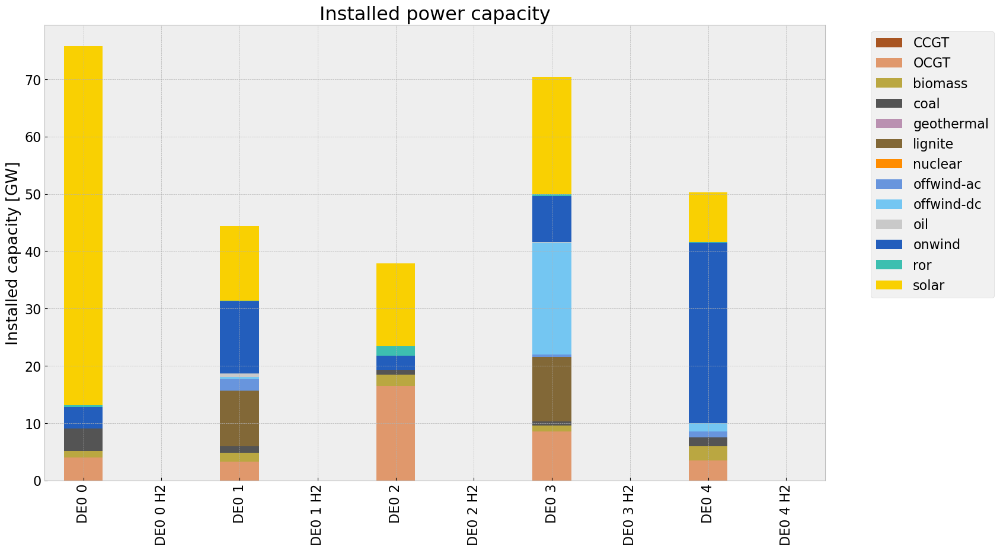

<Figure size 640x480 with 0 Axes>

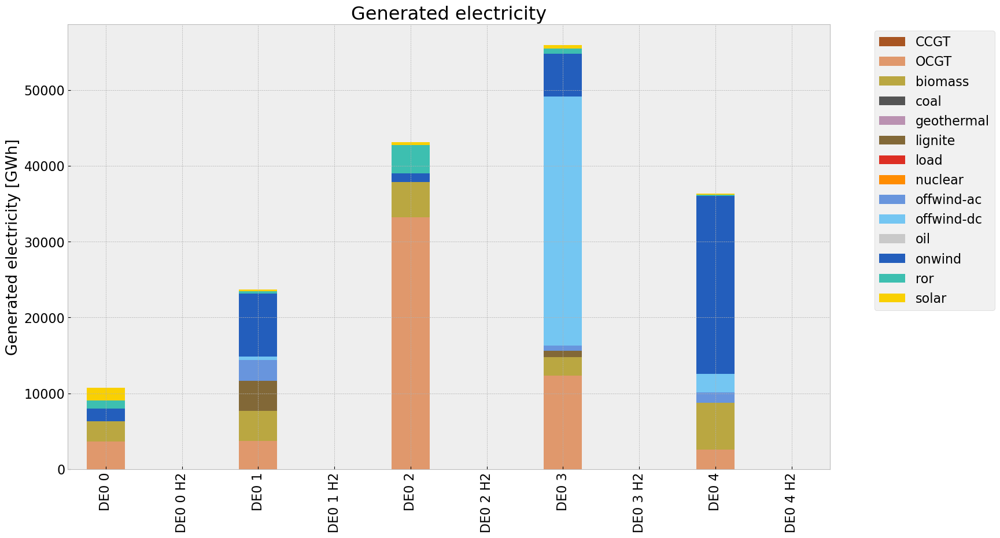

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\1913995090.py:33: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\1913995090.py:34: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\2317594198.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, 

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,5.548628e+07,0.499437,0.1980,2.199734e+07
biomass,1.983637e+07,0.468000,0.0000,0.000000e+00
coal,3.749390e+02,0.329632,0.3361,3.822958e+02
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,4.834709e+06,0.358368,0.4069,5.489456e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,4.831735e+06,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


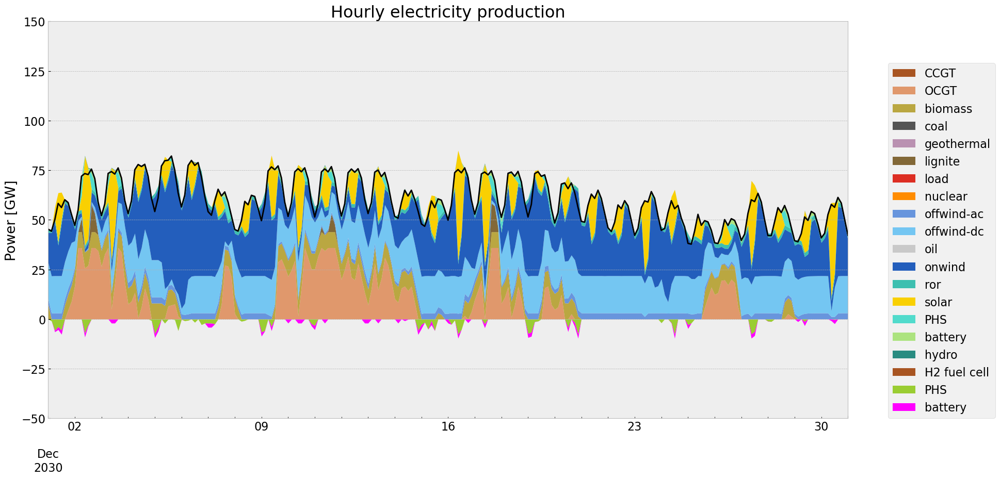

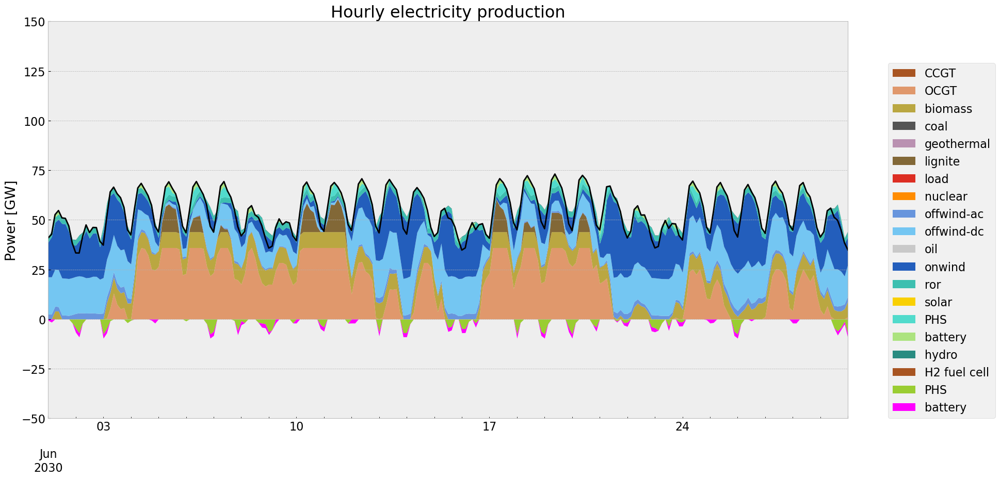

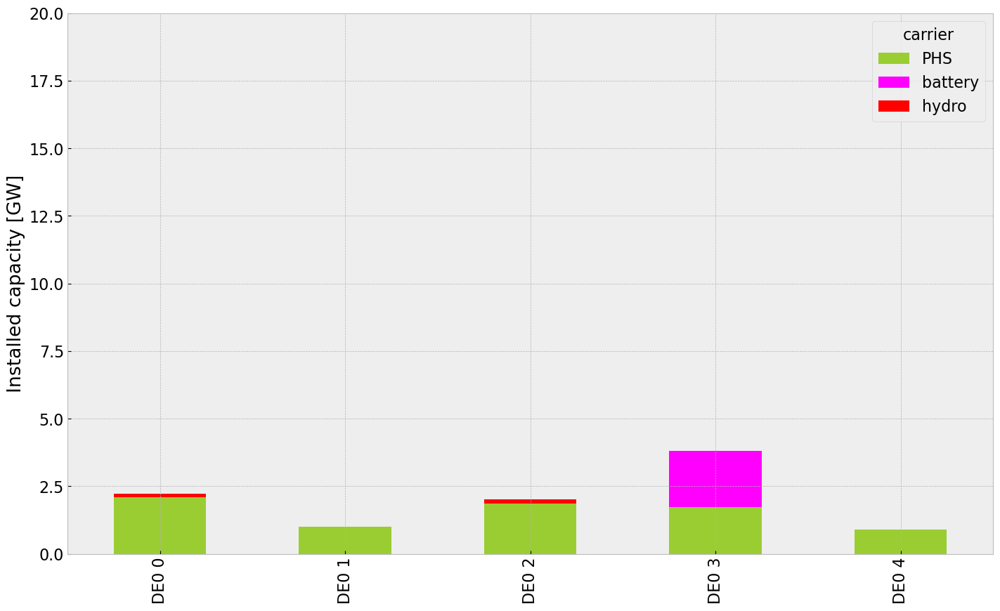

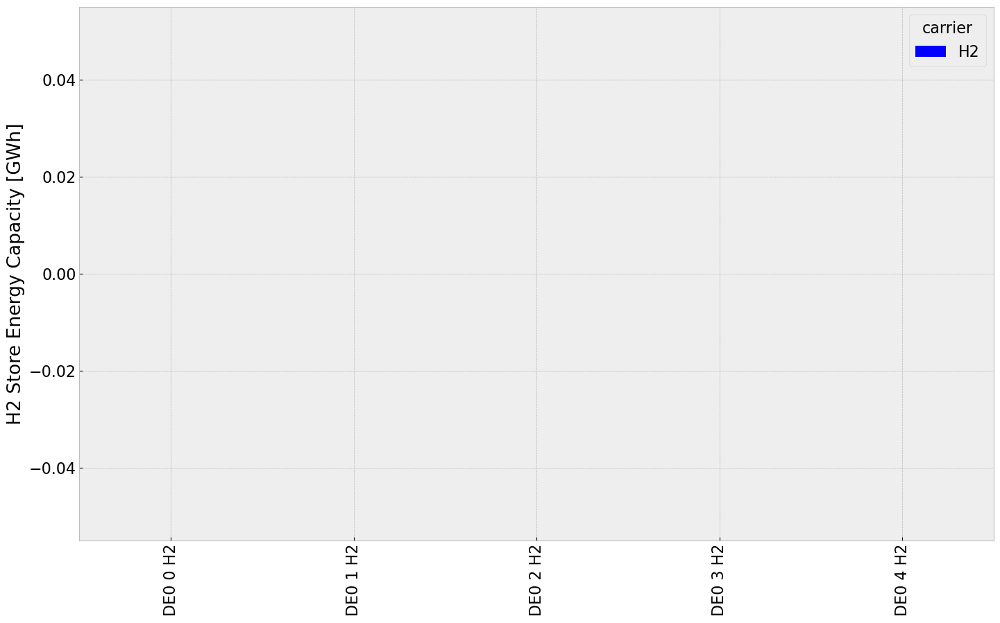

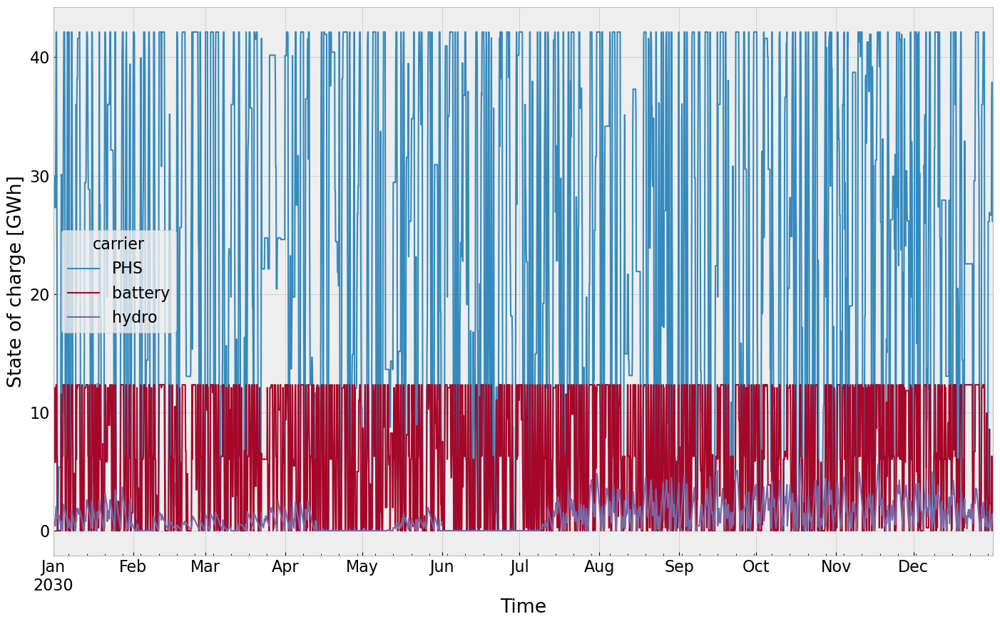

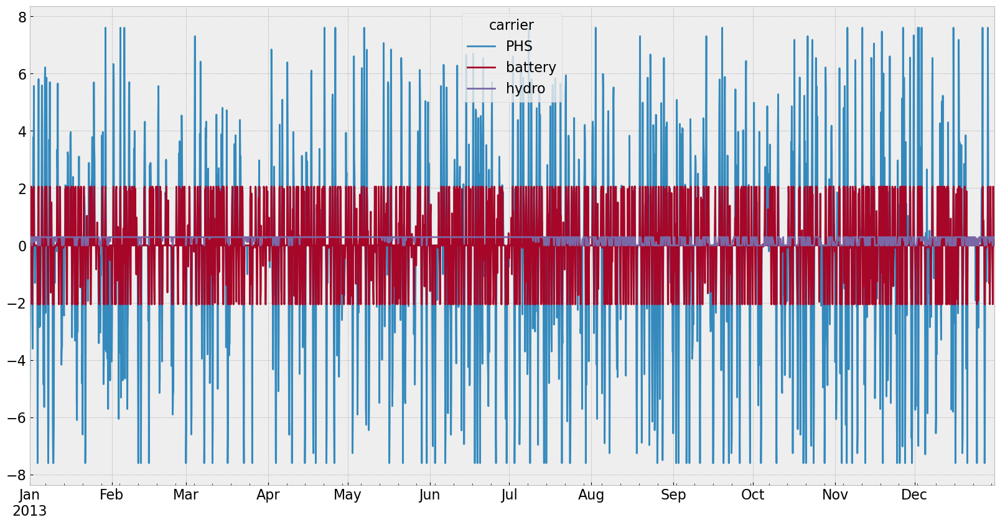

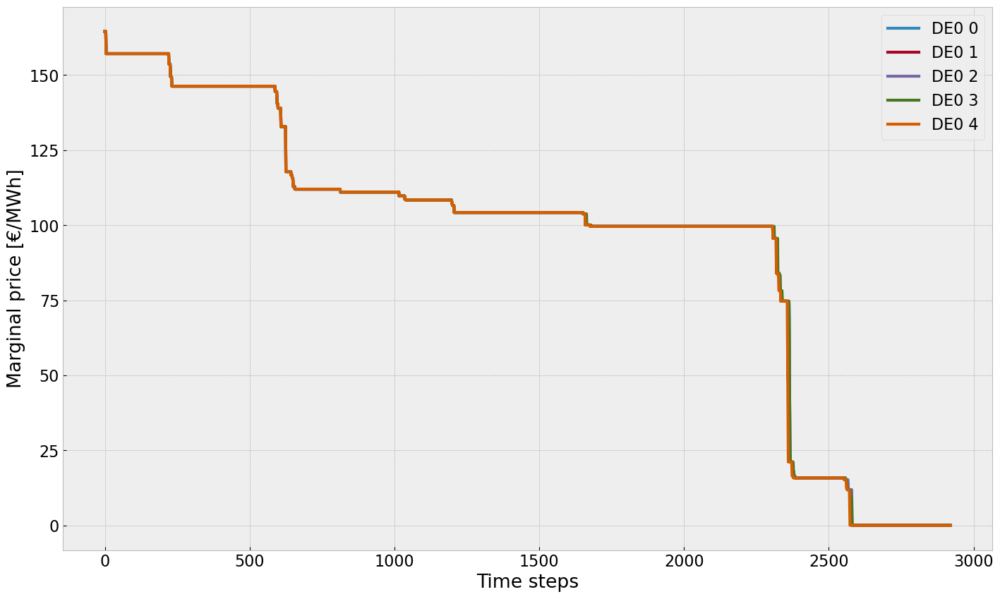

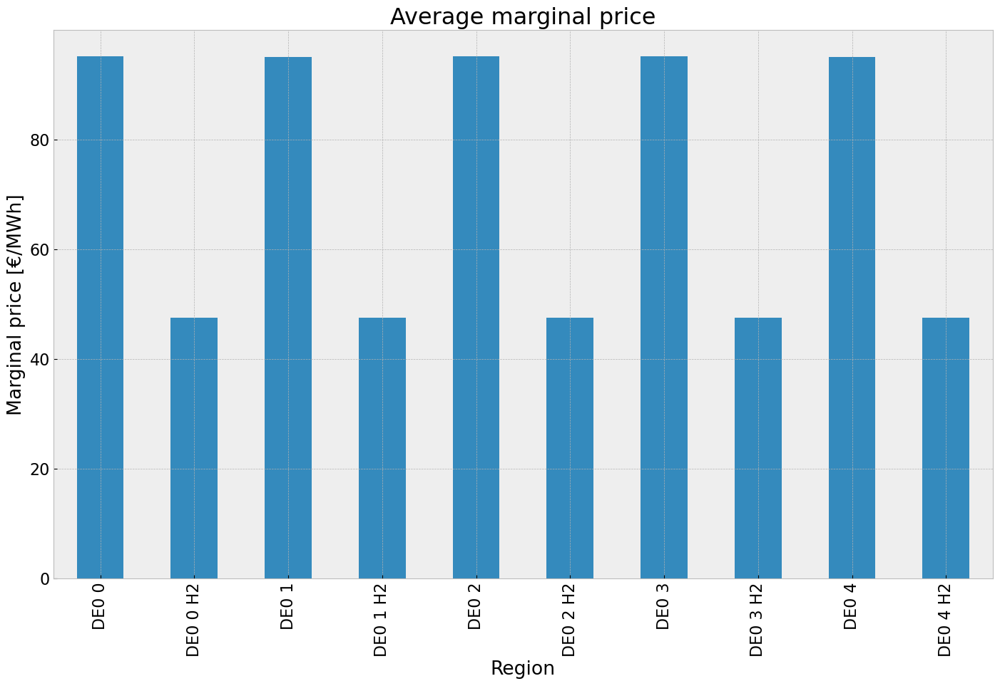

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


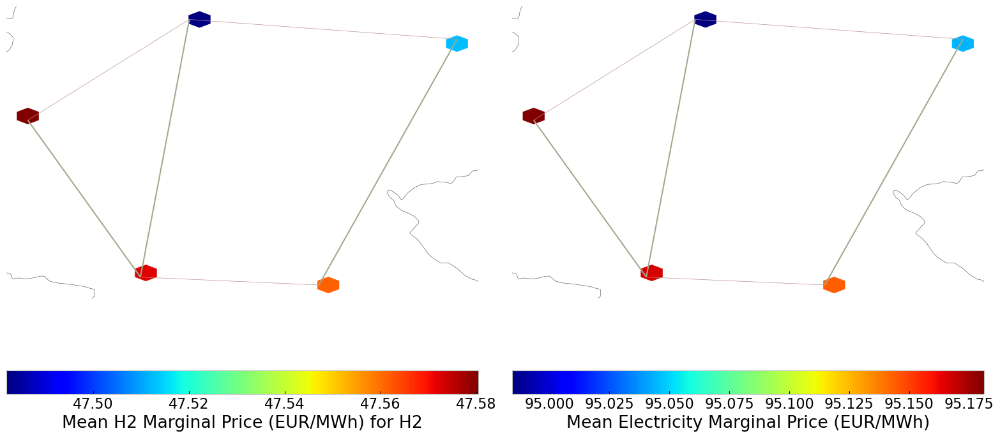

In [77]:
# Plotting
#installed cap
capacities_noinv_roll = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv_roll.fillna(0, inplace=True)
gen = (capacities_noinv_roll.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv_roll = inst_cap_table(n3, color_cap)

#Generation table
# consolidated generation table
carrier = n3.generators.carrier.unique()
df_tot_generation = n3.generators_t.p.sum()

generations = pd.Series(index = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
generations.fillna(0, inplace=True)

gen_noinv_roll =(generations.unstack()/1000)#GWh

gen_noinv_roll  = gen_power_table(n3,colors_gen_table)

#Snapshot Summer and Winter
p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n3, '2030-12-01', '2030-12-31', colors_gen)
gen_curve(n3, '2030-06-01', '2030-06-30', colors_gen)

#installed storage unit & stores
inst_store_table(n3)
inst_storeh2_table(n3)

#State of Charge Storage unit
state_of_charge_plot(n3)
n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))


#Electricitty Price duration curve
price_dur_curve_plot(n3)

#avg electricity price
price_regions_table(n3)
price_regions(n3)

#Emission
em_noinv_roll =em_table(n3)
em_noinv_roll

# Scenario Analysis

## Installed Capacity

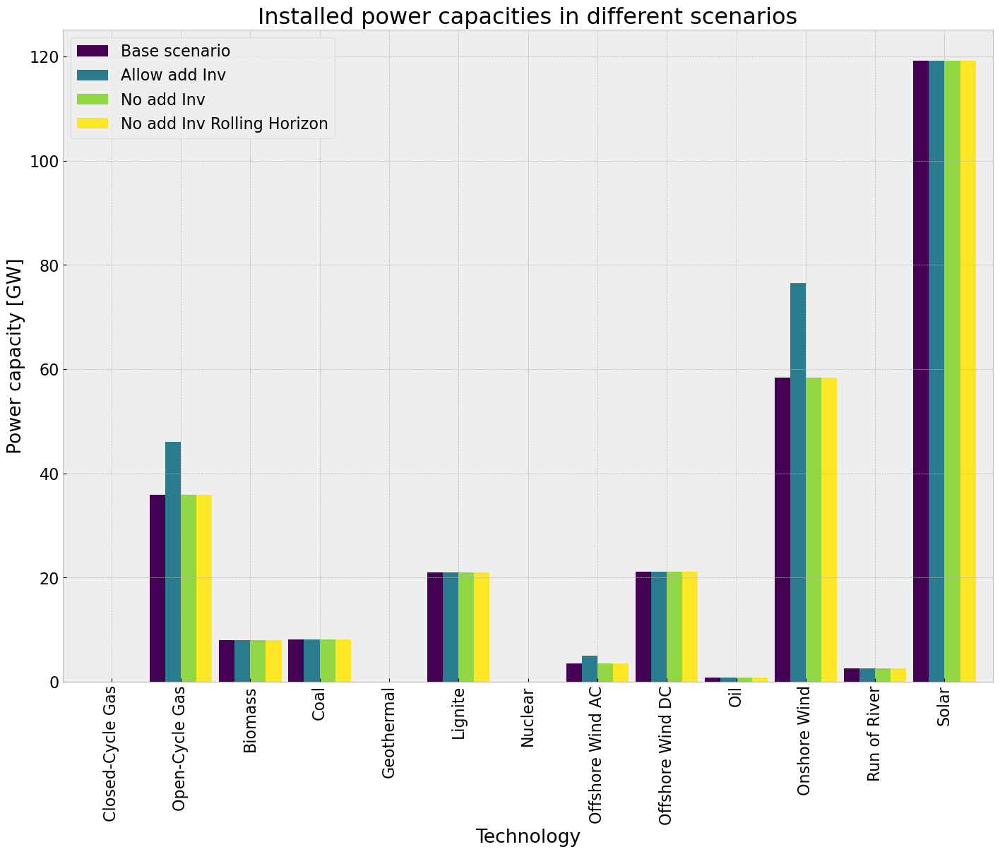

In [78]:
comp_inst_cap = pd.DataFrame(index=capacities_base.unstack().drop(columns=['load'],inplace=False).columns)

comp_inst_cap["Base scenario"] = capacities_base.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["Allow add Inv"] = capacities_inv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv"] = capacities_noinv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv Rolling Horizon"] = capacities_noinv_roll.groupby("carrier").sum().div(1e3).drop(index="load")

comp_inst_cap.rename(index = {"coal": "Coal"}, inplace=True)
comp_inst_cap.rename(index = {"OCGT": "Open-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"CCGT": "Closed-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"ror": "Run of River"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-ac": "Offshore Wind AC"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-dc": "Offshore Wind DC"}, inplace=True)
comp_inst_cap.rename(index = {"onwind": "Onshore Wind"}, inplace=True)
comp_inst_cap.rename(index = {"solar": "Solar"}, inplace=True)
comp_inst_cap.rename(index = {"oil": "Oil"}, inplace=True)
comp_inst_cap.rename(index = {"geothermal": "Geothermal"}, inplace=True)
comp_inst_cap.rename(index = {"nuclear": "Nuclear"}, inplace=True)
comp_inst_cap.rename(index = {"biomass": "Biomass"}, inplace=True)
comp_inst_cap.rename(index = {"lignite": "Lignite"}, inplace=True)

comp_inst_cap.fillna(0, inplace=True)

comp_inst_cap.plot.bar(figsize=(17,12),
                        color=cm.viridis(np.linspace(0, 5, len(comp_inst_cap))),
                        grid=True,
                        xlabel="Technology",
                        ylabel="Power capacity [GW]",
                        title=f"Installed power capacities in different scenarios",
                        #ylim=[0,350],
                        width=0.9
)
plt.show()

In [79]:
comp_inst_cap

,Base scenario,Allow add Inv,No add Inv,No add Inv Rolling Horizon
carrier,,,,
Closed-Cycle Gas,0.000000,0.000000,0.000000,0.000000
Open-Cycle Gas,35.939257,46.054396,35.939257,35.939257
Biomass,8.011736,8.011736,8.011736,8.011736
Coal,8.158220,8.158220,8.158220,8.158220
Geothermal,0.000000,0.000000,0.000000,0.000000
Lignite,20.999170,20.999170,20.999170,20.999170
Nuclear,0.000000,0.000000,0.000000,0.000000
Offshore Wind AC,3.464309,5.004294,3.464309,3.464309
Offshore Wind DC,21.180997,21.180997,21.180997,21.180997


## Power Generation

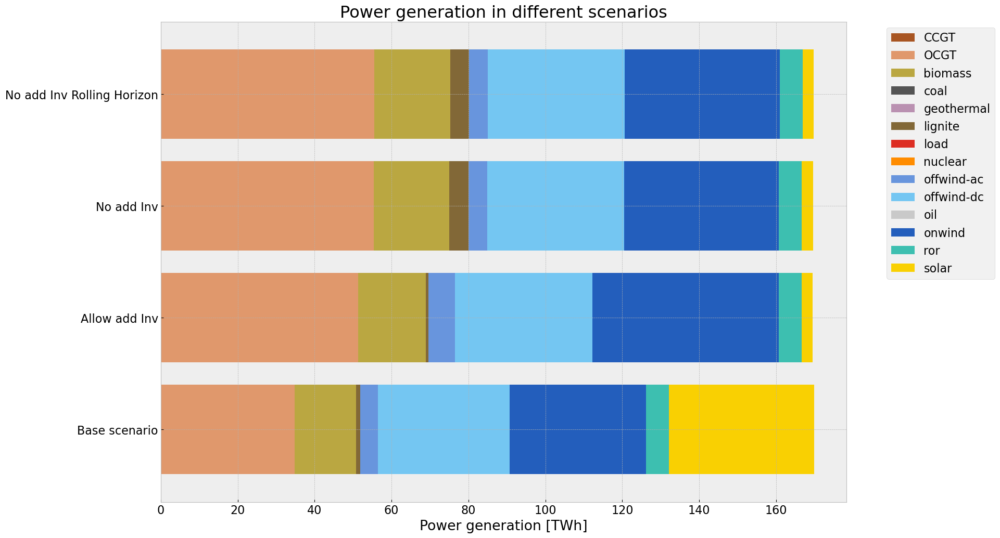

In [80]:
comp_gen_electr = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = tech_list_gen_table)

comp_gen_electr.loc["Base scenario"] = gen_base.sum().div(1e3) # TWh/a
comp_gen_electr.loc["Allow add Inv"] = gen_inv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv"] = gen_noinv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv Rolling Horizon"] = gen_noinv_roll.sum().div(1e3) # TWh/a


#comp_gen_electr.rename(columns = {"coal": "Coal"}, inplace=True)
#comp_gen_electr.rename(columns = {"gas": "Gas"}, inplace=True)
#comp_gen_electr.rename(columns = {"hydro": "Hydro"}, inplace=True)
#comp_gen_electr.rename(columns = {"offwind": "Offshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"onwind": "Onshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"solar": "Solar"}, inplace=True)
#comp_gen_electr.rename(columns = {"oil": "Oil"}, inplace=True)
#comp_gen_electr.rename(columns = {"geothermal": "Geothermal"}, inplace=True)
#comp_gen_electr.rename(columns = {"nuclear": "Nuclear"}, inplace=True)

comp_gen_electr.fillna(0, inplace=True)
comp_gen_electr.plot.barh(figsize=(17,12),
                        color=colors_gen_table,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Power generation [TWh]",
                        title=f"Power generation in different scenarios",
                        #xlim=[0,200],
                        width=0.8
)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Average System Cost

In [87]:
tech_comp = system_cost_base.index.tolist()
comp_system_cost = pd.DataFrame(index = ["Base scenario", "Allowed add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_cost.loc["Base scenario"] = system_cost_base # Million €/a
comp_system_cost.loc["Allowed add Inv"] = system_cost_inv # Million €/a
#if tot_cost_0_PV > 0: 
#    comp_system_cost.loc["0% PV potential"] = system_cost_0_PV # Million €/a
#else: comp_system_cost.loc["0% PV potential"] = 0.0
#if tot_cost_20_PV > 0: 
#    comp_system_cost.loc["20% PV potential"] = system_cost_20_PV # Million €/a
#else: comp_system_cost.loc["20% PV potential"] = 0.0
comp_system_cost.loc["No add Inv"] = system_cost_noinv # Million €/a
comp_system_cost.loc["No add Inv Rolling Horizon"] = system_cost_noinv_roll # Million €/a

#if 'AC' in system_cost_base:
#   comp_system_cost.AC = comp_system_cost.AC-system_cost_base.AC # expenditure for already existing transmission lines

comp_system_cost[comp_system_cost<0] = 0 # since we subtact the AC cost (for the 0% or 20%) 
comp_system_cost.drop('-', axis=1, inplace=True)
#comp_system_cost.iloc[0,0] = system_cost_base.AC


comp_system_cost = comp_system_cost.mul(1e6).div(demand) #eur0/

#comp_system_cost.rename(columns = {"battery storage": "Battery storage"}, inplace=True)
#comp_system_cost.rename(columns = {"hydrogen storage underground": "Hydrogen storage underground"}, inplace=True)

comp_system_cost.fillna(0, inplace=True)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\3585904631.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\3585904631.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


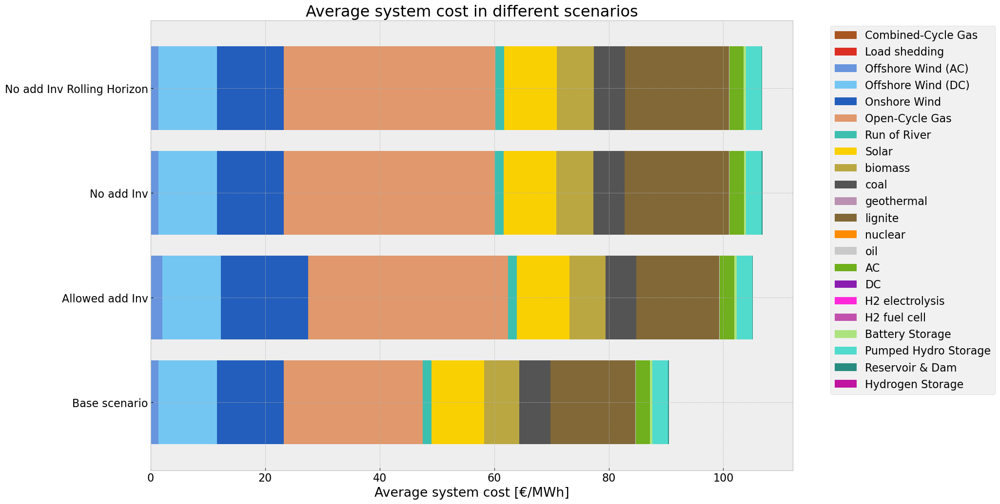

In [88]:
colors_comp = []

for i in range(len(comp_system_cost.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_cost.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="Average system cost [€/MWh]",
                        title=f"Average system cost in different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Curtailment

In [83]:
comp_curtailment = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = stat_base.loc["Generator"].index)

comp_curtailment.loc["Base scenario"] = stat_base.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["Allow add Inv"] = stat_inv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv"] = stat_noinv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv Rolling Horizon"] = stat_noinv_roll.loc["Generator"].Curtailment.div(1e6) # TWh

comp_curtailment.fillna(0, inplace=True)

In [84]:
color_curtailment=[]

for i in range(len(comp_curtailment.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
            color_curtailment.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found 

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\3109801822.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\3109801822.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_curtailment.append(n.carriers.color[j])


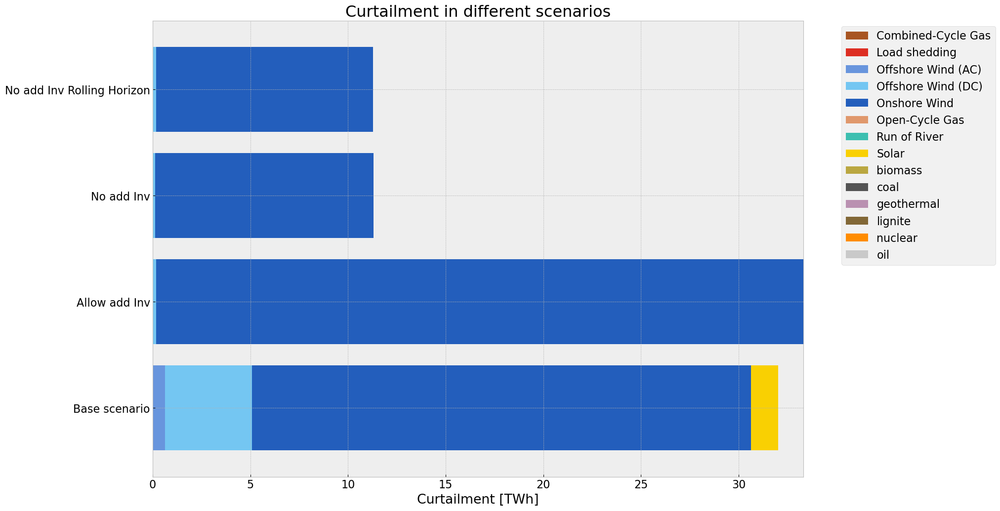

In [85]:
comp_curtailment.plot.barh(figsize=(17,12),
                        color=color_curtailment,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Curtailment [TWh]",
                        title=f"Curtailment in different scenarios",
                        #xlim=[0,120],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Emission

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_4464\189732353.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


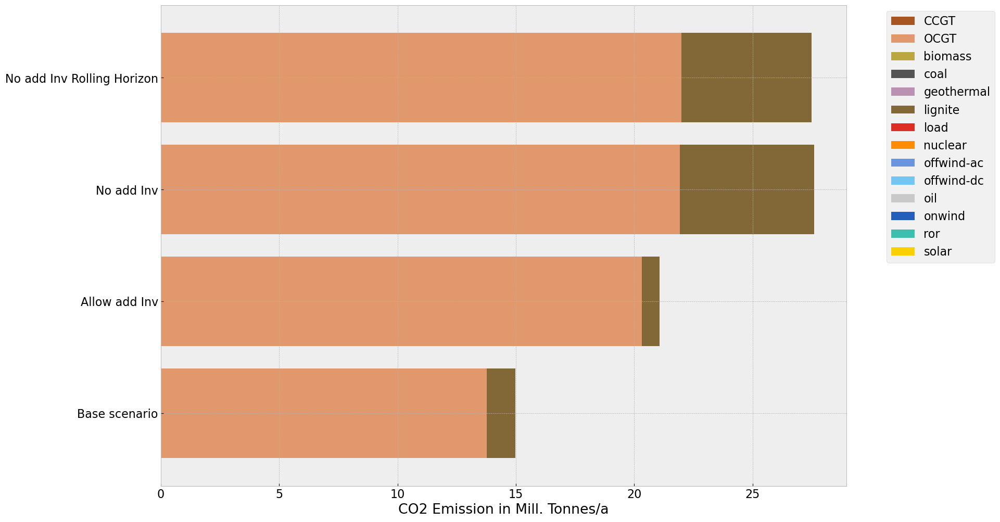

In [86]:
tech_comp = em_base.index.tolist()
comp_system_em = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

#demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_em.loc["Base scenario"] = em_base['emissions in Tonnes CO2']/1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["Allow add Inv"] = em_inv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv"] = em_noinv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv Rolling Horizon"] = em_noinv_roll['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a

comp_system_em.fillna(0, inplace=True)

colors_comp = []

for i in range(len(comp_system_em.columns)):
    for j in range(len(n.carriers.index)):
        if comp_system_em.columns[i] == n.carriers.index[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_em.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="CO2 Emission in Mill. Tonnes/a",
                        #title=f"Average system cost in different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
#global_constraint
#plt.axvline(x=n.global_constraints.loc['CO2Limit','constant']/1e6, color='r', linestyle='-', linewidth=2, label='CO2 cap')
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()